In [134]:
import asyncio
from copra.websocket import Channel, Client
import matplotlib.pyplot as plt
from collections import OrderedDict
from time import sleep
from dateutil import parser
import copy
import datetime
import itertools
from operator import itemgetter
import numpy as np
from dateutil.tz import tzutc
import math
import pytz
from pytz import timezone
import pickle
import pylab
from scipy.stats import probplot,expon,kstest,norm
import matplotlib.pyplot as plt
import json
from datetime import timedelta
import pandas as pd
from scipy.stats.stats import pearsonr
import bisect
import scipy.stats as ss

In [135]:
file_name = 'data/12_30_18.json'
with open(file_name, "r") as f:
    data = [json.loads(line) for line in f]
starting_time = parser.parse(data[0][0])
starting_bids = data[0][1]
starting_asks = data[0][2]

raw_updates = data[1:]

Bids = {}
Asks = {}    

for price, amount in starting_bids:
    Bids[int(round((float(price)*100)))] = float(amount)
for price, amount in starting_asks:
    Asks[int(round((float(price)*100)))] = float(amount)

bids = Bids.items()
bid_prices = [b[0] for b in bids]
bid_volumes = [b[1] for b in bids]

asks = Asks.items()
ask_prices = [a[0] for a in asks]
ask_volumes = [a[1] for a in asks]

best_bid = bid_prices[0]
best_ask = ask_prices[0]

reference_price = round(float(best_bid + best_ask) / 2,1)

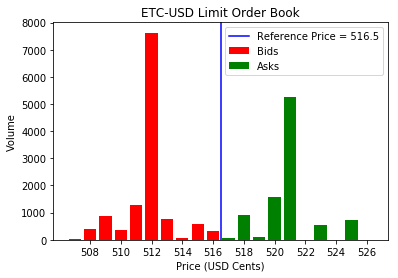

In [42]:
bid_prices = bid_prices[0:10]
bid_volumes = bid_volumes[0:10]
ask_prices = ask_prices[0:10]
ask_volumes = ask_volumes[0:10]

b1 = plt.bar(bid_prices, bid_volumes, color='r')
b2 = plt.bar(ask_prices, ask_volumes, color='g')
v = plt.axvline(x=reference_price, color='b')
plt.xticks([x for x in range(min(bid_prices), max(ask_prices) + 1)if x % 2 == 0])

plt.title('ETC-USD Limit Order Book')
plt.legend(['Reference Price = {}'.format(reference_price), 'Bids', 'Asks'])
plt.xlabel('Price (USD Cents)')
plt.ylabel('Volume')
plt.savefig('12_30_18_LOB.png')
plt.show()

# Load Data

In [136]:
def parse_file_json(file_name):
    with open(file_name, "r") as f:
        data = [json.loads(line) for line in f]
    starting_time = parser.parse(data[0][0])
    starting_bids = data[0][1]
    starting_asks = data[0][2]
    
    raw_updates = data[1:]
    
    Bids = {}
    Asks = {}    
    
    updates = []
    
    for price, amount in starting_bids:
        Bids[int(round((float(price)*100)))] = float(amount)
    for price, amount in starting_asks:
        Asks[int(round((float(price)*100)))] = float(amount)
        
    for u in raw_updates:
        price = int(round((float(u["price"])*100)))  
        side = u["side"]
        amount = float(u["amount"])
        time = parser.parse(u["time"])
        
        if side == "buy":
            change = amount - Bids.get(price,0)
        else:
            change = amount - Asks.get(price,0)
        
        updates.append({\
            "Bids": copy.copy(Bids), \
            "Asks": copy.copy(Asks), \
            "time": time, \
            "side": side, \
            "price": price, \
            "change": change            
        })
        
        if side == "buy":
            if u["amount"] == "0":
                del Bids[price]
            else:
                Bids[price] = float(amount)
        else:
            if u["amount"] == "0":
                del Asks[price]
            else:
                Asks[price] = float(amount)   

    return(starting_time, updates)

In [137]:
def shortened_updates(file_name,K):
    starting_time, updates = parse_file_json(file_name)
    
    res = []
    
    # Caluclate first reference price
    starting_bids = updates[0]['Bids']
    starting_asks = updates[0]['Asks']
    sorted_bids = list(reversed(sorted(starting_bids.items())))
    sorted_asks = list(sorted(starting_asks.items()))        
    best_bid = sorted_bids[0][0]
    best_ask = sorted_asks[0][0]
    if ((best_bid + best_ask) % 2) != 0:
        old_reference_price = round((best_bid+best_ask)/2, 1)
    else:
        old_reference_price = round((best_bid+best_ask+1)/2, 1)
            
    for u in updates:      
        # Find reference price
        sorted_bids = list(reversed(sorted(u['Bids'].items())))
        sorted_asks = list(sorted(u['Asks'].items()))        
        best_bid = sorted_bids[0][0]
        best_ask = sorted_asks[0][0]
        if ((best_bid + best_ask) % 2) != 0:
            reference_price = round((best_bid+best_ask)/2, 1)
        else:
            middle = (best_bid+best_ask)/2
            if old_reference_price > middle:
                reference_price = round((best_bid+best_ask)/2 + 0.5,1)
            else:
                old_reference_price = round((best_bid+best_ask)/2 - 0.5,1)
                
        shortened_book = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
        first_bid = int(round(reference_price - 0.5))
        first_ask = int(round(reference_price + 0.5))        
        for k in range(-K,0):
            shortened_book[k] = u['Bids'].get(first_bid + k + 1,0)
        for k in range(1,K+1):
            shortened_book[k] = u['Asks'].get(first_ask + k - 1,0)
            
        # Find k from the price. Keep track of event if
        # abs(k) <= K
        price = u["price"]
        k = price - reference_price
        if k < 0:
            k = int(round(k - 0.5))
        else:
            k = int(round(k + 0.5))
        if abs(k) <= K:                 
            res.append({
                'reference_price': reference_price,
                'LOB': copy.copy(shortened_book),
                'k': k,
                'change': u['change'],
                'time': u['time']
            })
        
        old_reference_price = reference_price

    return starting_time, res

# Combine Updates that Occur At Same Time

# Combine Orders that Occur in Quick Succession
### (Orders that occur within 0.01 seconds of each other)

In [138]:
def processed_updates(file_name,K):
    starting_time,updates = shortened_updates(file_name,10)
    grouped_by_time = OrderedDict([(k, list(v)) for k, v in itertools.groupby(updates, key=lambda x:x['time'])])
    # Contains dictionary of time, reference price, order book, list of changes
    cleaned_updates = []
    for t, us in grouped_by_time.items():
        if len(us) == 1:
            u = us[0]
            cleaned_updates.append(copy.copy(u))
        else:
            new_update = {'time': t}
            us = sorted(us, key=lambda u:-abs(u['k']))
            grouped_by_k = OrderedDict((k, list(v)) for k, v in itertools.groupby(us, key=lambda u:u['k']))
            reference_k = list(grouped_by_k.keys())[0]
            new_update['reference_price'] = grouped_by_k[reference_k][0]['reference_price']
            new_update['LOB'] = copy.copy(grouped_by_k[reference_k][0]['LOB'])
            events = []
            for k in grouped_by_k:
                combined_change = 0
                for u in grouped_by_k[k]:
                    combined_change = combined_change + u['change']
                events.append((k,combined_change))
            for k,change in events:
                new_update = copy.deepcopy(new_update)
                new_update['k'] = k
                new_update['change'] = change
                cleaned_updates.append(new_update)
    
    combined_updates = []
    i = 0
    while i < len(cleaned_updates):
        reference_price = cleaned_updates[i]['reference_price']
        j = i
        updates_at_reference = []
        while (j < len(cleaned_updates)) and (cleaned_updates[j]['reference_price'] == reference_price):
            updates_at_reference.append(cleaned_updates[j])
            j += 1
        updates_at_reference = sorted(updates_at_reference,key=lambda u:u['k'])
        grouped_by_k = OrderedDict((k, list(v)) for k, v in itertools.groupby(updates_at_reference, key=lambda u:u['k']))
        for k,us in grouped_by_k.items():
            us = copy.deepcopy(sorted(us,key=lambda u:u['time']))
            keep_index = [True for u in us]
            for m in reversed(range(1,len(us))):
                quick_same_order = (us[m]['time'] - us[m-1]['time']).total_seconds() < 0.01
                same_sign = (us[m]['change'] * us[m-1]['change']) > 0
                if quick_same_order and same_sign:
                    us[m-1]['change'] += us[m]['change']
                    keep_index[m] = False
            for (u,keep) in zip(us, keep_index):
                if keep:
                    combined_updates.append(u)
        i = j + 1

    combined_updates = sorted(combined_updates,key=lambda u:u['time'])
    
    return starting_time, combined_updates

starting_time, combined_updates = processed_updates('12_28_18.json',10)
len(combined_updates)

305806

# Calculate Average Event Size at Each Position

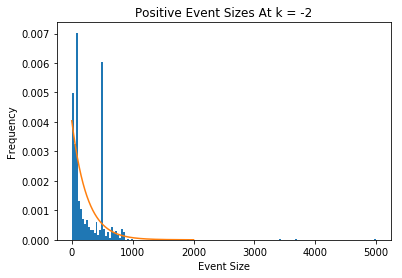

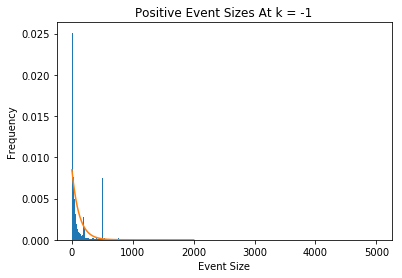

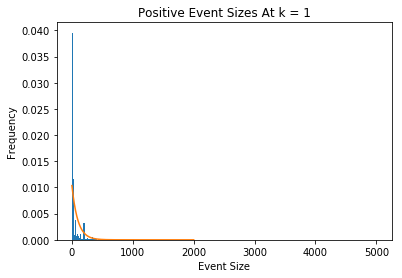

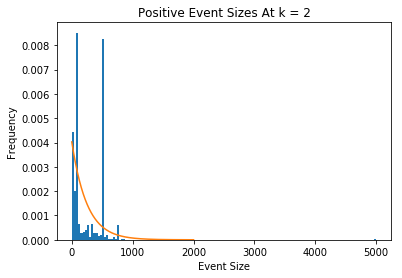

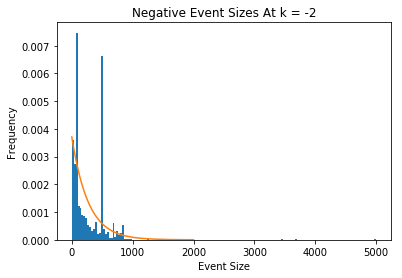

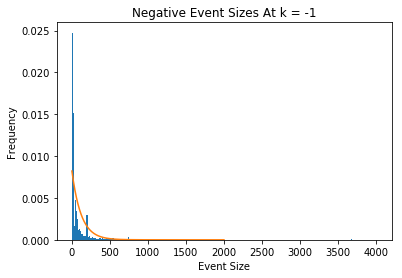

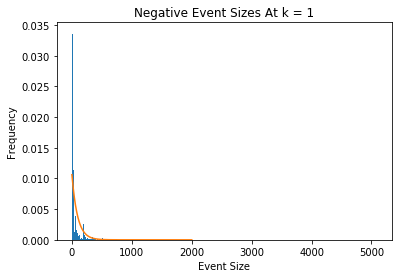

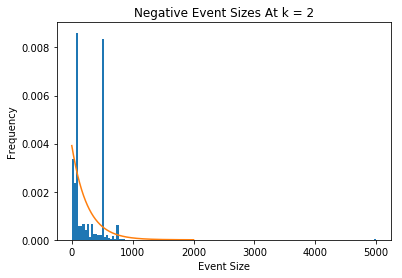

In [130]:
K = 10
# Get Average Event Sizes
event_sizes_pos = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])
event_sizes_neg = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])
for update in combined_updates:
    if update['change'] > 0:
        event_sizes_pos[update['k']].append(update['change'])
    else:
        event_sizes_neg[update['k']].append(-update['change'])
        
for k in range(-2,3):
    if k != 0:
        sizes = event_sizes_pos[k]
        AES = np.mean(sizes)

        rX = np.linspace(0,2000,1000)
        rP = ss.expon.pdf(rX, 0, AES)

        plt.hist(sizes,bins='auto',density=True)
        plt.plot(rX,rP)
        plt.title('Positive Event Sizes At k = {}'.format(k))
        plt.xlabel('Event Size')
        plt.ylabel('Frequency')
        # plt.legend(['Event Sizes', 'AES = {}'.format(round(AES,3))])
        plt.savefig('Sizes/pos_{}'.format(k),dpi=500)
        plt.show()
    
    
for k in range(-2,3):
    if k != 0:
        sizes = event_sizes_neg[k]
        AES = np.mean(sizes)

        rX = np.linspace(0,2000,1000)
        rP = ss.expon.pdf(rX, 0, AES)

        plt.hist(sizes,bins='auto',density=True)
        plt.plot(rX,rP)
        plt.title('Negative Event Sizes At k = {}'.format(k))
        plt.xlabel('Event Size')
        plt.ylabel('Frequency')
        # plt.legend(['Event Sizes', 'AES = {}'.format(round(AES,3))])
        plt.savefig('Sizes/neg_{}'.format(k),dpi=500)
        plt.show()
        
        


In [132]:
for k in range(-10,11):
    if k != 0:
        print("k = {}".format(k))
        print("pos")
        print("n = {}".format(len(event_sizes_pos[k])))
        print("AES = {}".format(np.mean(event_sizes_pos[k])))
        print("neg")
        print("n = {}".format(len(event_sizes_neg[k])))
        print("AES = {}".format(np.mean(event_sizes_neg[k])))
        print()

k = -10
pos
n = 138
AES = 536.7206216497101
neg
n = 205
AES = 550.861694173561

k = -9
pos
n = 276
AES = 331.1257670644928
neg
n = 302
AES = 280.92776646258284

k = -8
pos
n = 388
AES = 534.5932921026289
neg
n = 430
AES = 659.5133130197675

k = -7
pos
n = 1249
AES = 566.1041314903042
neg
n = 1207
AES = 577.186233375725

k = -6
pos
n = 4145
AES = 520.4931408977129
neg
n = 4017
AES = 537.978198936816

k = -5
pos
n = 7615
AES = 471.58372169073675
neg
n = 7655
AES = 470.2113053492907

k = -4
pos
n = 8958
AES = 463.9714144188066
neg
n = 9115
AES = 453.1586969730313

k = -3
pos
n = 11584
AES = 405.31184218884323
neg
n = 11837
AES = 399.328811180234

k = -2
pos
n = 19494
AES = 247.60978055398175
neg
n = 18324
AES = 269.6568750541732

k = -1
pos
n = 20666
AES = 117.95137771242138
neg
n = 18028
AES = 121.72967649068673

k = 1
pos
n = 19064
AES = 96.55609035022607
neg
n = 18402
AES = 94.20911351013041

k = 2
pos
n = 13420
AES = 248.5031452080641
neg
n = 13641
AES = 255.25046176604795

k = 3
pos


-10
Proportion not 5000: 0.9768339768339769
Average not 5000: 378.6734617437945
Average 5000: 485.73121938679543


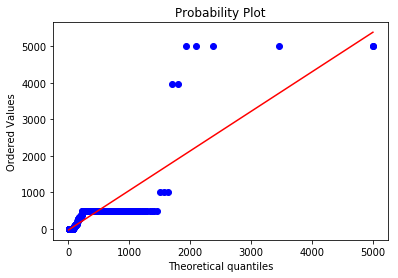

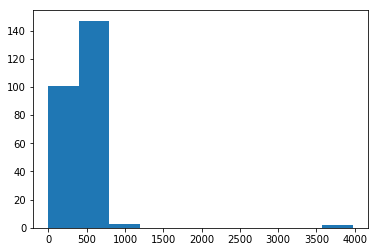

-9
Proportion not 5000: 1.0
Average not 5000: 393.7158791132831
Average 5000: 393.7158791132831


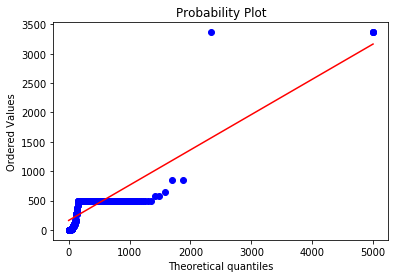

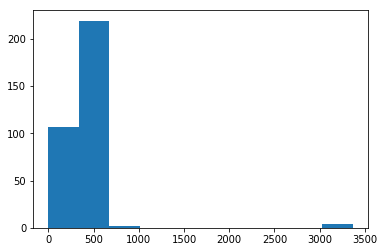

-8
Proportion not 5000: 0.9832214765100671
Average not 5000: 396.9845115034983
Average 5000: 474.21631500176187


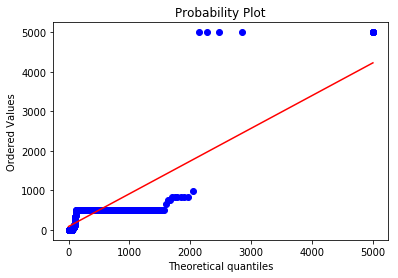

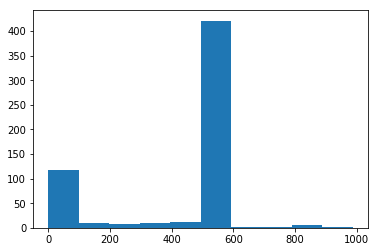

-7
Proportion not 5000: 1.0
Average not 5000: 397.50576373618054
Average 5000: 397.50576373618054


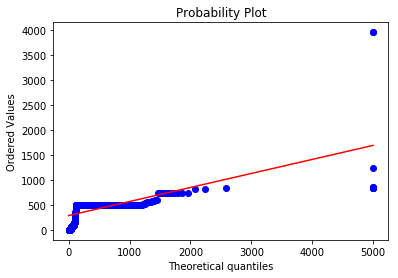

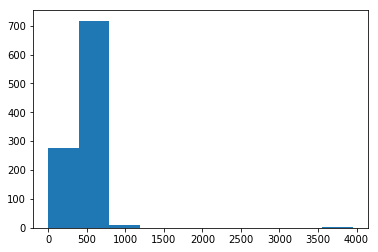

-6
Proportion not 5000: 0.9914841849148418
Average not 5000: 378.24768127099384
Average 5000: 417.605669386691


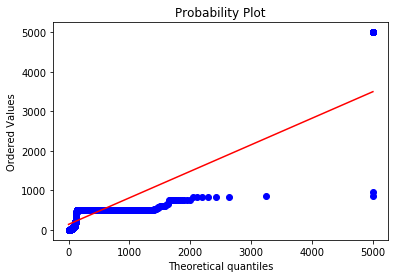

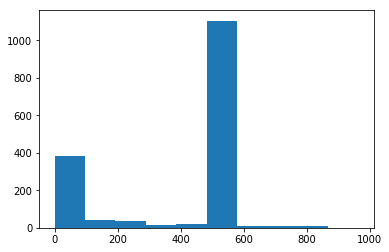

-5
Proportion not 5000: 0.9982375749030666
Average not 5000: 377.70305828009185
Average 5000: 385.84951041565733


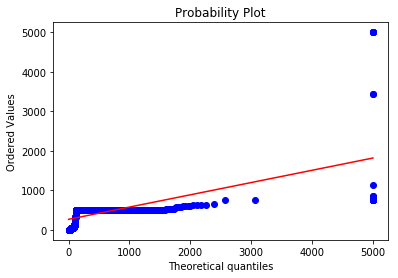

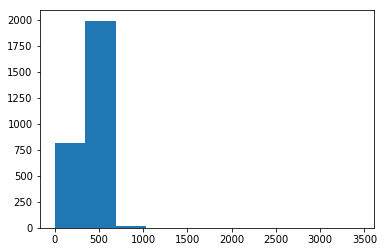

-4
Proportion not 5000: 0.9927248677248677
Average not 5000: 386.97948706658224
Average 5000: 420.5398214860715


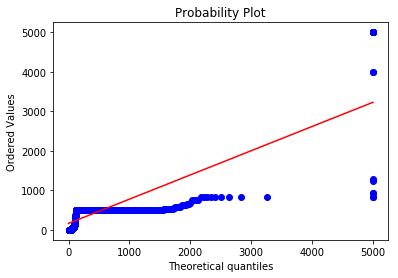

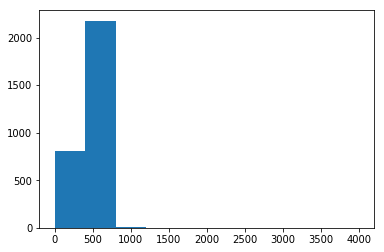

-3
Proportion not 5000: 0.9979736575481256
Average not 5000: 304.3602026753096
Average 5000: 313.8751769353394


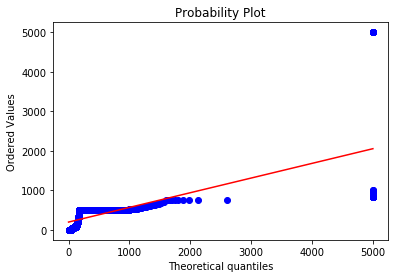

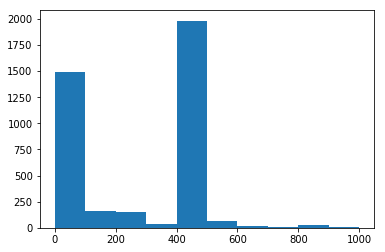

-2
Proportion not 5000: 0.9937202664129401
Average not 5000: 320.8154769949598
Average 5000: 350.1995092041256


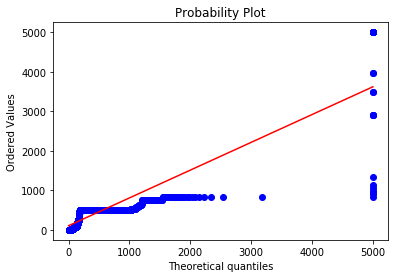

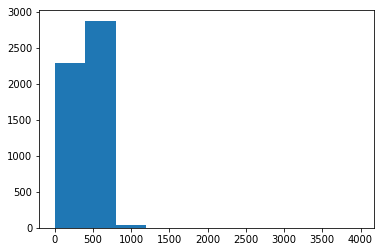

-1
Proportion not 5000: 0.9972403776325345
Average not 5000: 281.5137005867871
Average 5000: 294.5349409192273


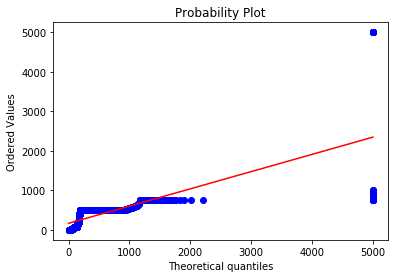

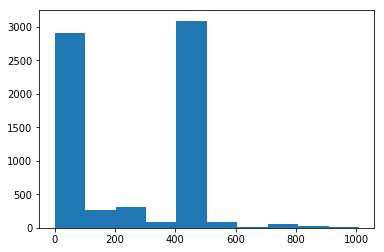

1
Proportion not 5000: 0.9935275080906149
Average not 5000: 272.216536360971
Average 5000: 302.81707657869936


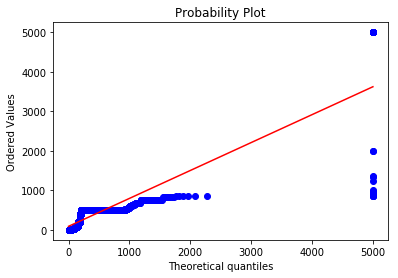

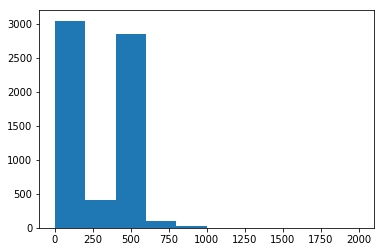

2
Proportion not 5000: 0.9937711577522004
Average not 5000: 266.8103552607903
Average 5000: 296.29264688678944


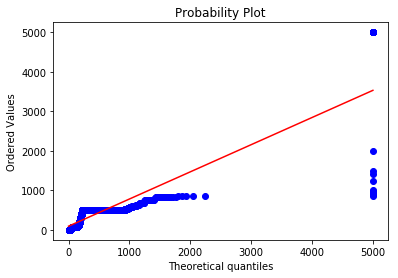

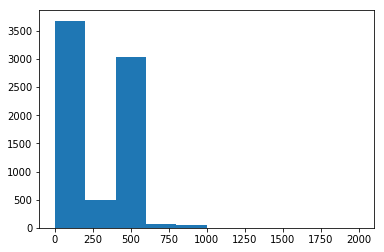

3
Proportion not 5000: 0.9938381487060113
Average not 5000: 301.907421698698
Average 5000: 330.8563695315829


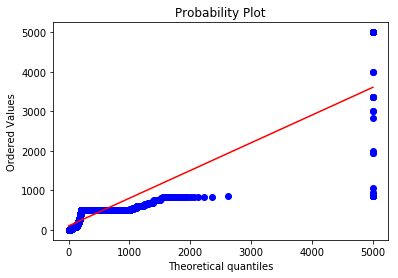

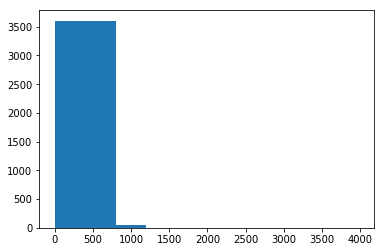

4
Proportion not 5000: 0.9944326617179216
Average not 5000: 242.50149449703636
Average 5000: 268.98809805365414


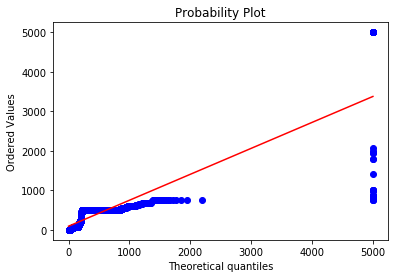

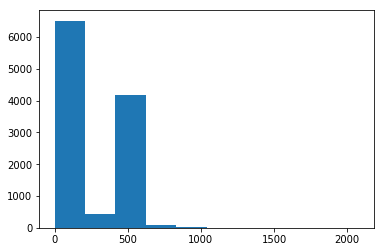

5
Proportion not 5000: 0.9961236732810337
Average not 5000: 249.04361165979805
Average 5000: 267.45987084856483


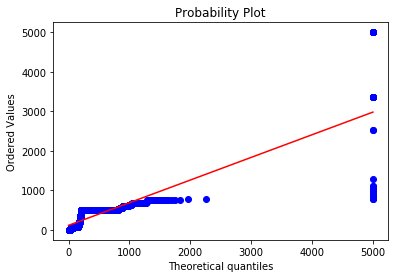

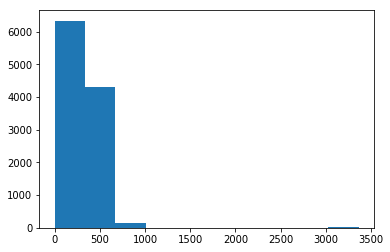

6
Proportion not 5000: 0.995113369820172
Average not 5000: 270.68934762776473
Average 5000: 293.7997397914288


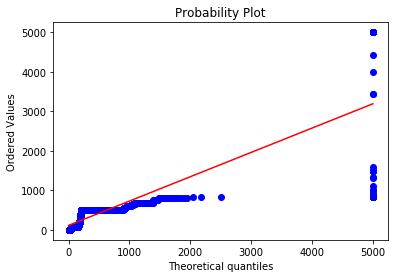

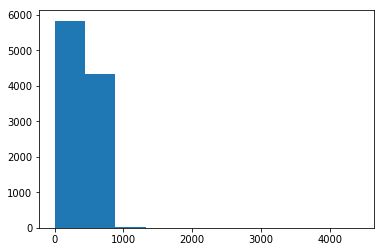

7
Proportion not 5000: 0.9954103176060216
Average not 5000: 285.4401407254159
Average 5000: 307.0784731068854


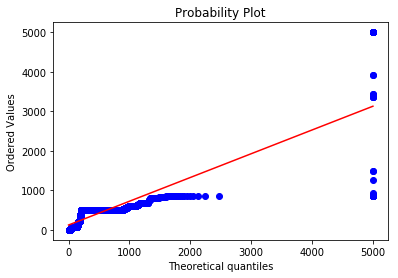

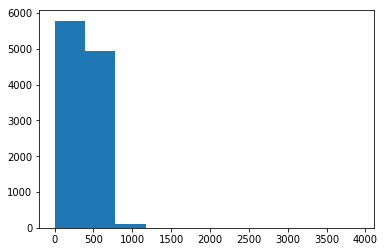

8
Proportion not 5000: 0.9979200713118407
Average not 5000: 228.71329275155134
Average 5000: 238.63722885339027


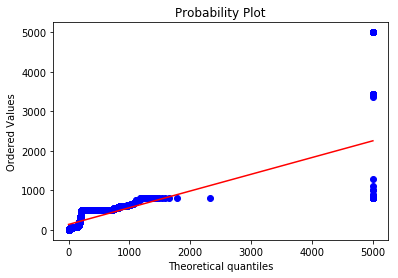

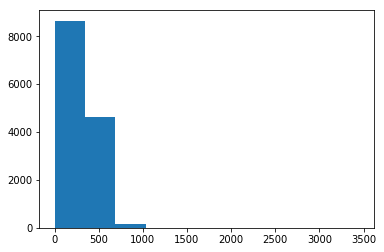

9
Proportion not 5000: 0.9921827411167513
Average not 5000: 237.25708675661616
Average 5000: 274.488681103798


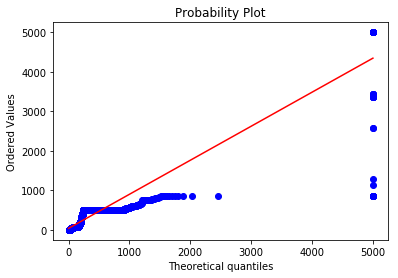

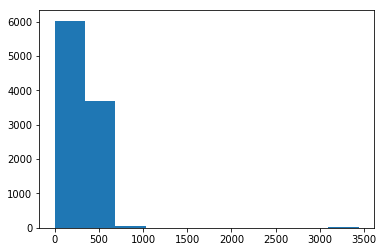

10
Proportion not 5000: 0.9964344222800424
Average not 5000: 220.22865699196902
Average 5000: 237.2713031990903


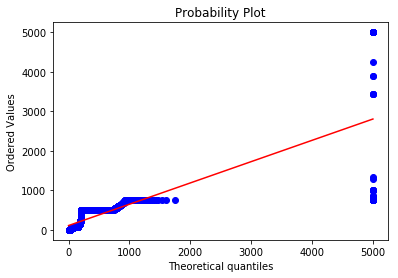

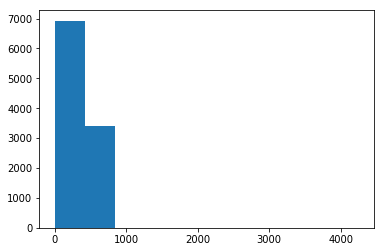

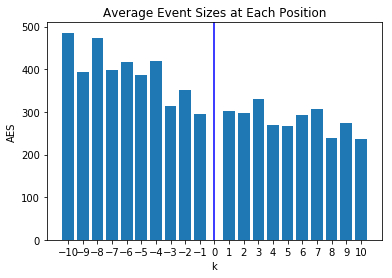

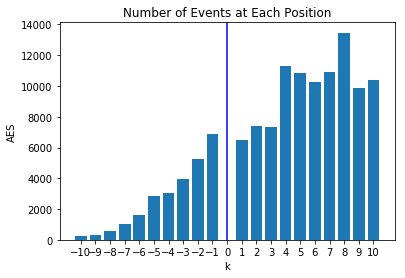

In [9]:
K = 10
starting_ref_price = 457.5
# Get Average Event Sizes
event_sizes = OrderedDict([(i,[]) for i in range(-K,K+1) if i != 0])
for update in combined_updates:
    event_sizes[update['k']].append(abs(update['change']))
    
class queue_dist:
    def __init__(self, AES):
        self.AES = AES
    def ppf(self,ys):
        rate = 1/(self.AES-50)
        res = [y for y in ys]
        for i in range(len(res)):
            if res[i] >= 0.99:
                res[i] = np.float64(5000)
            else:
                res[i] = -np.log(1-(1-np.exp(-5000*rate))*res[i]/0.99)/rate
        return np.float64(res)
    
for k,sizes in event_sizes.items():
    print(k)
    not_5000 = [s for s in sizes if s < 4500]
    print("Proportion not 5000: {}".format(len(not_5000)/len(sizes)))
    print("Average not 5000: {}".format(np.mean(not_5000)))
    AES = np.mean(sizes)
    print("Average 5000: {}".format(AES))
    probplot(sizes, dist=queue_dist(AES), plot=pylab)
    pylab.show()
    plt.hist(not_5000)
    plt.show()
    
    
AESs = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
numbers_of_events = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
for (k,sizes) in event_sizes.items():
    AESs[k] = np.mean(sizes)
    numbers_of_events[k] = len(sizes)
    
k,AES = zip(*AESs.items())
        
b1 = plt.bar(k, AES)
v = plt.axvline(x=0, color='b')
plt.xticks([i for i in range(-K,K+1)])        
plt.title('Average Event Sizes at Each Position')
plt.xlabel('k')
plt.ylabel('AES')
plt.show()

k,number_of_events = zip(*numbers_of_events.items())
b1 = plt.bar(k, number_of_events)
v = plt.axvline(x=0, color='b')
plt.xticks([i for i in range(-K,K+1)])        
plt.title('Number of Events at Each Position')
plt.xlabel('k')
plt.ylabel('AES')
plt.show()

# Get time between events at each position and queue size

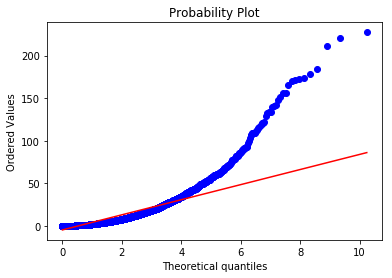

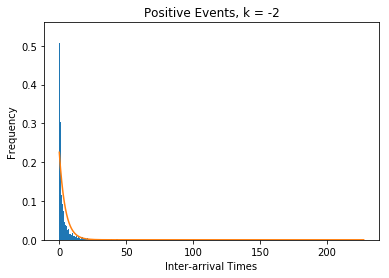

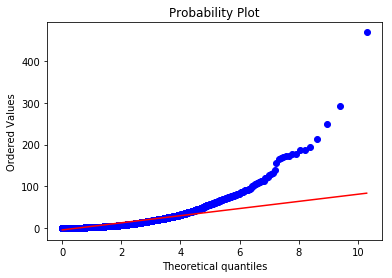

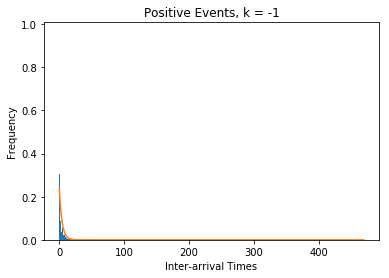

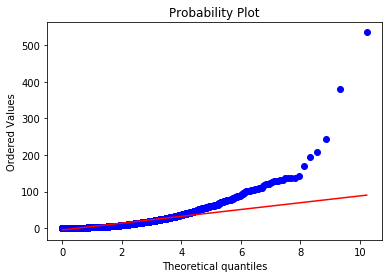

...

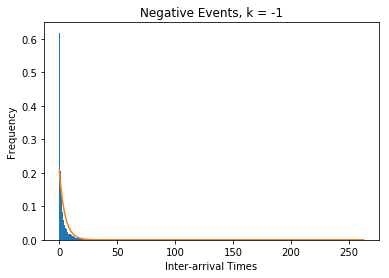

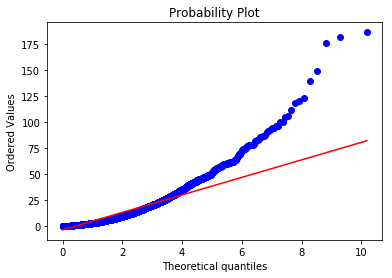

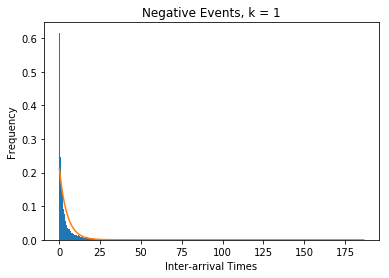

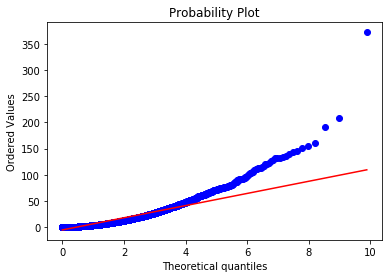

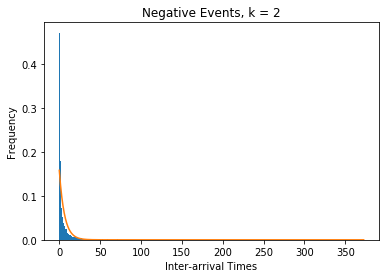

In [124]:
time_between_events_pos = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])
time_between_events_neg = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])

t = starting_time
for update in combined_updates:
    t = update['time']
    if update['change'] > 0:
        time_between_events_pos[update['k']].append(update['time'])
    else:
        time_between_events_neg[update['k']].append(update['time'])
        
for k in time_between_events_pos:
    times = time_between_events_pos[k]
    for i in range(0, len(times)-1):
        times[i] = (times[i+1] - times[i]).total_seconds()
    times.pop()
    time_between_events_pos[k] = times
    
for k in time_between_events_neg:
    times = time_between_events_neg[k]
    for i in range(0, len(times)-1):
        times[i] = (times[i+1] - times[i]).total_seconds()
    times.pop()
    time_between_events_neg[k] = times

for k in range(-2,2+1):
    if k != 0:
        times = time_between_events_pos[k]
        probplot(times, dist=expon, plot=pylab)
        pylab.savefig('Arrivals/QQ_pos_k{}'.format(k),dpi=500)
        pylab.show()
        
        average = np.mean(times)
        rX = np.linspace(0,max(times),1000)
        rP = ss.expon.pdf(rX, 0, average)
        
        plt.hist(times,bins='auto',density=True)
        plt.plot(rX,rP)
        plt.title('Positive Events, k = {}'.format(k))
        plt.xlabel('Inter-arrival Times')
        plt.ylabel('Frequency')
        plt.savefig('Arrivals/hist_pos_k{}'.format(k),dpi=500)
        plt.show()
        
for k in range(-2,2+1):
    if k != 0:
        times = time_between_events_neg[k]
        probplot(times, dist=expon, plot=pylab)
        pylab.savefig('Arrivals/QQ_neg_k{}'.format(k),dpi=500)
        pylab.show()
        
        average = np.mean(times)
        rX = np.linspace(0,max(times),1000)
        rP = ss.expon.pdf(rX, 0, average)
        
        plt.hist(times,bins='auto',density=True)
        plt.plot(rX,rP)
        plt.title('Negative Events, k = {}'.format(k))
        plt.xlabel('Inter-arrival Times')
        plt.ylabel('Frequency')
        plt.savefig('Arrivals/hist_neg_k{}'.format(k),dpi=500)
        plt.show()

In [11]:
def transform_book(book):
    res = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
    for k,actual_size in book.items():
        if math.isnan(AESs[k]):
            size = 1
        else:
            size = int(actual_size / AESs[k])
        res[k] = size
    return res

# Get times between events
maximum_sizes = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
for update in combined_updates:
    transformed_book = transform_book(update['LOB'])
    for k,size in transformed_book.items():
        if size > maximum_sizes[k]:
            maximum_sizes[k] = size
            
time_between_events_pos = OrderedDict([(k,OrderedDict()) for k in range(-K,K+1) if k != 0])
time_between_events_neg = OrderedDict([(k,OrderedDict()) for k in range(-K,K+1) if k != 0])

for k in range(-K,K+1):
    if k != 0:
        for i in range(maximum_sizes[k] + 1):
            time_between_events_pos[k][i] = []
        for i in range(1,maximum_sizes[k] + 1):
            time_between_events_neg[k][i] = []           
                
t = starting_time
reference_change_time = t
last_change_time_at_k = OrderedDict([(k,reference_change_time) for k in range(-K,K+1) if k != 0])
old_reference_price = starting_ref_price

for update in combined_updates:
    reference_price = update['reference_price']
    transformed_book = transform_book(update['LOB'])
    t = update['time']
    if reference_price != old_reference_price:
        last_change_time_at_k = OrderedDict([(k,reference_change_time) for k in range(-K,K+1) if k != 0])
        reference_change_time = t
        old_reference_price = reference_price

    k = update['k']
    time_between_change = (t-last_change_time_at_k[k]).total_seconds()
    size = transformed_book[k]
    if update['change'] > 0:
        time_between_events_pos[k][size].append(time_between_change)
        last_change_time_at_k[k]= t
    else:
        if size > 0:
            time_between_events_neg[k][size].append(time_between_change)
            last_change_time_at_k[k] = t 

# QQ Plots of Times Between Events Compared to Exponential Distribution

k = -10, size = 0
Number of positive jump times: 47
Mean: 63.706787234042544


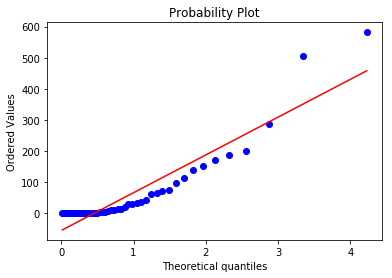



k = -10, size = 1
Number of positive jump times: 22
Mean: 38.9465


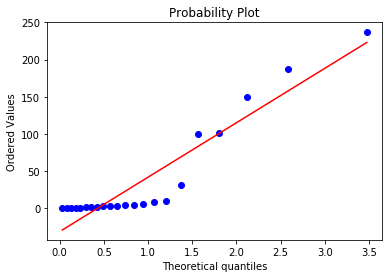



k = -10, size = 2
Number of positive jump times: 18
Mean: 19.761777777777773


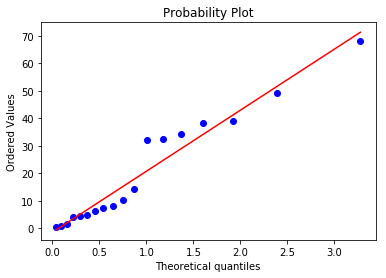



k = -10, size = 3
Number of positive jump times: 7
Mean: 265.5345714285714


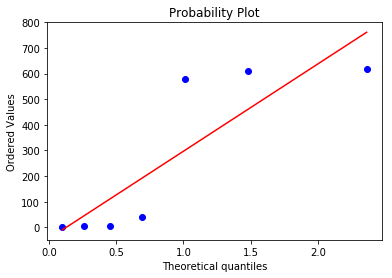



k = -10, size = 4
Number of positive jump times: 0
Mean: nan


k = -10, size = 5
Number of positive jump times: 0
Mean: nan


k = -10, size = 6
Number of positive jump times: 0
Mean: nan


k = -10, size = 7
Number of positive jump times: 0
Mean: nan


k = -10, size = 8
Number of positive jump times: 0
Mean: nan


k = -10, size = 9
Number of positive jump times: 0
Mean: nan


k = -10, size = 10
Number of positive jump times: 1
Mean: 657.713


/Users/andrewwang/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/scipy/stats/_stats_mstats_common.py:115: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/scipy/stats/_stats_mstats_common.py:125: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/scipy/stats/_stats_mstats_common.py:127: RuntimeWarning: invalid value encountered in double_scalars
  sterrest = np.sqrt((1 - r**2) * ssym / ssxm / df)


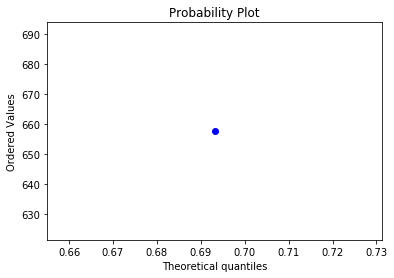



k = -10, size = 11
Number of positive jump times: 0
Mean: nan


k = -10, size = 12
Number of positive jump times: 10
Mean: 2.0653


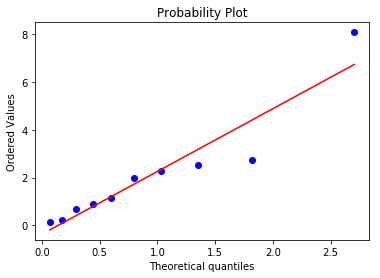



k = -10, size = 13
Number of positive jump times: 0
Mean: nan


k = -10, size = 14
Number of positive jump times: 0
Mean: nan


k = -9, size = 0
Number of positive jump times: 100
Mean: 39.241800000000005


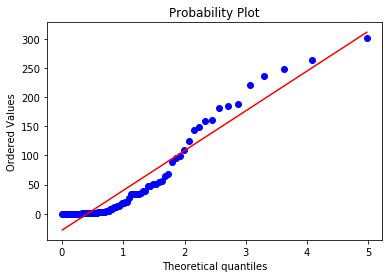



k = -9, size = 1
Number of positive jump times: 10
Mean: 619.5319


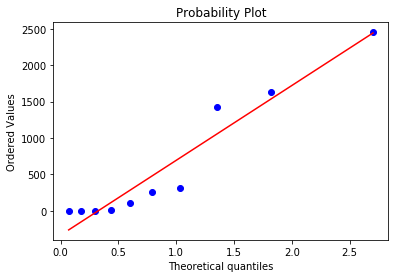



k = -9, size = 2
Number of positive jump times: 21
Mean: 1.3013809523809523


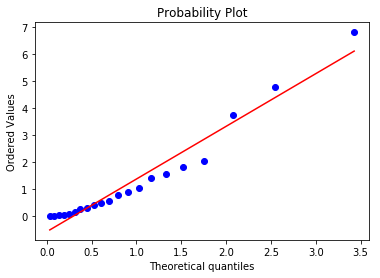



k = -9, size = 3
Number of positive jump times: 0
Mean: nan


k = -9, size = 4
Number of positive jump times: 0
Mean: nan


k = -9, size = 5
Number of positive jump times: 0
Mean: nan


k = -9, size = 6
Number of positive jump times: 0
Mean: nan


k = -9, size = 7
Number of positive jump times: 0
Mean: nan


k = -9, size = 8
Number of positive jump times: 0
Mean: nan


k = -9, size = 9
Number of positive jump times: 0
Mean: nan


k = -9, size = 10
Number of positive jump times: 0
Mean: nan


k = -9, size = 11
Number of positive jump times: 0
Mean: nan


k = -9, size = 12
Number of positive jump times: 0
Mean: nan


k = -8, size = 0
Number of positive jump times: 121
Mean: 19.702209404958673


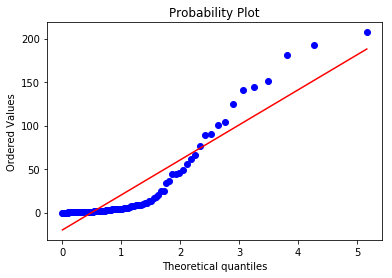



k = -8, size = 1
Number of positive jump times: 30
Mean: 2.4690333333333334


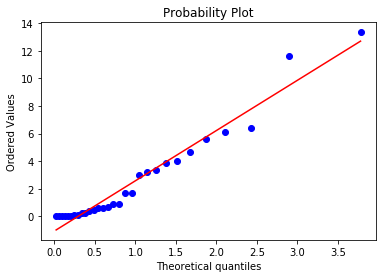



k = -8, size = 2
Number of positive jump times: 21
Mean: 0.4116190476190476


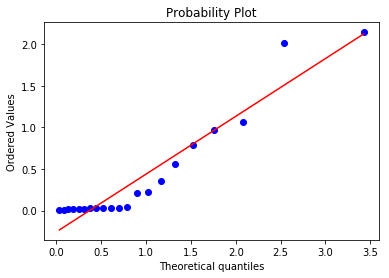



k = -8, size = 3
Number of positive jump times: 8
Mean: 0.4513750000000001


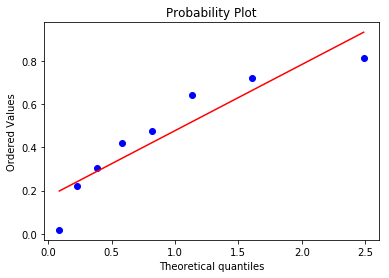



k = -8, size = 4
Number of positive jump times: 0
Mean: nan


k = -8, size = 5
Number of positive jump times: 0
Mean: nan


k = -8, size = 6
Number of positive jump times: 0
Mean: nan


k = -8, size = 7
Number of positive jump times: 0
Mean: nan


k = -8, size = 8
Number of positive jump times: 0
Mean: nan


k = -8, size = 9
Number of positive jump times: 0
Mean: nan


k = -8, size = 10
Number of positive jump times: 11
Mean: 2.881


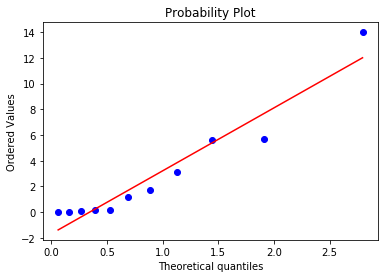



k = -8, size = 11
Number of positive jump times: 6
Mean: 0.19216666666666668


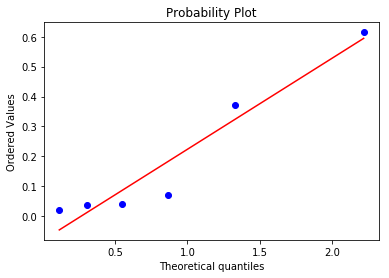



k = -8, size = 12
Number of positive jump times: 24
Mean: 0.22258333333333333


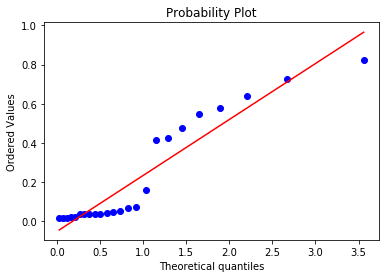



k = -8, size = 13
Number of positive jump times: 10
Mean: 0.026599999999999995


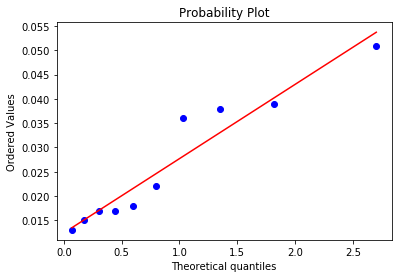



k = -8, size = 14
Number of positive jump times: 2
Mean: 0.2125


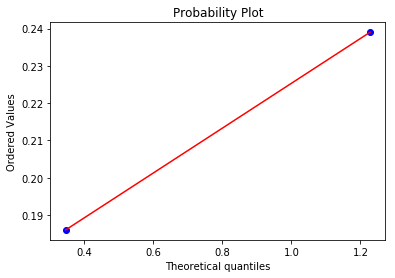



k = -8, size = 15
Number of positive jump times: 0
Mean: nan


k = -7, size = 0
Number of positive jump times: 97
Mean: 2.4144536082474226


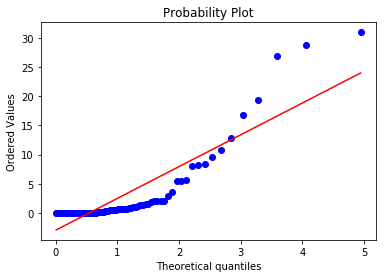



k = -7, size = 1
Number of positive jump times: 45
Mean: 0.783288888888889


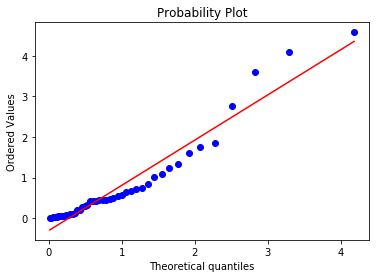



k = -7, size = 2
Number of positive jump times: 60
Mean: 0.23298333333333335


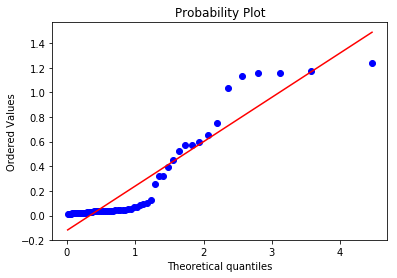



k = -7, size = 3
Number of positive jump times: 58
Mean: 0.4796724137931035


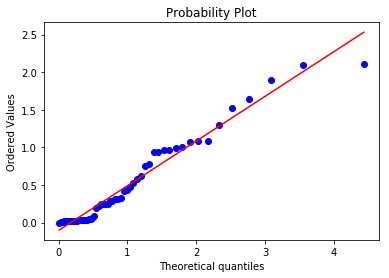



k = -7, size = 4
Number of positive jump times: 50
Mean: 1.20152


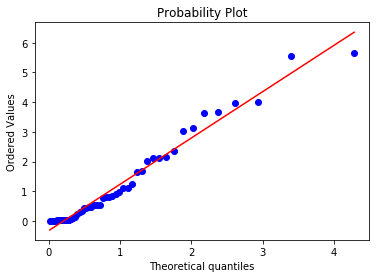



k = -7, size = 5
Number of positive jump times: 26
Mean: 1.021923076923077


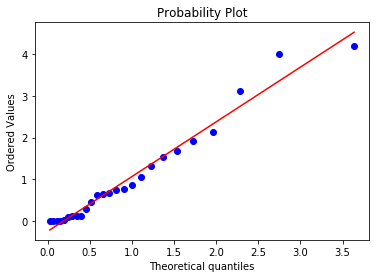



k = -7, size = 6
Number of positive jump times: 12
Mean: 0.3248333333333333


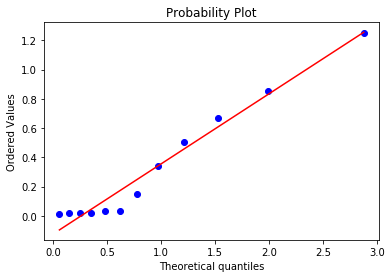



k = -7, size = 7
Number of positive jump times: 2
Mean: 1.2454999999999998


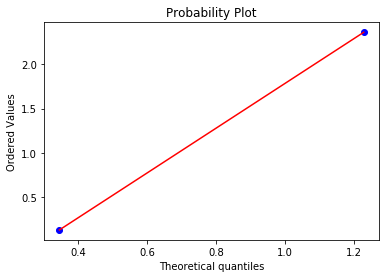



k = -7, size = 8
Number of positive jump times: 0
Mean: nan


k = -7, size = 9
Number of positive jump times: 4
Mean: 0.014499999999999999


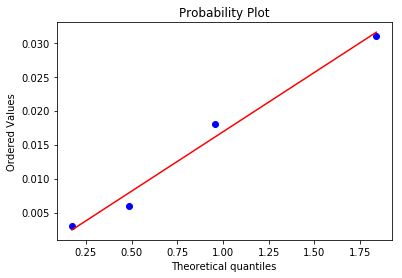



k = -7, size = 10
Number of positive jump times: 7
Mean: 7.6932857142857145


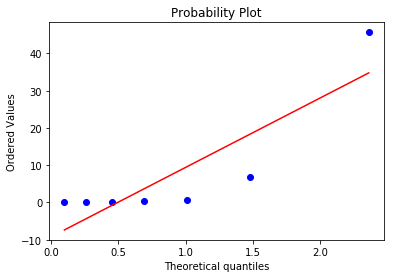



k = -7, size = 11
Number of positive jump times: 0
Mean: nan


k = -7, size = 12
Number of positive jump times: 6
Mean: 0.033


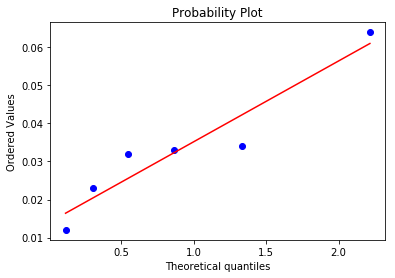



k = -7, size = 13
Number of positive jump times: 13
Mean: 0.19753846153846155


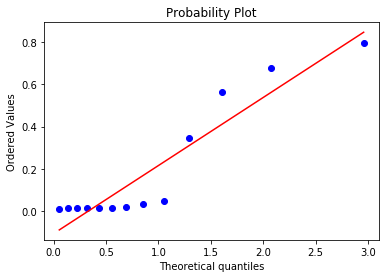



k = -7, size = 14
Number of positive jump times: 3
Mean: 1.3483333333333334


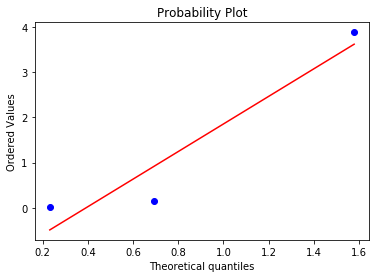



k = -7, size = 15
Number of positive jump times: 27
Mean: 0.4228888888888889


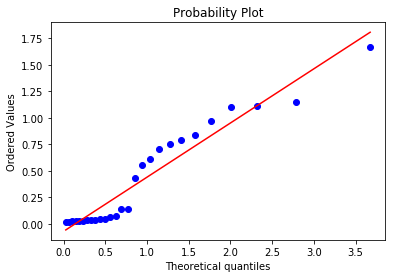



k = -7, size = 16
Number of positive jump times: 3
Mean: 31.030333333333335


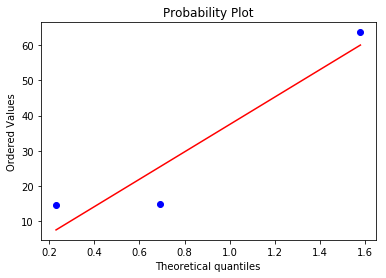



k = -7, size = 17
Number of positive jump times: 0
Mean: nan


k = -6, size = 0
Number of positive jump times: 217
Mean: 0.9699539170506913


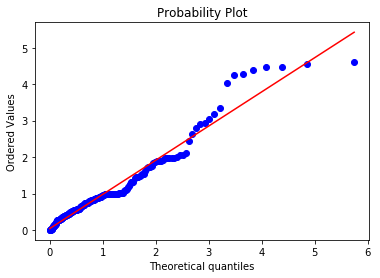



k = -6, size = 1
Number of positive jump times: 107
Mean: 0.6119345794392522


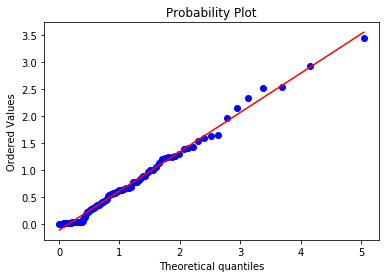



k = -6, size = 2
Number of positive jump times: 23
Mean: 1.807782608695652


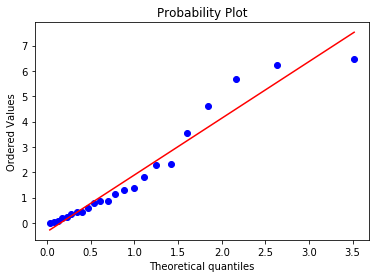



k = -6, size = 3
Number of positive jump times: 35
Mean: 0.5134285714285713


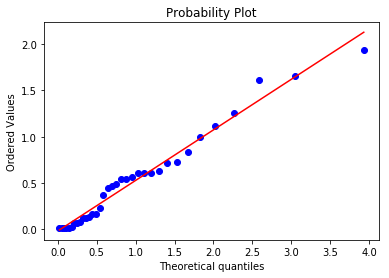



k = -6, size = 4
Number of positive jump times: 27
Mean: 0.4501111111111111


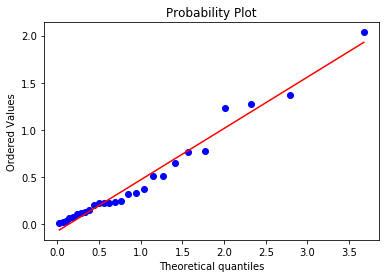



k = -6, size = 5
Number of positive jump times: 19
Mean: 0.1956315789473684


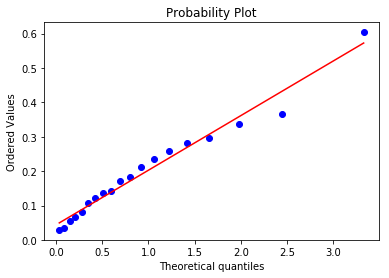



k = -6, size = 6
Number of positive jump times: 7
Mean: 0.21885714285714286


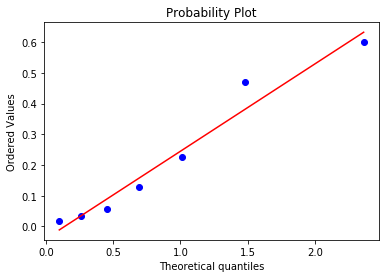



k = -6, size = 7
Number of positive jump times: 0
Mean: nan


k = -6, size = 8
Number of positive jump times: 0
Mean: nan


k = -6, size = 9
Number of positive jump times: 0
Mean: nan


k = -6, size = 10
Number of positive jump times: 0
Mean: nan


k = -6, size = 11
Number of positive jump times: 0
Mean: nan


k = -6, size = 12
Number of positive jump times: 63
Mean: 1.7398571428571425


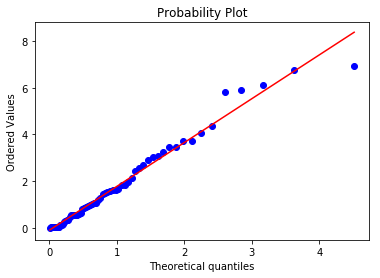



k = -6, size = 13
Number of positive jump times: 15
Mean: 4.238533333333334


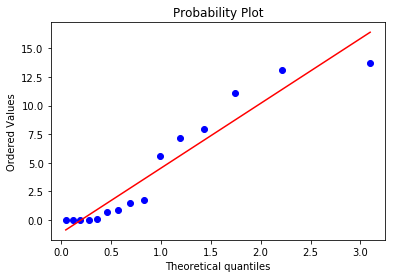



k = -6, size = 14
Number of positive jump times: 71
Mean: 0.2820140845070423


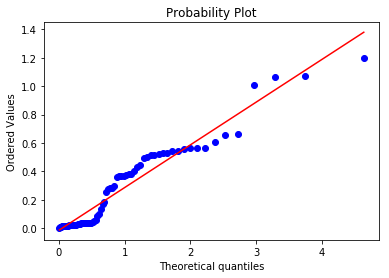



k = -6, size = 15
Number of positive jump times: 52
Mean: 0.5011346153846155


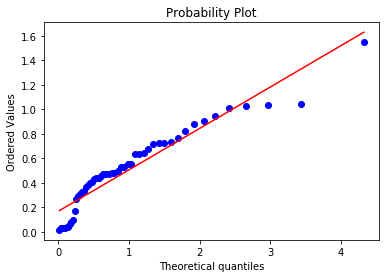



k = -6, size = 16
Number of positive jump times: 8
Mean: 0.6968749999999999


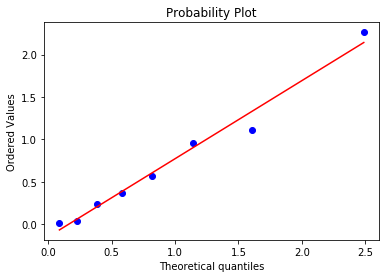



k = -6, size = 17
Number of positive jump times: 4
Mean: 1.80325


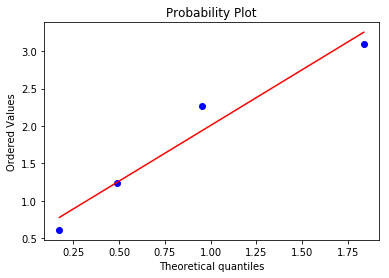



k = -6, size = 18
Number of positive jump times: 0
Mean: nan


k = -5, size = 0
Number of positive jump times: 454
Mean: 1.1720881057268722


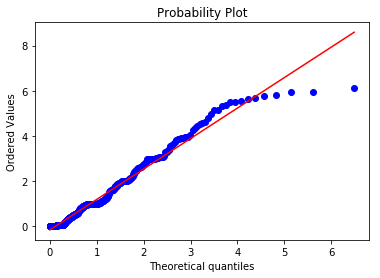



k = -5, size = 1
Number of positive jump times: 179
Mean: 0.7875530726256982


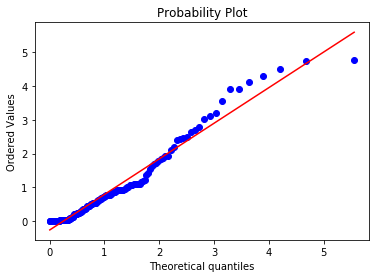



k = -5, size = 2
Number of positive jump times: 117
Mean: 0.6404444444444445


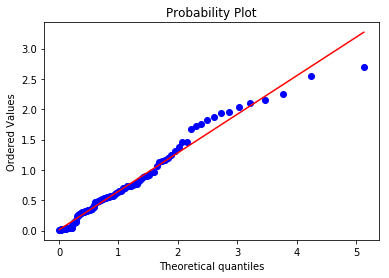



k = -5, size = 3
Number of positive jump times: 207
Mean: 0.6785072463768116


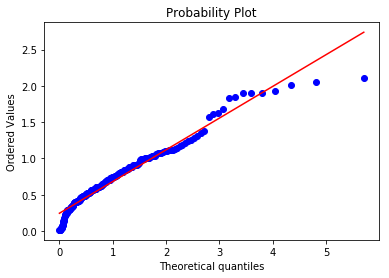



k = -5, size = 4
Number of positive jump times: 36
Mean: 1.400666666666667


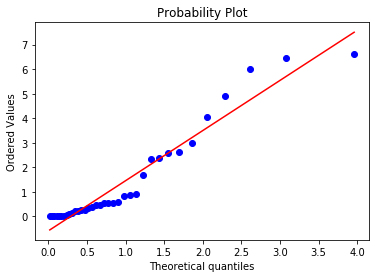



k = -5, size = 5
Number of positive jump times: 14
Mean: 0.6054285714285715


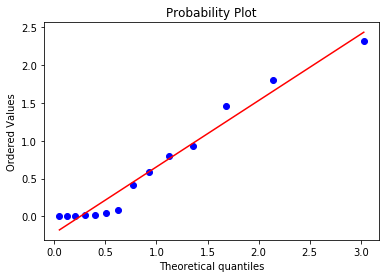



k = -5, size = 6
Number of positive jump times: 15
Mean: 3.426533333333333


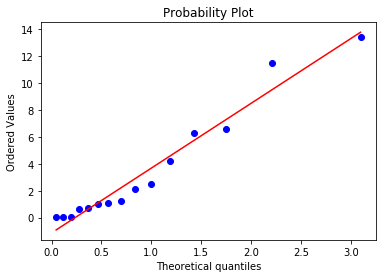



k = -5, size = 7
Number of positive jump times: 0
Mean: nan


k = -5, size = 8
Number of positive jump times: 0
Mean: nan


k = -5, size = 9
Number of positive jump times: 0
Mean: nan


k = -5, size = 10
Number of positive jump times: 0
Mean: nan


k = -5, size = 11
Number of positive jump times: 0
Mean: nan


k = -5, size = 12
Number of positive jump times: 0
Mean: nan


k = -5, size = 13
Number of positive jump times: 10
Mean: 0.04340000000000001


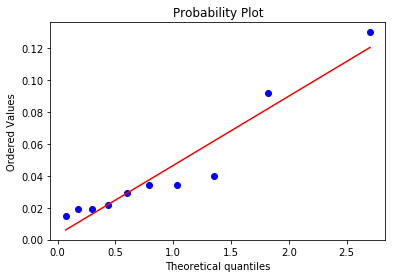



k = -5, size = 14
Number of positive jump times: 3
Mean: 4.478666666666666


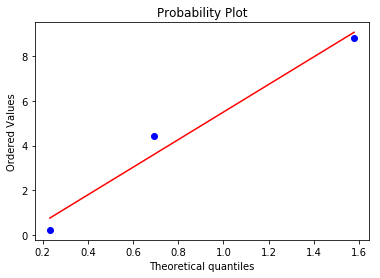



k = -5, size = 15
Number of positive jump times: 3
Mean: 0.05933333333333333


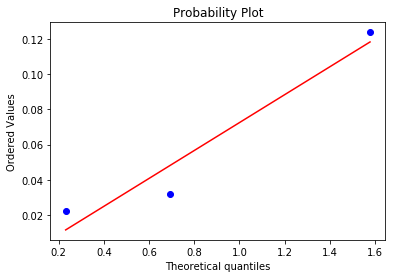



k = -5, size = 16
Number of positive jump times: 115
Mean: 0.5693304347826087


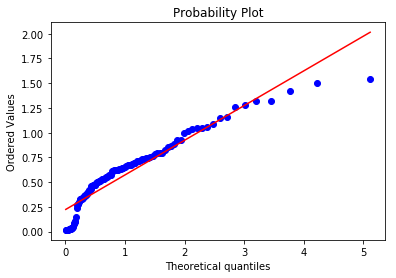



k = -5, size = 17
Number of positive jump times: 1
Mean: 3.018


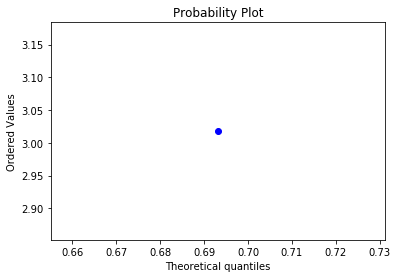



k = -5, size = 18
Number of positive jump times: 2
Mean: 0.159


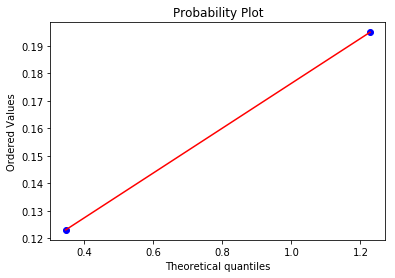



k = -5, size = 19
Number of positive jump times: 0
Mean: nan


k = -5, size = 20
Number of positive jump times: 0
Mean: nan


k = -4, size = 0
Number of positive jump times: 509
Mean: 0.9918762278978389


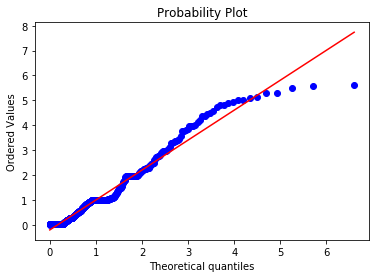



k = -4, size = 1
Number of positive jump times: 179
Mean: 0.5559217877094973


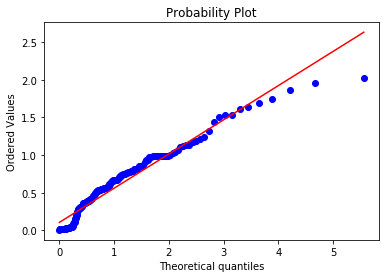



k = -4, size = 2
Number of positive jump times: 48
Mean: 0.9778749999999999


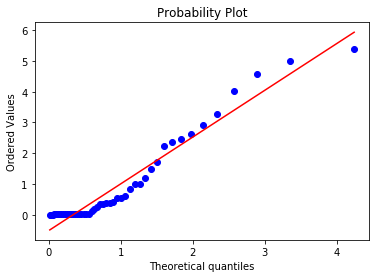



k = -4, size = 3
Number of positive jump times: 147
Mean: 0.667047619047619


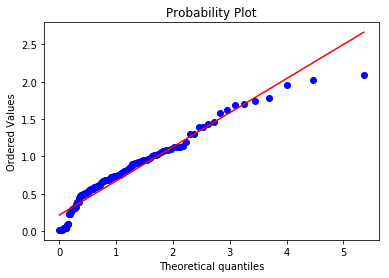



k = -4, size = 4
Number of positive jump times: 16
Mean: 4.8905625


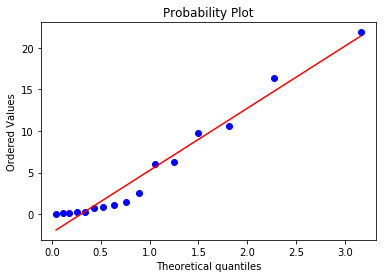



k = -4, size = 5
Number of positive jump times: 23
Mean: 0.938304347826087


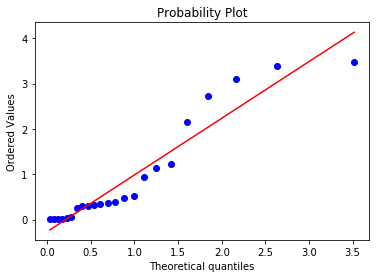



k = -4, size = 6
Number of positive jump times: 5
Mean: 1.5778000000000003


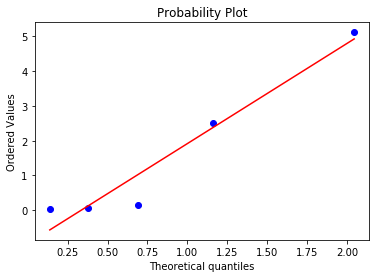



k = -4, size = 7
Number of positive jump times: 1
Mean: 0.1


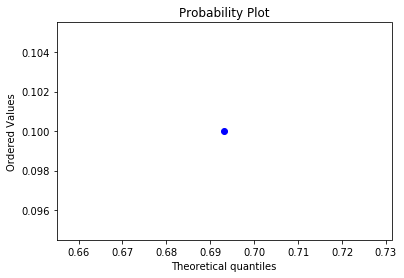



k = -4, size = 8
Number of positive jump times: 0
Mean: nan


k = -4, size = 9
Number of positive jump times: 0
Mean: nan


k = -4, size = 10
Number of positive jump times: 0
Mean: nan


k = -4, size = 11
Number of positive jump times: 27
Mean: 0.03233333333333334


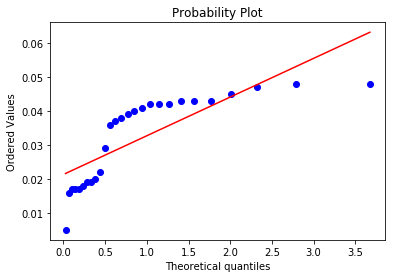



k = -4, size = 12
Number of positive jump times: 151
Mean: 0.34802649006622516


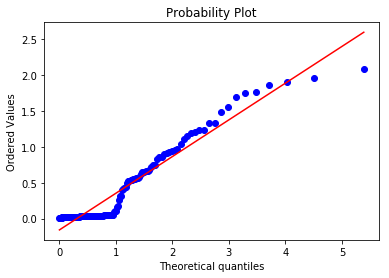



k = -4, size = 13
Number of positive jump times: 37
Mean: 0.4700810810810811


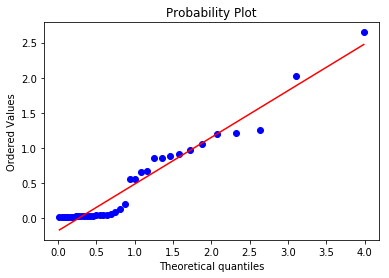



k = -4, size = 14
Number of positive jump times: 42
Mean: 0.5081428571428571


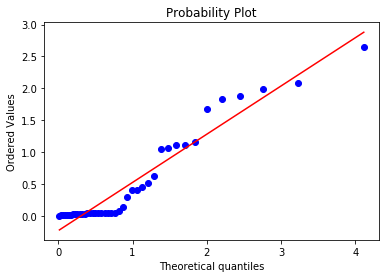



k = -4, size = 15
Number of positive jump times: 17
Mean: 0.4761176470588235


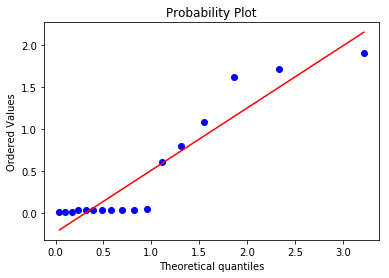



k = -4, size = 16
Number of positive jump times: 31
Mean: 0.595967741935484


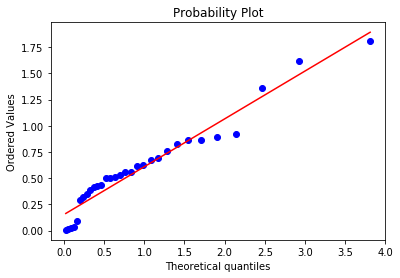



k = -4, size = 17
Number of positive jump times: 17
Mean: 0.5628823529411764


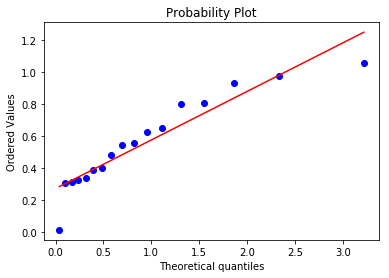



k = -4, size = 18
Number of positive jump times: 0
Mean: nan


k = -4, size = 19
Number of positive jump times: 0
Mean: nan


k = -4, size = 20
Number of positive jump times: 0
Mean: nan


k = -4, size = 21
Number of positive jump times: 0
Mean: nan


k = -4, size = 22
Number of positive jump times: 0
Mean: nan


k = -3, size = 0
Number of positive jump times: 779
Mean: 1.4926148908857508


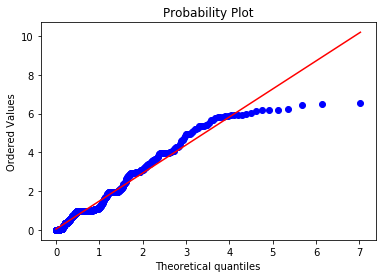



k = -3, size = 1
Number of positive jump times: 132
Mean: 1.0999621212121211


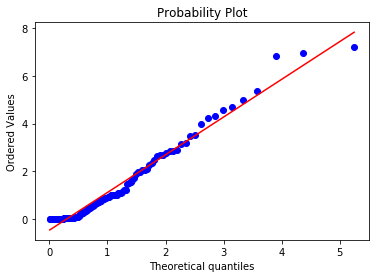



k = -3, size = 2
Number of positive jump times: 101
Mean: 0.9605148514851487


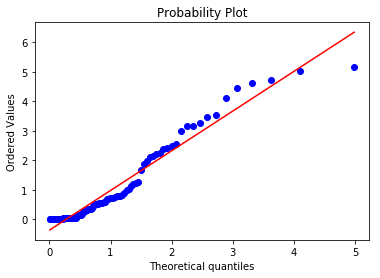



k = -3, size = 3
Number of positive jump times: 87
Mean: 0.37393103448275866


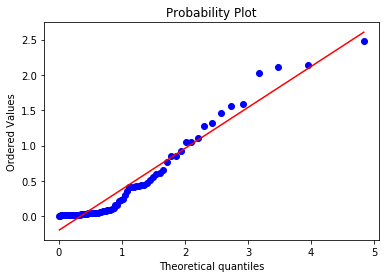



k = -3, size = 4
Number of positive jump times: 111
Mean: 1.3115585585585587


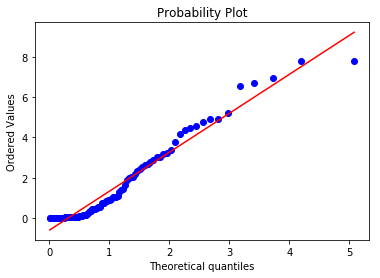



k = -3, size = 5
Number of positive jump times: 62
Mean: 1.1886129032258068


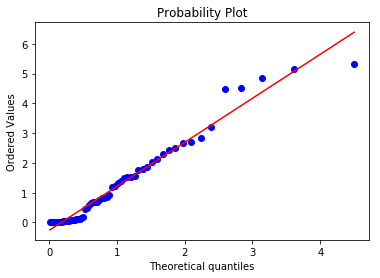



k = -3, size = 6
Number of positive jump times: 82
Mean: 1.2690121951219513


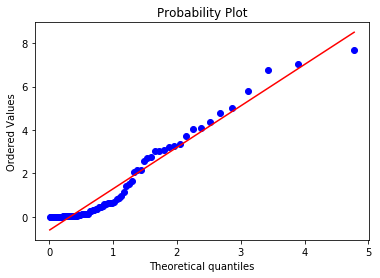



k = -3, size = 7
Number of positive jump times: 45
Mean: 2.305511111111111


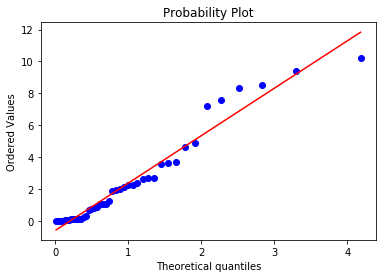



k = -3, size = 8
Number of positive jump times: 20
Mean: 0.30065


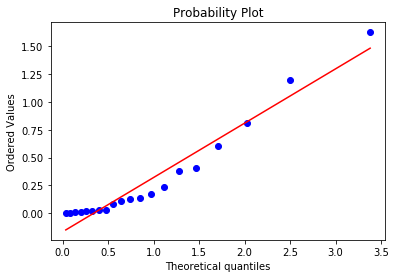



k = -3, size = 9
Number of positive jump times: 24
Mean: 0.4192916666666668


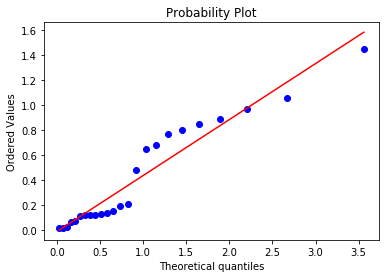



k = -3, size = 10
Number of positive jump times: 6
Mean: 0.4788333333333333


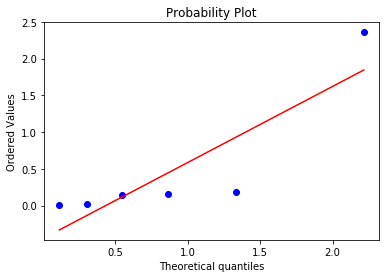



k = -3, size = 11
Number of positive jump times: 3
Mean: 0.5143333333333334


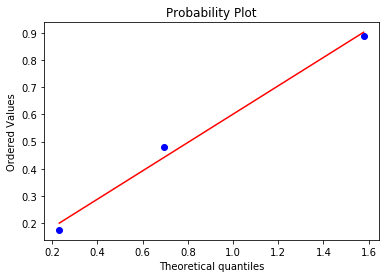



k = -3, size = 12
Number of positive jump times: 1
Mean: 0.703


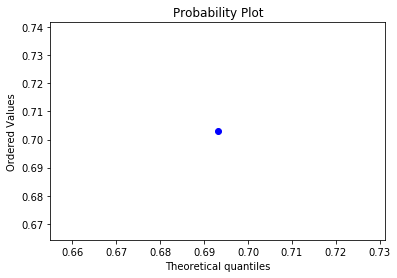



k = -3, size = 13
Number of positive jump times: 3
Mean: 0.22966666666666669


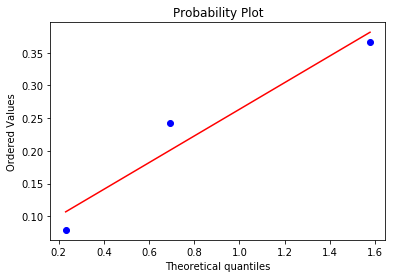



k = -3, size = 14
Number of positive jump times: 3
Mean: 0.29433333333333334


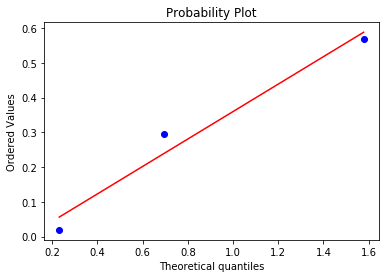



k = -3, size = 15
Number of positive jump times: 6
Mean: 0.6041666666666666


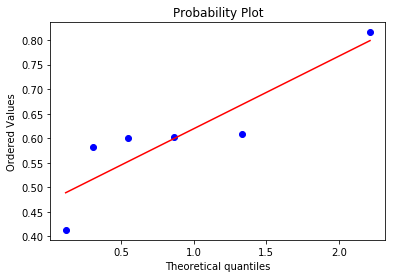



k = -3, size = 16
Number of positive jump times: 21
Mean: 0.0620952380952381


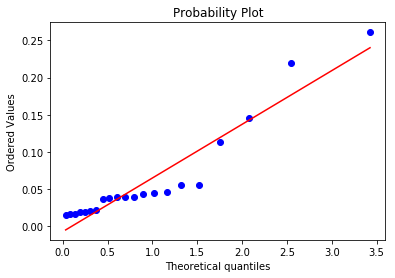



k = -3, size = 17
Number of positive jump times: 92
Mean: 0.40176086956521745


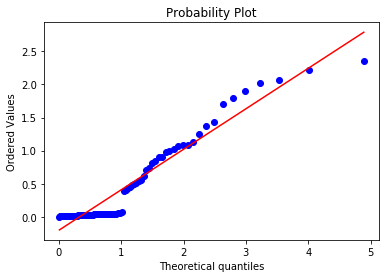



k = -3, size = 18
Number of positive jump times: 29
Mean: 0.27548275862068966


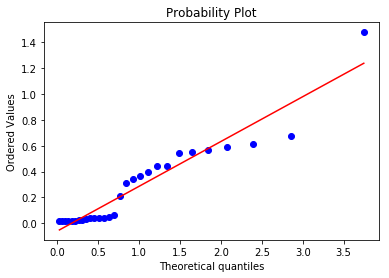



k = -3, size = 19
Number of positive jump times: 0
Mean: nan


k = -3, size = 20
Number of positive jump times: 7
Mean: 0.5359999999999999


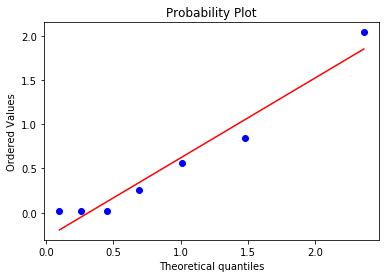



k = -3, size = 21
Number of positive jump times: 1
Mean: 0.02


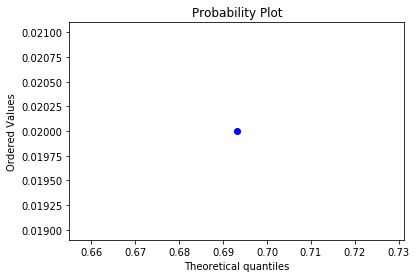



k = -3, size = 22
Number of positive jump times: 18
Mean: 0.3911666666666667


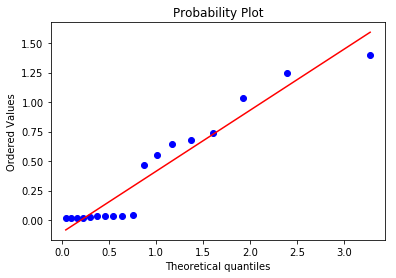



k = -3, size = 23
Number of positive jump times: 4
Mean: 2.15175


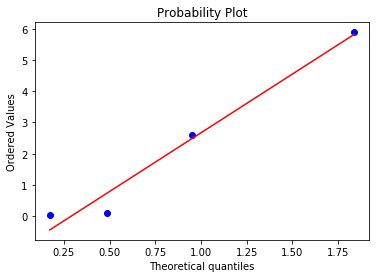



k = -3, size = 24
Number of positive jump times: 4
Mean: 0.9145000000000001


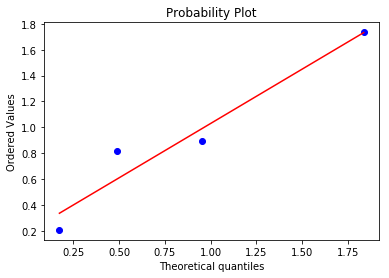



k = -3, size = 25
Number of positive jump times: 2
Mean: 29.0835


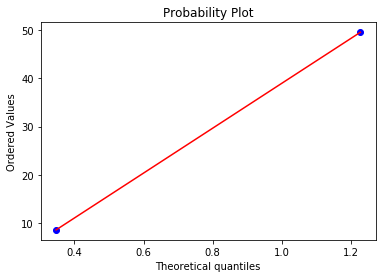



k = -3, size = 26
Number of positive jump times: 0
Mean: nan


k = -2, size = 0
Number of positive jump times: 1063
Mean: 1.3327873941674504


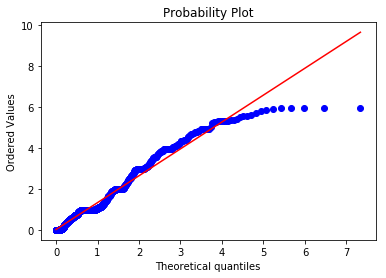



k = -2, size = 1
Number of positive jump times: 252
Mean: 1.2722394365079364


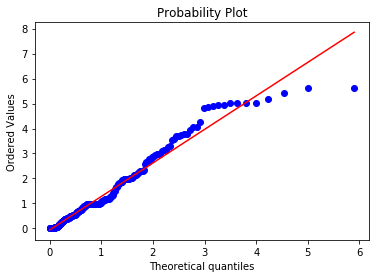



k = -2, size = 2
Number of positive jump times: 95
Mean: 1.0674


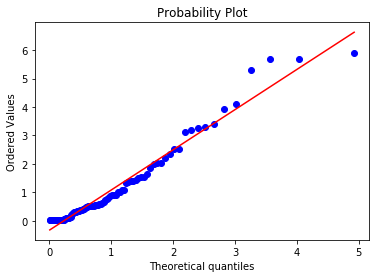



k = -2, size = 3
Number of positive jump times: 157
Mean: 1.4064203821656052


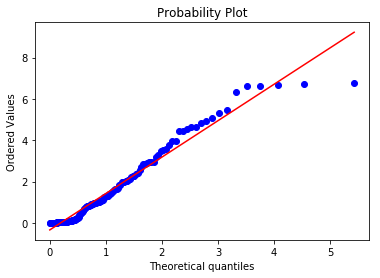



k = -2, size = 4
Number of positive jump times: 120
Mean: 2.62555


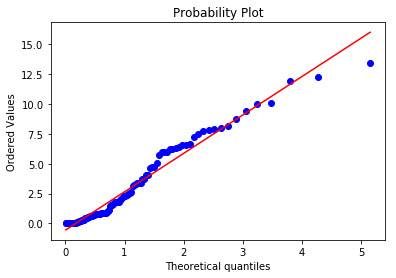



k = -2, size = 5
Number of positive jump times: 82
Mean: 2.193292682926829


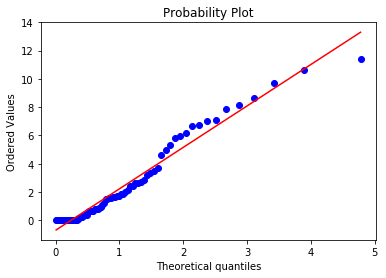



k = -2, size = 6
Number of positive jump times: 71
Mean: 2.536704225352113


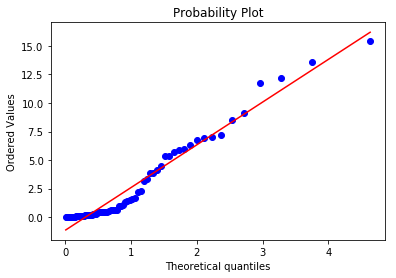



k = -2, size = 7
Number of positive jump times: 63
Mean: 1.4619523809523811


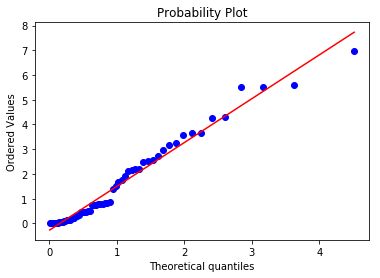



k = -2, size = 8
Number of positive jump times: 17
Mean: 0.3978823529411764


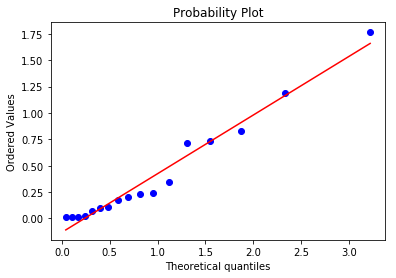



k = -2, size = 9
Number of positive jump times: 6
Mean: 0.22666666666666666


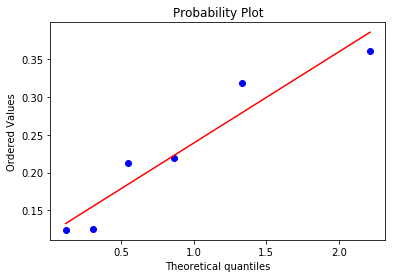



k = -2, size = 10
Number of positive jump times: 4
Mean: 0.22549999999999998


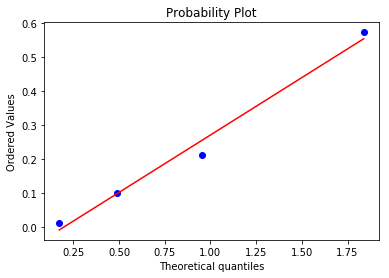



k = -2, size = 11
Number of positive jump times: 1
Mean: 12.095


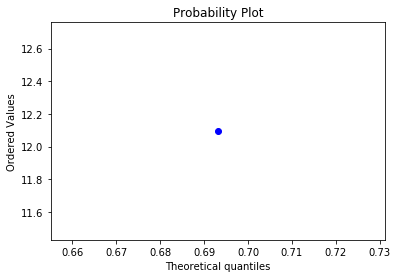



k = -2, size = 12
Number of positive jump times: 0
Mean: nan


k = -2, size = 13
Number of positive jump times: 1
Mean: 0.015


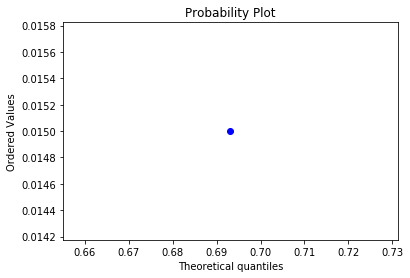



k = -2, size = 14
Number of positive jump times: 84
Mean: 0.031083333333333324


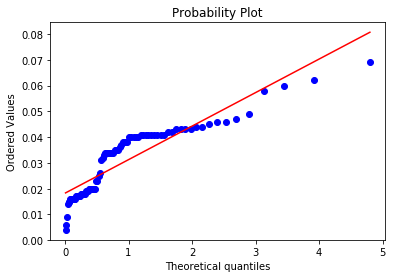



k = -2, size = 15
Number of positive jump times: 62
Mean: 0.22214516129032255


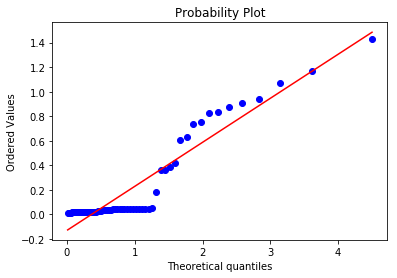



k = -2, size = 16
Number of positive jump times: 26
Mean: 0.32573076923076927


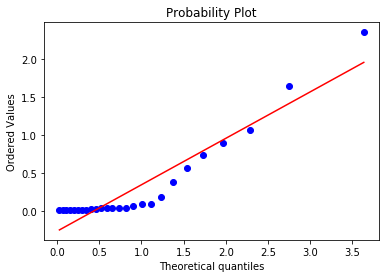



k = -2, size = 17
Number of positive jump times: 35
Mean: 1.4026


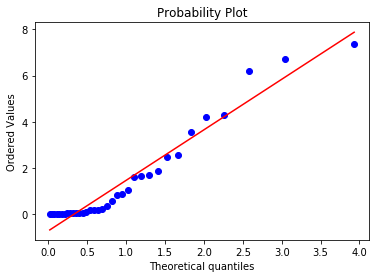



k = -2, size = 18
Number of positive jump times: 6
Mean: 0.0275


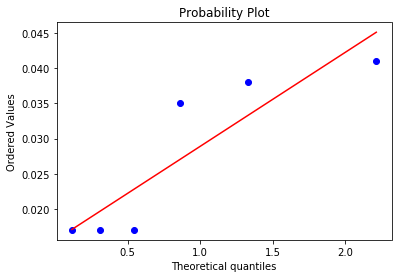



k = -2, size = 19
Number of positive jump times: 42
Mean: 0.6132619047619048


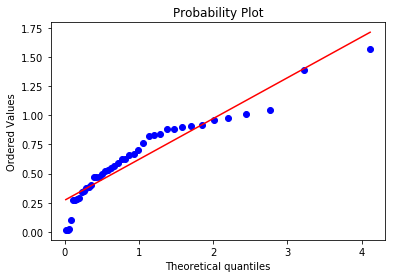



k = -2, size = 20
Number of positive jump times: 3
Mean: 45.35366666666667


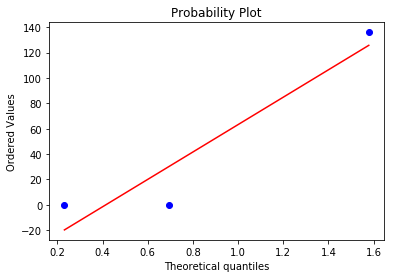



k = -2, size = 21
Number of positive jump times: 0
Mean: nan


k = -1, size = 0
Number of positive jump times: 1570
Mean: 1.3603579617834394


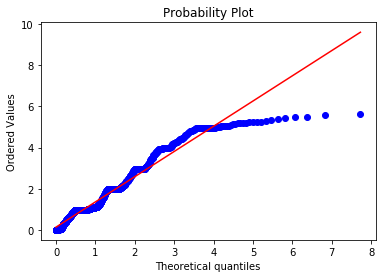



k = -1, size = 1
Number of positive jump times: 211
Mean: 0.5526872037914692


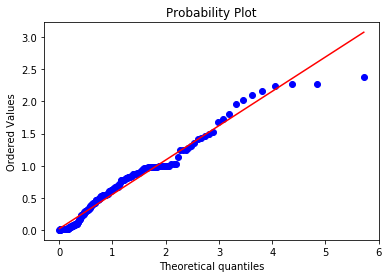



k = -1, size = 2
Number of positive jump times: 261
Mean: 0.8234636015325669


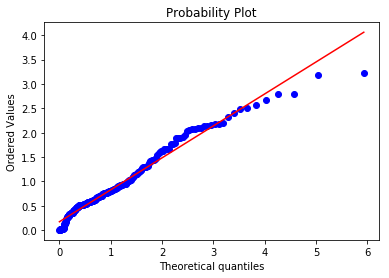



k = -1, size = 3
Number of positive jump times: 219
Mean: 1.1655890410958905


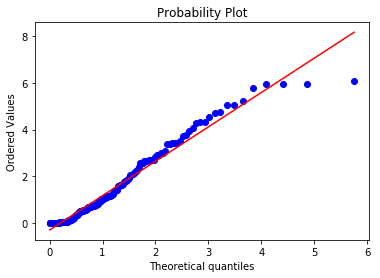



k = -1, size = 4
Number of positive jump times: 144
Mean: 0.8287777777777778


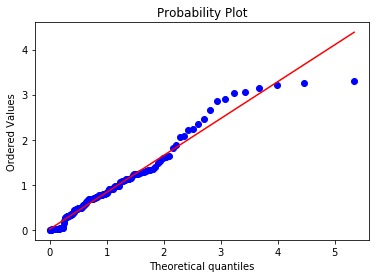



k = -1, size = 5
Number of positive jump times: 85
Mean: 1.8310941176470592


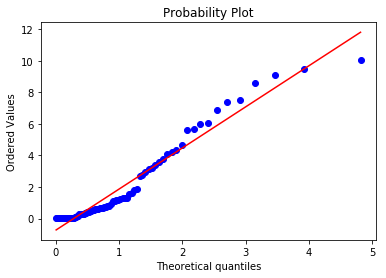



k = -1, size = 6
Number of positive jump times: 82
Mean: 0.3844878048780488


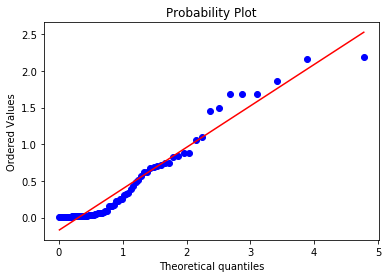



k = -1, size = 7
Number of positive jump times: 63
Mean: 1.6648095238095237


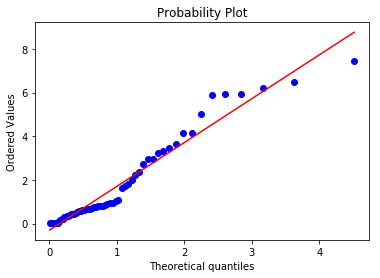



k = -1, size = 8
Number of positive jump times: 38
Mean: 3.10421052631579


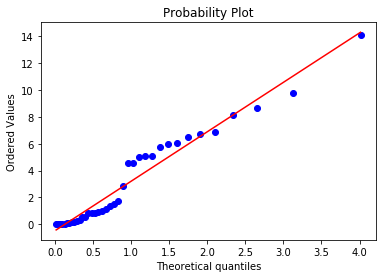



k = -1, size = 9
Number of positive jump times: 8
Mean: 0.454


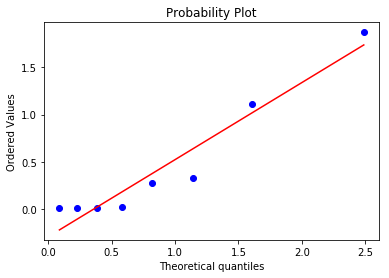



k = -1, size = 10
Number of positive jump times: 14
Mean: 1.4292142857142858


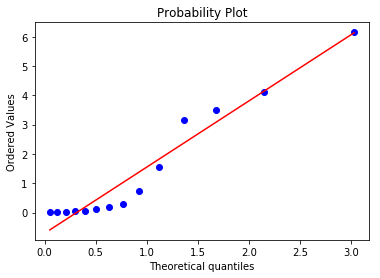



k = -1, size = 11
Number of positive jump times: 2
Mean: 1.2374999999999998


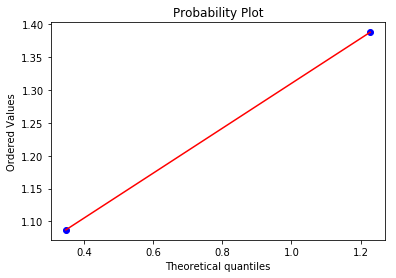



k = -1, size = 12
Number of positive jump times: 0
Mean: nan


k = -1, size = 13
Number of positive jump times: 0
Mean: nan


k = -1, size = 14
Number of positive jump times: 0
Mean: nan


k = -1, size = 15
Number of positive jump times: 0
Mean: nan


k = -1, size = 16
Number of positive jump times: 0
Mean: nan


k = -1, size = 17
Number of positive jump times: 56
Mean: 0.029517857142857144


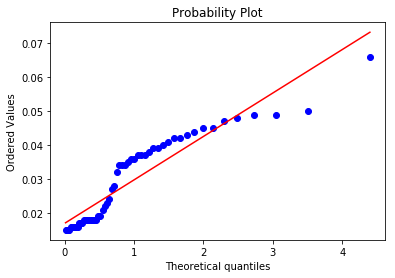



k = -1, size = 18
Number of positive jump times: 4
Mean: 7.2482500000000005


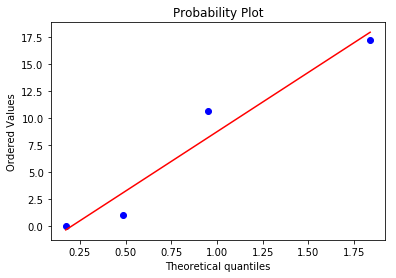



k = -1, size = 19
Number of positive jump times: 14
Mean: 0.8340714285714286


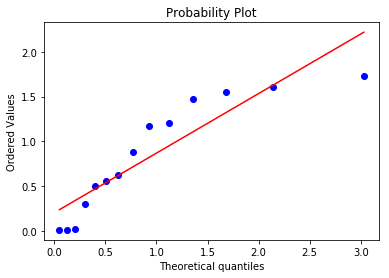



k = -1, size = 20
Number of positive jump times: 18
Mean: 1.643722222222222


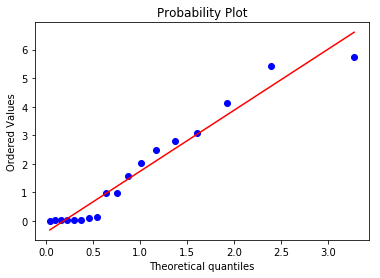



k = -1, size = 21
Number of positive jump times: 38
Mean: 0.8465789473684211


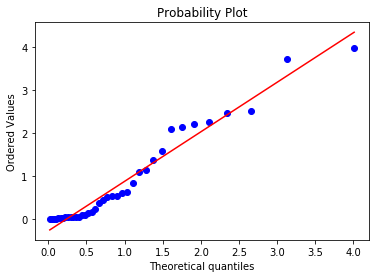



k = -1, size = 22
Number of positive jump times: 28
Mean: 0.3904285714285715


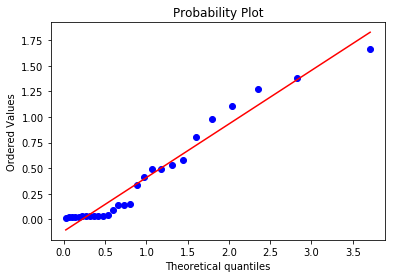



k = -1, size = 23
Number of positive jump times: 9
Mean: 0.8093333333333333


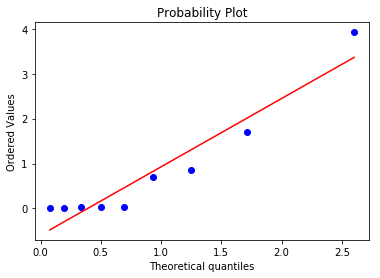



k = -1, size = 24
Number of positive jump times: 12
Mean: 0.33083333333333337


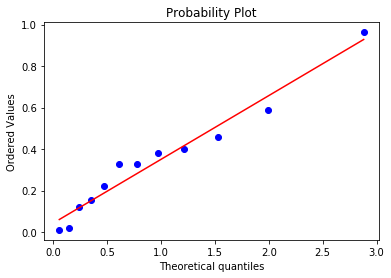



k = -1, size = 25
Number of positive jump times: 0
Mean: nan


k = -1, size = 26
Number of positive jump times: 0
Mean: nan


k = 1, size = 0
Number of positive jump times: 2309
Mean: 2.7169792117799916


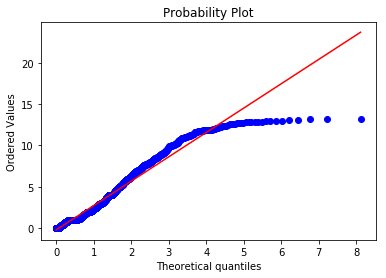



k = 1, size = 1
Number of positive jump times: 107
Mean: 0.7900747663551404


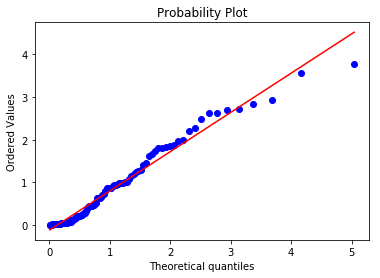



k = 1, size = 2
Number of positive jump times: 75
Mean: 0.6841600000000002


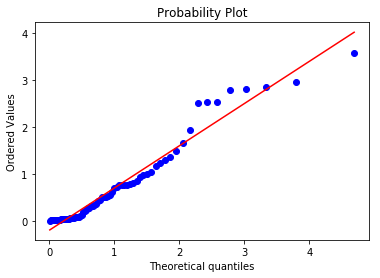



k = 1, size = 3
Number of positive jump times: 59
Mean: 1.1316610169491526


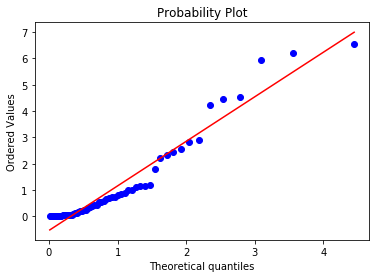



k = 1, size = 4
Number of positive jump times: 41
Mean: 1.5877073170731704


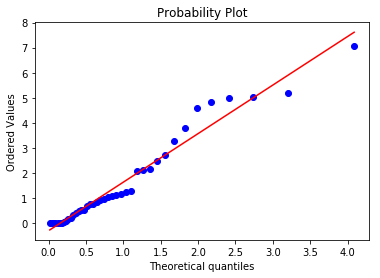



k = 1, size = 5
Number of positive jump times: 35
Mean: 0.9646571428571428


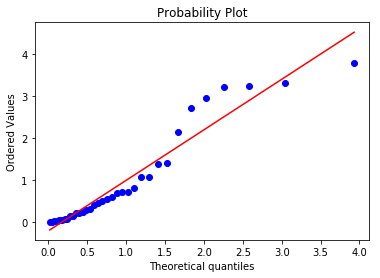



k = 1, size = 6
Number of positive jump times: 38
Mean: 1.2592983684210526


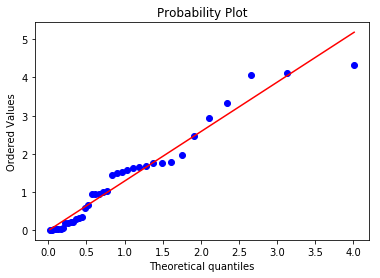



k = 1, size = 7
Number of positive jump times: 22
Mean: 0.6253181818181819


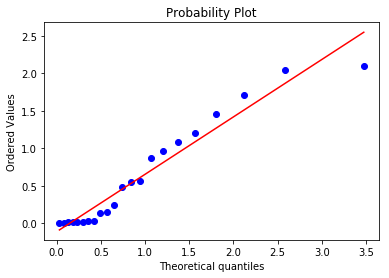



k = 1, size = 8
Number of positive jump times: 19
Mean: 6.583


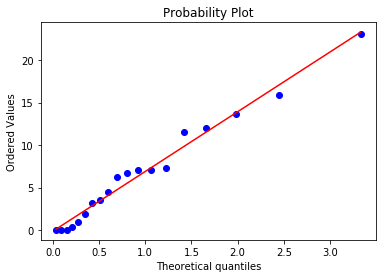



k = 1, size = 9
Number of positive jump times: 20
Mean: 4.61925


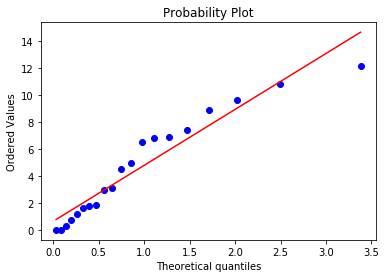



k = 1, size = 10
Number of positive jump times: 3
Mean: 3.2949999999999995


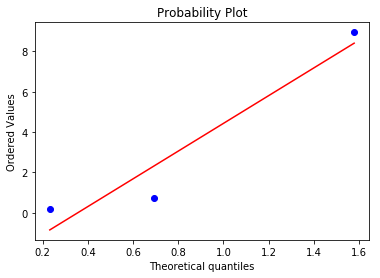



k = 1, size = 11
Number of positive jump times: 1
Mean: 0.816


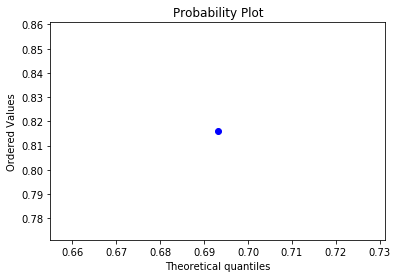



k = 1, size = 12
Number of positive jump times: 0
Mean: nan


k = 1, size = 13
Number of positive jump times: 0
Mean: nan


k = 1, size = 14
Number of positive jump times: 0
Mean: nan


k = 1, size = 15
Number of positive jump times: 0
Mean: nan


k = 1, size = 16
Number of positive jump times: 8
Mean: 0.030375000000000003


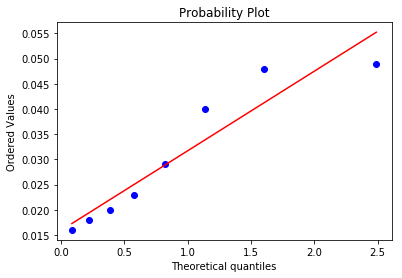



k = 1, size = 17
Number of positive jump times: 6
Mean: 0.18816666666666662


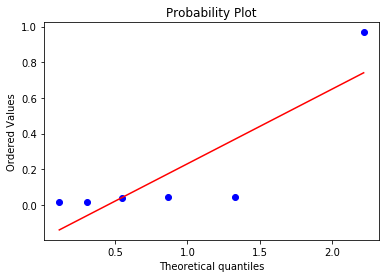



k = 1, size = 18
Number of positive jump times: 6
Mean: 0.03333333333333333


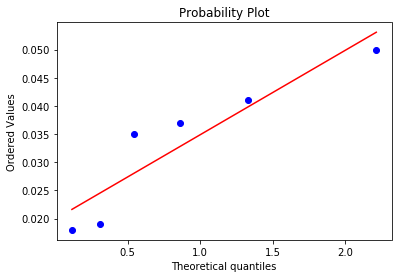



k = 1, size = 19
Number of positive jump times: 0
Mean: nan


k = 1, size = 20
Number of positive jump times: 1
Mean: 15.85


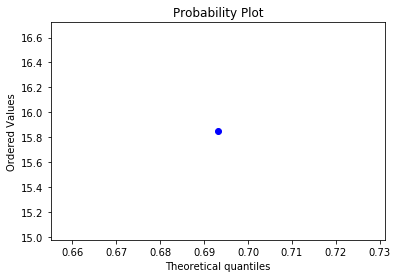



k = 1, size = 21
Number of positive jump times: 0
Mean: nan


k = 1, size = 22
Number of positive jump times: 0
Mean: nan


k = 2, size = 0
Number of positive jump times: 1874
Mean: 3.7452454642475983


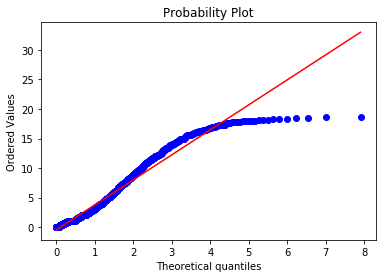



k = 2, size = 1
Number of positive jump times: 262
Mean: 0.4093893129770992


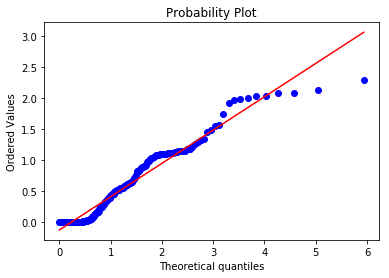



k = 2, size = 2
Number of positive jump times: 287
Mean: 0.5707700348432057


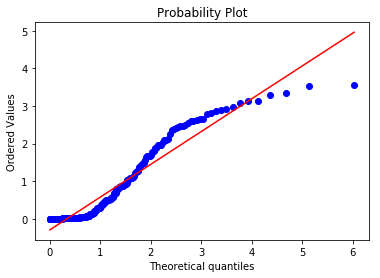



k = 2, size = 3
Number of positive jump times: 339
Mean: 0.2841356932153392


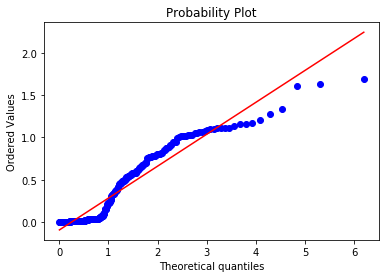



k = 2, size = 4
Number of positive jump times: 208
Mean: 0.41047115384615385


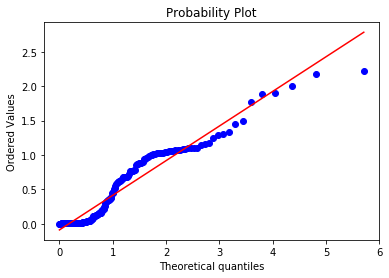



k = 2, size = 5
Number of positive jump times: 96
Mean: 0.37224999999999997


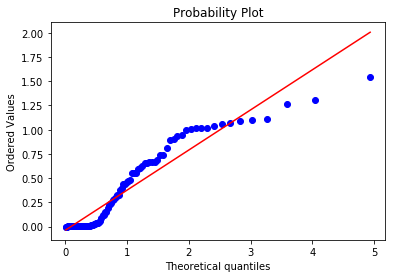



k = 2, size = 6
Number of positive jump times: 38
Mean: 0.7405789473684211


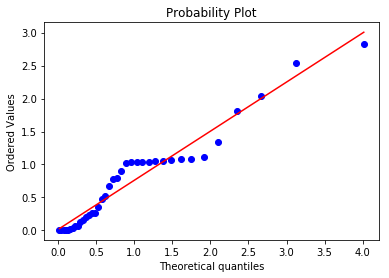



k = 2, size = 7
Number of positive jump times: 21
Mean: 0.3190476190476191


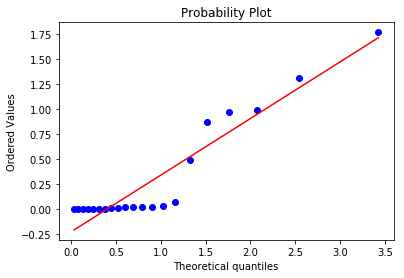



k = 2, size = 8
Number of positive jump times: 6
Mean: 0.2748333333333333


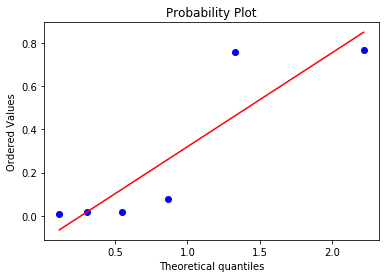



k = 2, size = 9
Number of positive jump times: 11
Mean: 0.7365454545454546


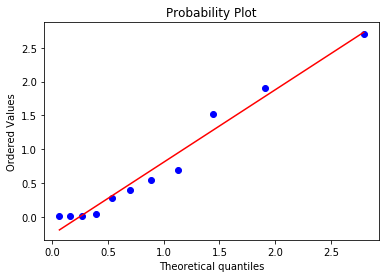



k = 2, size = 10
Number of positive jump times: 4
Mean: 6.611500000000001


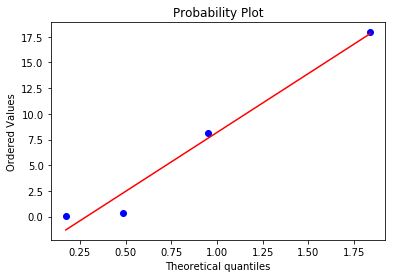



k = 2, size = 11
Number of positive jump times: 1
Mean: 56.286


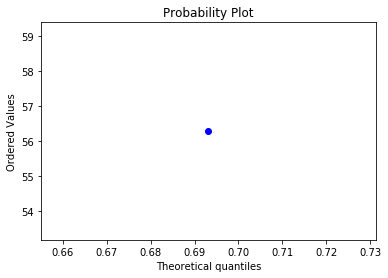



k = 2, size = 12
Number of positive jump times: 0
Mean: nan


k = 2, size = 13
Number of positive jump times: 0
Mean: nan


k = 2, size = 14
Number of positive jump times: 0
Mean: nan


k = 2, size = 15
Number of positive jump times: 0
Mean: nan


k = 2, size = 16
Number of positive jump times: 0
Mean: nan


k = 2, size = 17
Number of positive jump times: 0
Mean: nan


k = 2, size = 18
Number of positive jump times: 0
Mean: nan


k = 2, size = 19
Number of positive jump times: 0
Mean: nan


k = 2, size = 20
Number of positive jump times: 0
Mean: nan


k = 2, size = 21
Number of positive jump times: 6
Mean: 0.0365


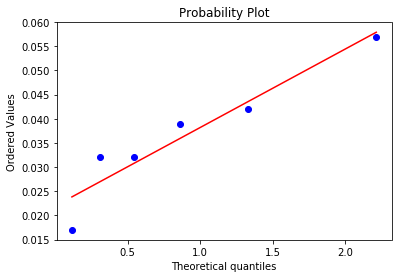



k = 2, size = 22
Number of positive jump times: 0
Mean: nan


k = 2, size = 23
Number of positive jump times: 0
Mean: nan


k = 3, size = 0
Number of positive jump times: 2106
Mean: 3.5929221272554606


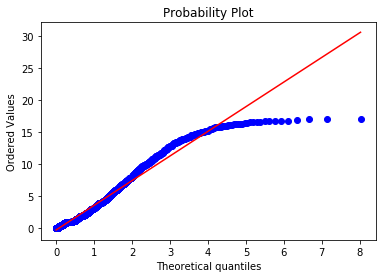



k = 3, size = 1
Number of positive jump times: 241
Mean: 0.7722489626556015


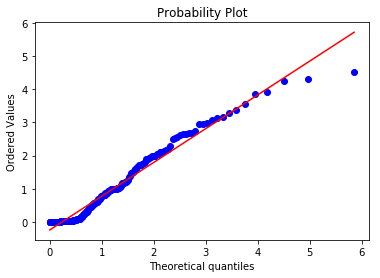



k = 3, size = 2
Number of positive jump times: 205
Mean: 0.5372926829268292


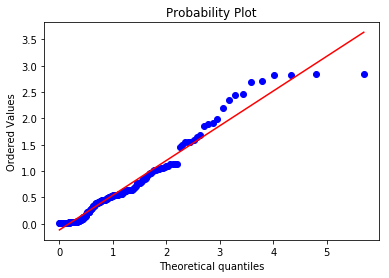



k = 3, size = 3
Number of positive jump times: 261
Mean: 0.9125019157088123


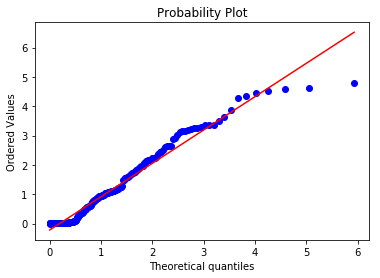



k = 3, size = 4
Number of positive jump times: 153
Mean: 0.9375686274509805


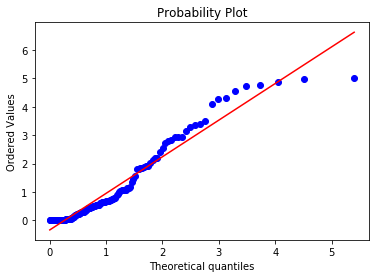



k = 3, size = 5
Number of positive jump times: 57
Mean: 3.0411228070175436


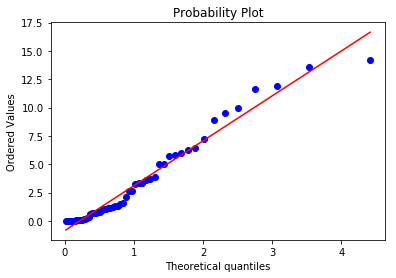



k = 3, size = 6
Number of positive jump times: 36
Mean: 0.9231666666666669


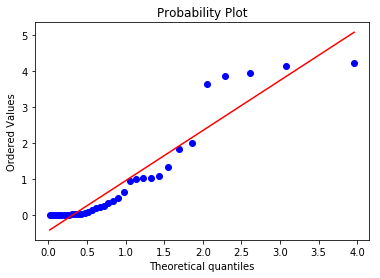



k = 3, size = 7
Number of positive jump times: 19
Mean: 1.071578947368421


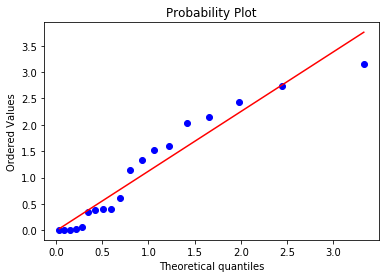



k = 3, size = 8
Number of positive jump times: 1
Mean: 67.086


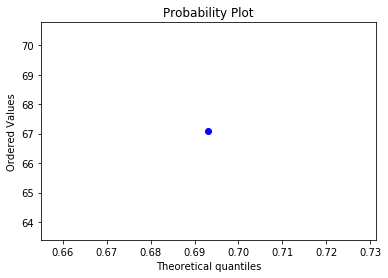



k = 3, size = 9
Number of positive jump times: 1
Mean: 0.295


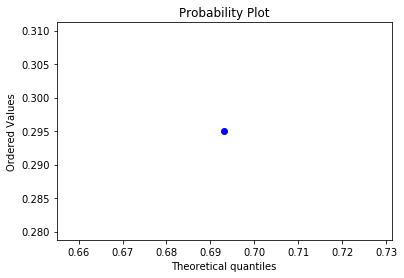



k = 3, size = 10
Number of positive jump times: 0
Mean: nan


k = 3, size = 11
Number of positive jump times: 0
Mean: nan


k = 3, size = 12
Number of positive jump times: 0
Mean: nan


k = 3, size = 13
Number of positive jump times: 0
Mean: nan


k = 3, size = 14
Number of positive jump times: 0
Mean: nan


k = 3, size = 15
Number of positive jump times: 44
Mean: 7.774068181818181


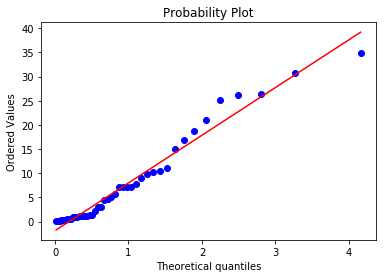



k = 3, size = 16
Number of positive jump times: 10
Mean: 0.46629999999999994


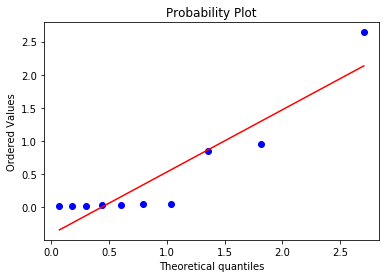



k = 3, size = 17
Number of positive jump times: 4
Mean: 0.0395


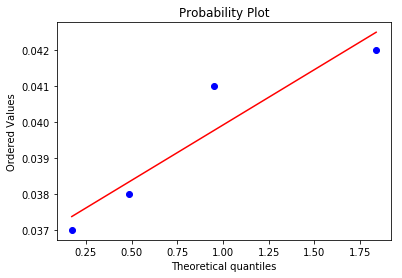



k = 3, size = 18
Number of positive jump times: 2
Mean: 4.8185


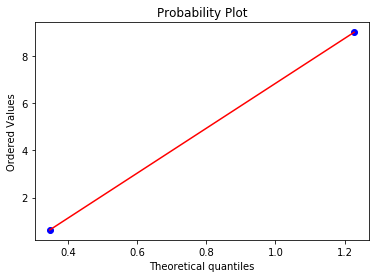



k = 3, size = 19
Number of positive jump times: 0
Mean: nan


k = 4, size = 0
Number of positive jump times: 2491
Mean: 2.750408004014452


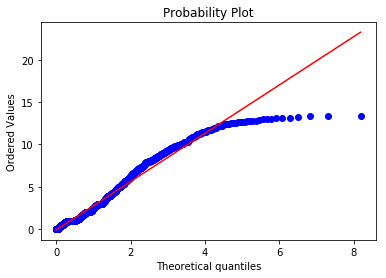



k = 4, size = 1
Number of positive jump times: 364
Mean: 0.36337637362637365


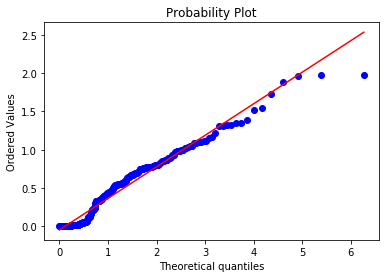



k = 4, size = 2
Number of positive jump times: 264
Mean: 0.36181439393939396


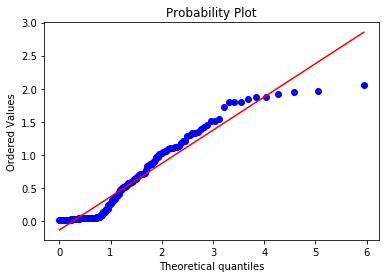



k = 4, size = 3
Number of positive jump times: 448
Mean: 0.23908705357142854


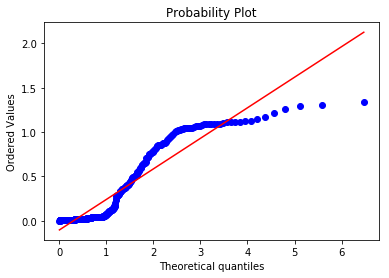



k = 4, size = 4
Number of positive jump times: 417
Mean: 0.3587242206235012


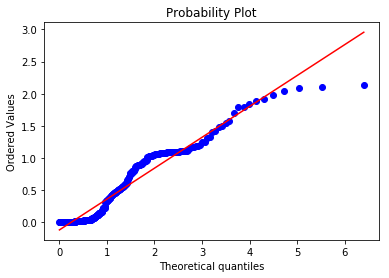



k = 4, size = 5
Number of positive jump times: 602
Mean: 0.2860299003322259


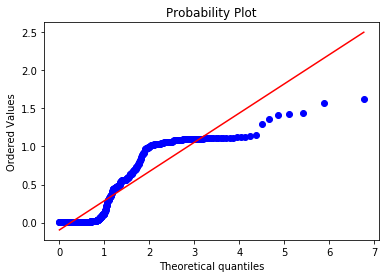



k = 4, size = 6
Number of positive jump times: 151
Mean: 0.3895430463576159


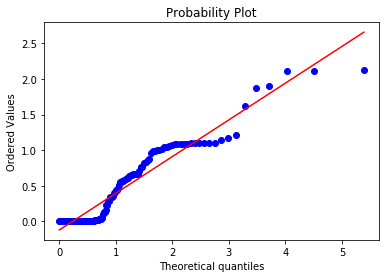



k = 4, size = 7
Number of positive jump times: 57
Mean: 0.22235087719298244


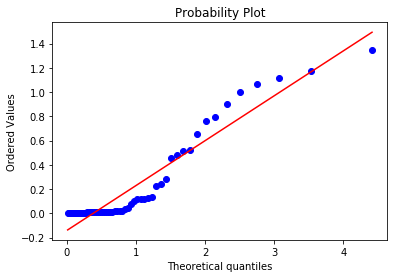



k = 4, size = 8
Number of positive jump times: 16
Mean: 0.557125


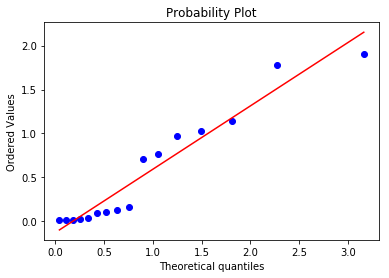



k = 4, size = 9
Number of positive jump times: 7
Mean: 8.097


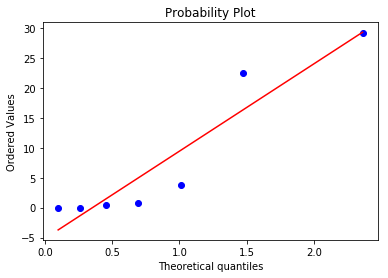



k = 4, size = 10
Number of positive jump times: 0
Mean: nan


k = 4, size = 11
Number of positive jump times: 0
Mean: nan


k = 4, size = 12
Number of positive jump times: 0
Mean: nan


k = 4, size = 13
Number of positive jump times: 0
Mean: nan


k = 4, size = 14
Number of positive jump times: 0
Mean: nan


k = 4, size = 15
Number of positive jump times: 0
Mean: nan


k = 4, size = 16
Number of positive jump times: 0
Mean: nan


k = 4, size = 17
Number of positive jump times: 0
Mean: nan


k = 4, size = 18
Number of positive jump times: 17
Mean: 1.7026470588235292


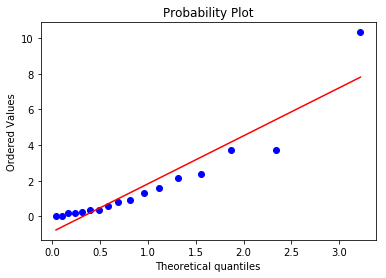



k = 4, size = 19
Number of positive jump times: 0
Mean: nan


k = 4, size = 20
Number of positive jump times: 7
Mean: 3.0959999999999996


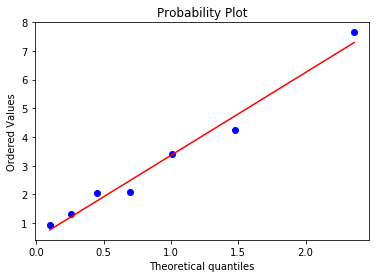



k = 4, size = 21
Number of positive jump times: 1
Mean: 0.692


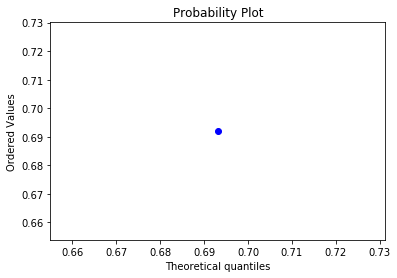



k = 4, size = 22
Number of positive jump times: 0
Mean: nan


k = 5, size = 0
Number of positive jump times: 2808
Mean: 2.5326627492877494


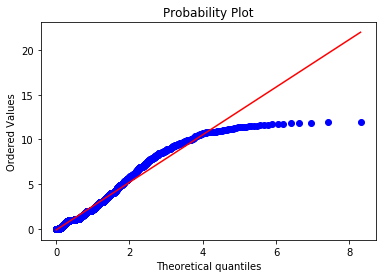



k = 5, size = 1
Number of positive jump times: 357
Mean: 0.37254341736694674


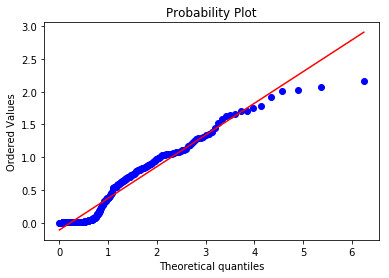



k = 5, size = 2
Number of positive jump times: 231
Mean: 0.2972900432900433


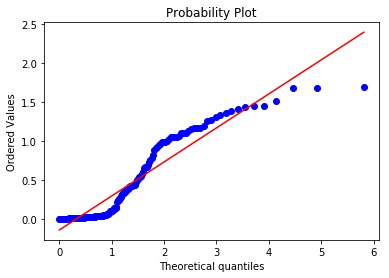



k = 5, size = 3
Number of positive jump times: 526
Mean: 0.23481558935361216


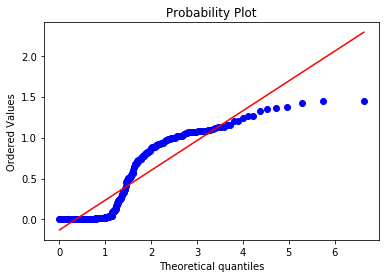



k = 5, size = 4
Number of positive jump times: 214
Mean: 0.6321028037383176


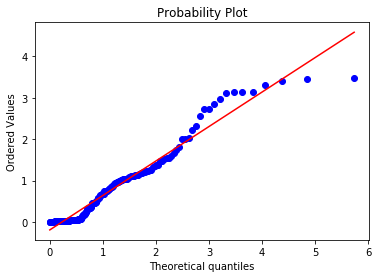



k = 5, size = 5
Number of positive jump times: 118
Mean: 0.6638983050847458


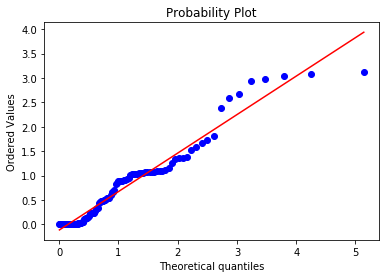



k = 5, size = 6
Number of positive jump times: 108
Mean: 0.6758703703703703


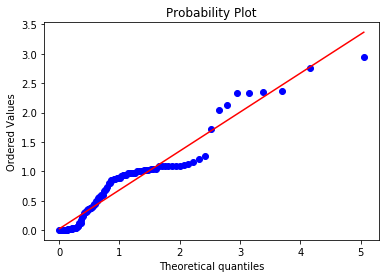



k = 5, size = 7
Number of positive jump times: 23
Mean: 0.5140434782608696


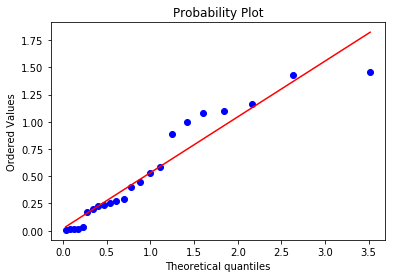



k = 5, size = 8
Number of positive jump times: 20
Mean: 0.01085


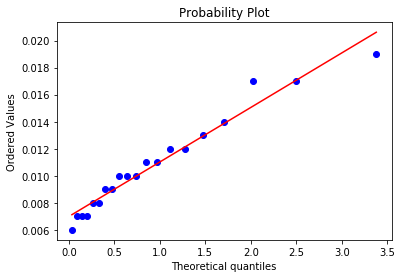



k = 5, size = 9
Number of positive jump times: 18
Mean: 2.153111111111111


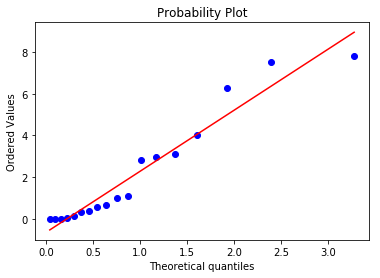



k = 5, size = 10
Number of positive jump times: 2
Mean: 1.9949999999999999


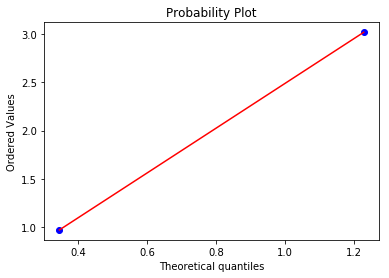



k = 5, size = 11
Number of positive jump times: 1
Mean: 1.949


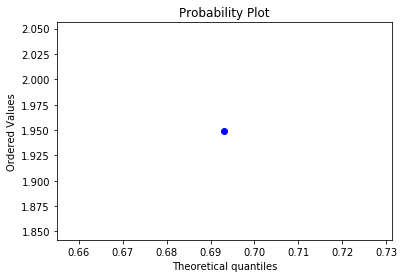



k = 5, size = 12
Number of positive jump times: 0
Mean: nan


k = 5, size = 13
Number of positive jump times: 0
Mean: nan


k = 5, size = 14
Number of positive jump times: 0
Mean: nan


k = 5, size = 15
Number of positive jump times: 0
Mean: nan


k = 5, size = 16
Number of positive jump times: 0
Mean: nan


k = 5, size = 17
Number of positive jump times: 0
Mean: nan


k = 5, size = 18
Number of positive jump times: 21
Mean: 8.360619047619046


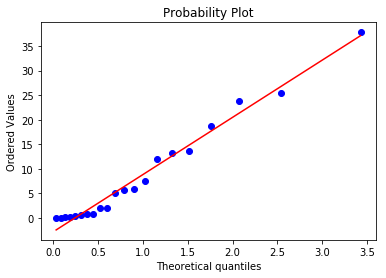



k = 5, size = 19
Number of positive jump times: 78
Mean: 4.210858974358975


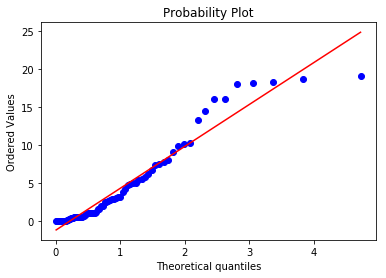



k = 5, size = 20
Number of positive jump times: 57
Mean: 0.14973684210526317


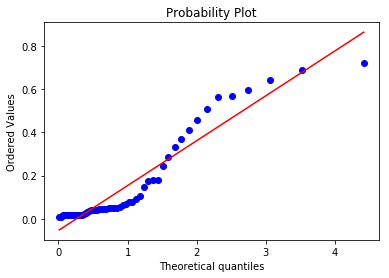



k = 5, size = 21
Number of positive jump times: 44
Mean: 1.3803181818181818


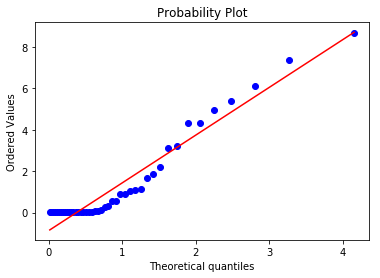



k = 5, size = 22
Number of positive jump times: 8
Mean: 1.104875


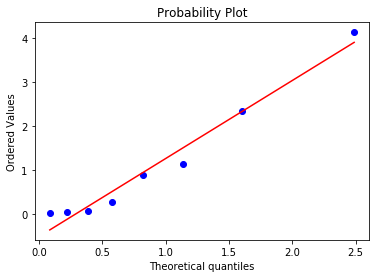



k = 5, size = 23
Number of positive jump times: 0
Mean: nan


k = 5, size = 24
Number of positive jump times: 0
Mean: nan


k = 5, size = 25
Number of positive jump times: 0
Mean: nan


k = 6, size = 0
Number of positive jump times: 2460
Mean: 3.067043902439025


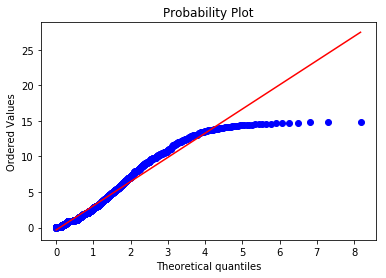



k = 6, size = 1
Number of positive jump times: 269
Mean: 0.8101561338289961


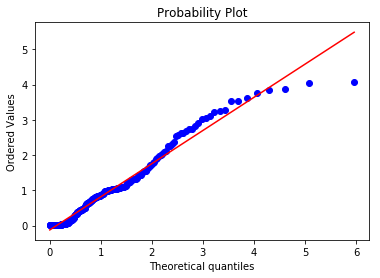



k = 6, size = 2
Number of positive jump times: 301
Mean: 0.5787375415282392


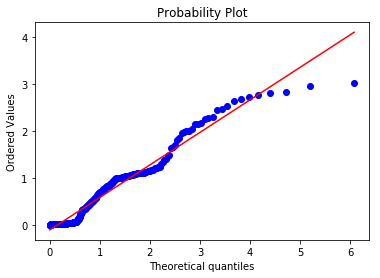



k = 6, size = 3
Number of positive jump times: 377
Mean: 0.6197214854111406


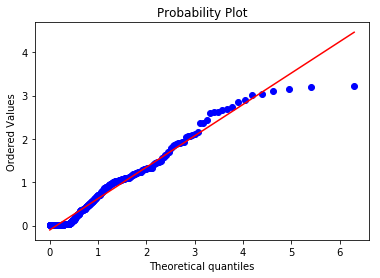



k = 6, size = 4
Number of positive jump times: 322
Mean: 0.526555900621118


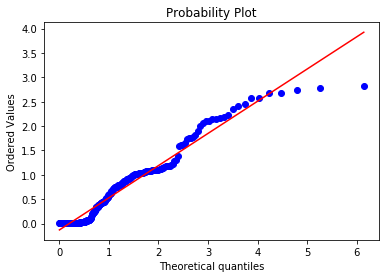



k = 6, size = 5
Number of positive jump times: 289
Mean: 0.5580484429065744


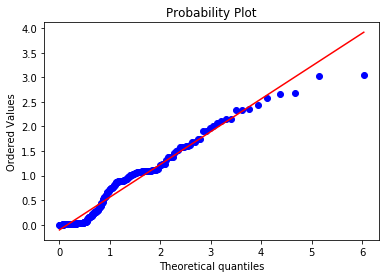



k = 6, size = 6
Number of positive jump times: 221
Mean: 0.4899321266968325


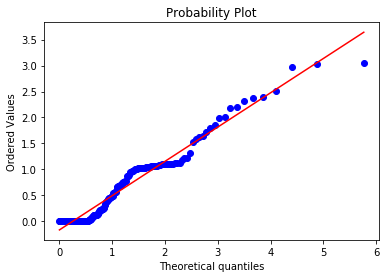



k = 6, size = 7
Number of positive jump times: 105
Mean: 0.5188190476190476


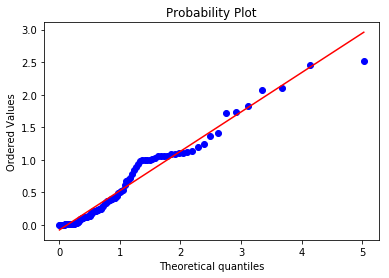



k = 6, size = 8
Number of positive jump times: 15
Mean: 1.407733333333333


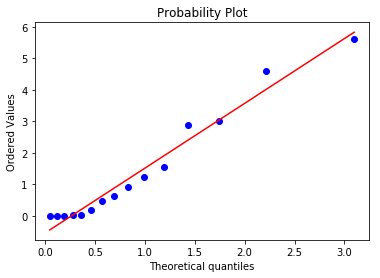



k = 6, size = 9
Number of positive jump times: 4
Mean: 11.253


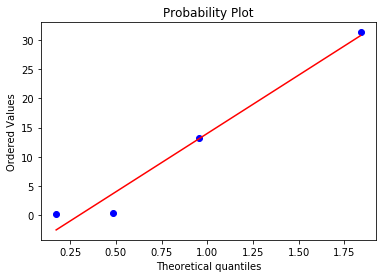



k = 6, size = 10
Number of positive jump times: 0
Mean: nan


k = 6, size = 11
Number of positive jump times: 0
Mean: nan


k = 6, size = 12
Number of positive jump times: 0
Mean: nan


k = 6, size = 13
Number of positive jump times: 0
Mean: nan


k = 6, size = 14
Number of positive jump times: 0
Mean: nan


k = 6, size = 15
Number of positive jump times: 0
Mean: nan


k = 6, size = 16
Number of positive jump times: 0
Mean: nan


k = 6, size = 17
Number of positive jump times: 58
Mean: 3.7386724137931036


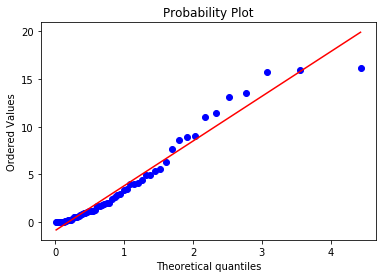



k = 6, size = 18
Number of positive jump times: 2
Mean: 0.704


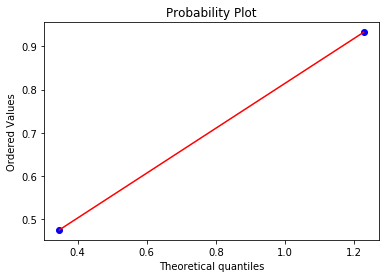



k = 6, size = 19
Number of positive jump times: 5
Mean: 0.036000000000000004


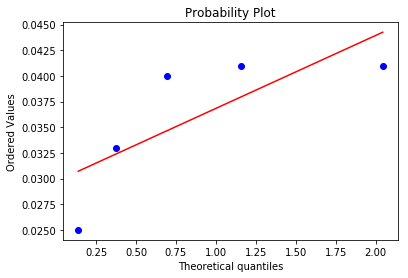



k = 6, size = 20
Number of positive jump times: 1
Mean: 0.739


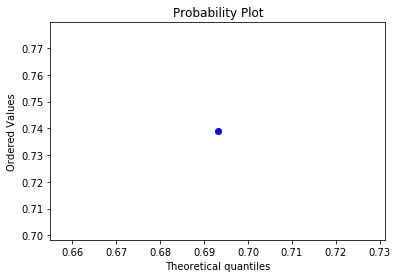



k = 7, size = 0
Number of positive jump times: 2637
Mean: 2.8337262040197193


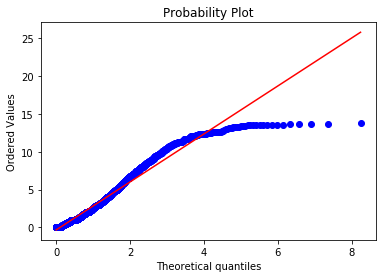



k = 7, size = 1
Number of positive jump times: 445
Mean: 0.5327460674157303


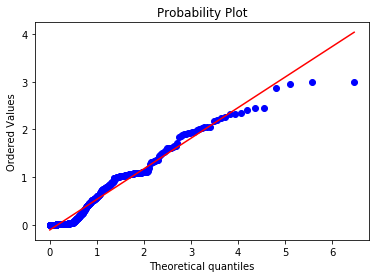



k = 7, size = 2
Number of positive jump times: 425
Mean: 0.45436941176470597


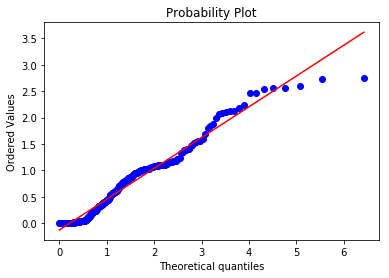



k = 7, size = 3
Number of positive jump times: 475
Mean: 0.5269726315789474


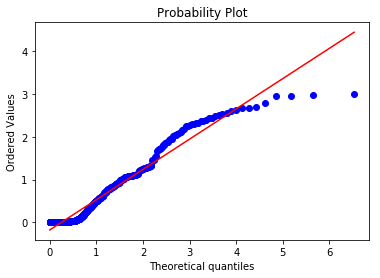



k = 7, size = 4
Number of positive jump times: 229
Mean: 0.760768558951965


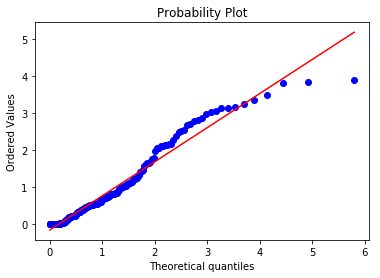



k = 7, size = 5
Number of positive jump times: 160
Mean: 0.5742499999999999


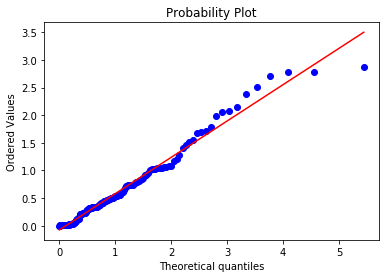



k = 7, size = 6
Number of positive jump times: 100
Mean: 1.02641


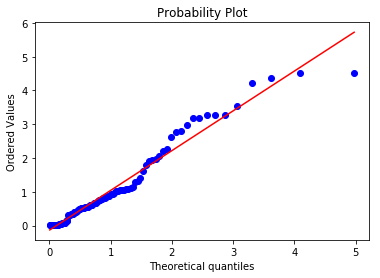



k = 7, size = 7
Number of positive jump times: 81
Mean: 0.7855308641975308


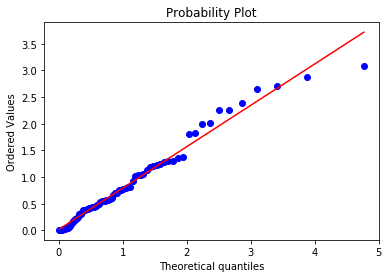



k = 7, size = 8
Number of positive jump times: 5
Mean: 0.26459999999999995


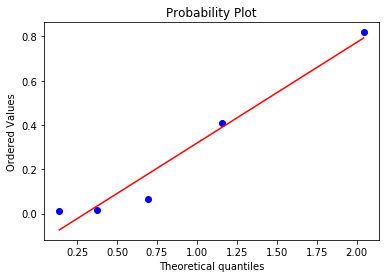



k = 7, size = 9
Number of positive jump times: 4
Mean: 1.29475


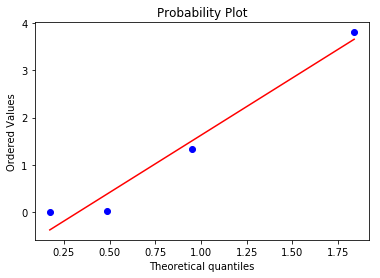



k = 7, size = 10
Number of positive jump times: 0
Mean: nan


k = 7, size = 11
Number of positive jump times: 0
Mean: nan


k = 7, size = 12
Number of positive jump times: 0
Mean: nan


k = 7, size = 13
Number of positive jump times: 0
Mean: nan


k = 7, size = 14
Number of positive jump times: 0
Mean: nan


k = 7, size = 15
Number of positive jump times: 0
Mean: nan


k = 7, size = 16
Number of positive jump times: 77
Mean: 3.7883116883116883


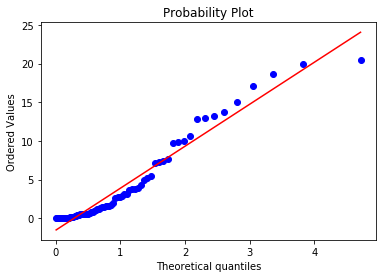



k = 7, size = 17
Number of positive jump times: 42
Mean: 1.8945238095238097


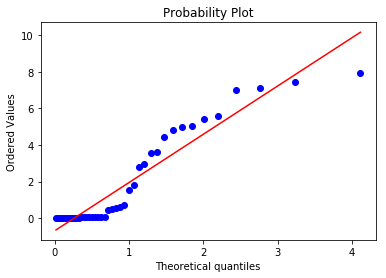



k = 7, size = 18
Number of positive jump times: 29
Mean: 1.1001034482758623


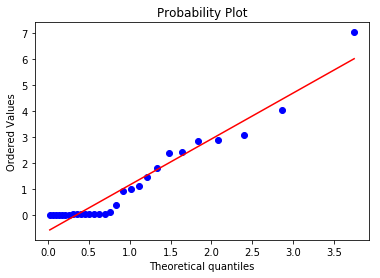



k = 7, size = 19
Number of positive jump times: 1
Mean: 8.628


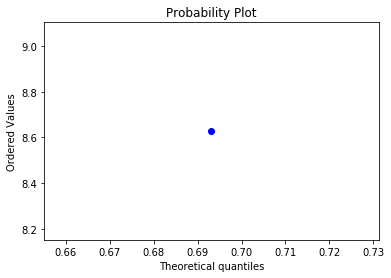



k = 7, size = 20
Number of positive jump times: 1
Mean: 1.275


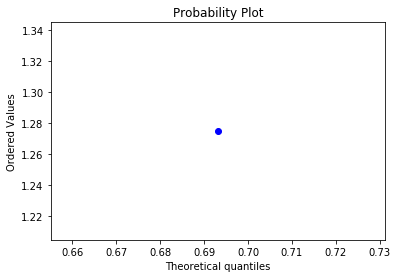



k = 8, size = 0
Number of positive jump times: 2863
Mean: 2.5849881243450925


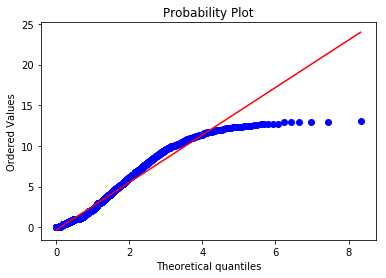



k = 8, size = 1
Number of positive jump times: 300
Mean: 0.5018033333333333


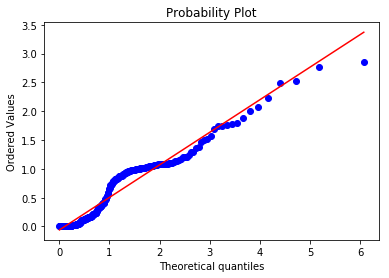



k = 8, size = 2
Number of positive jump times: 373
Mean: 0.4889276139410188


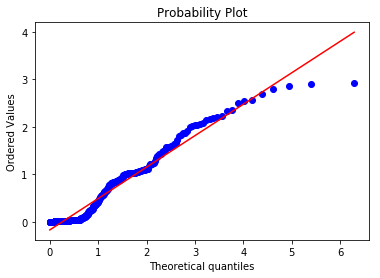



k = 8, size = 3
Number of positive jump times: 600
Mean: 0.40294833333333335


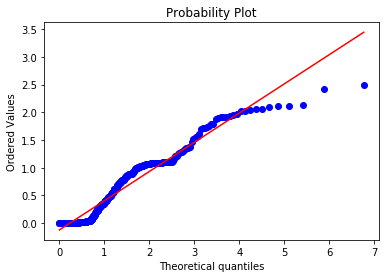



k = 8, size = 4
Number of positive jump times: 656
Mean: 0.3634192073170732


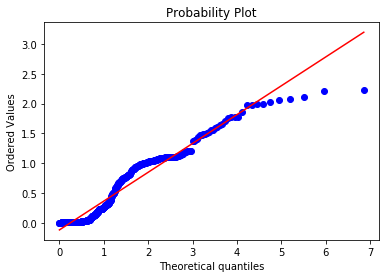



k = 8, size = 5
Number of positive jump times: 541
Mean: 0.3059426987060998


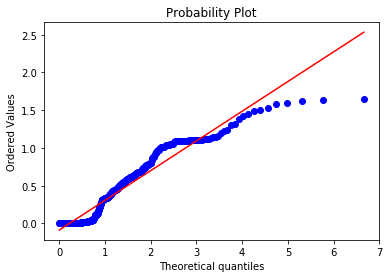



k = 8, size = 6
Number of positive jump times: 440
Mean: 0.34649772727272726


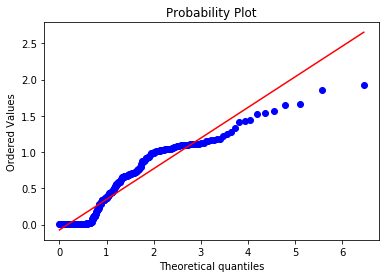



k = 8, size = 7
Number of positive jump times: 163
Mean: 0.32473006134969323


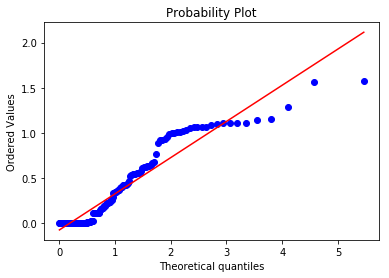



k = 8, size = 8
Number of positive jump times: 22
Mean: 0.4326363636363636


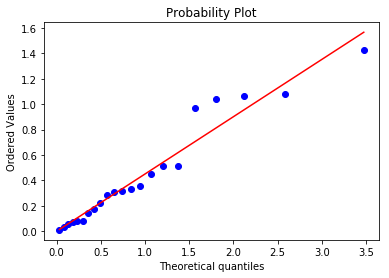



k = 8, size = 9
Number of positive jump times: 4
Mean: 0.3685


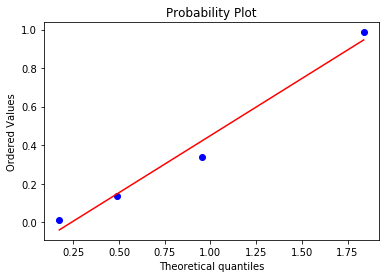



k = 8, size = 10
Number of positive jump times: 0
Mean: nan


k = 8, size = 11
Number of positive jump times: 0
Mean: nan


k = 8, size = 12
Number of positive jump times: 0
Mean: nan


k = 8, size = 13
Number of positive jump times: 0
Mean: nan


k = 8, size = 14
Number of positive jump times: 0
Mean: nan


k = 8, size = 15
Number of positive jump times: 0
Mean: nan


k = 8, size = 16
Number of positive jump times: 0
Mean: nan


k = 8, size = 17
Number of positive jump times: 0
Mean: nan


k = 8, size = 18
Number of positive jump times: 0
Mean: nan


k = 8, size = 19
Number of positive jump times: 0
Mean: nan


k = 8, size = 20
Number of positive jump times: 16
Mean: 1.1678125000000001


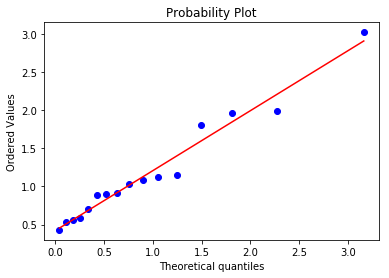



k = 8, size = 21
Number of positive jump times: 26
Mean: 5.773538461538463


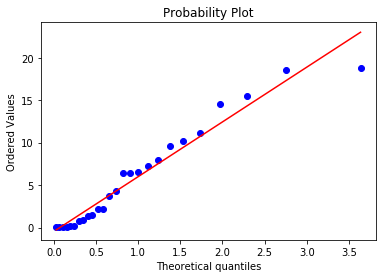



k = 8, size = 22
Number of positive jump times: 20
Mean: 0.26830000000000004


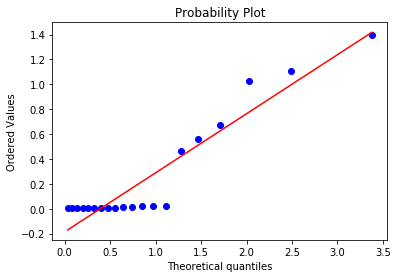



k = 8, size = 23
Number of positive jump times: 3
Mean: 3.475333333333333


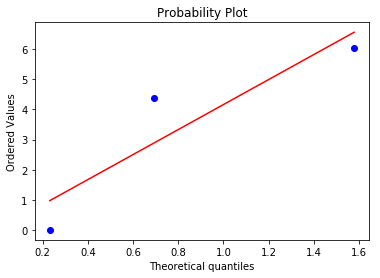



k = 8, size = 24
Number of positive jump times: 3
Mean: 0.31


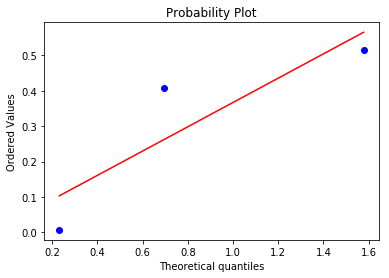



k = 8, size = 25
Number of positive jump times: 6
Mean: 2.9094999999999995


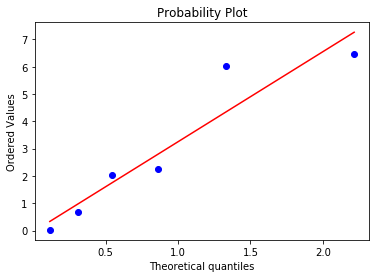



k = 8, size = 26
Number of positive jump times: 0
Mean: nan


k = 8, size = 27
Number of positive jump times: 0
Mean: nan


k = 9, size = 0
Number of positive jump times: 2345
Mean: 2.4191599147121536


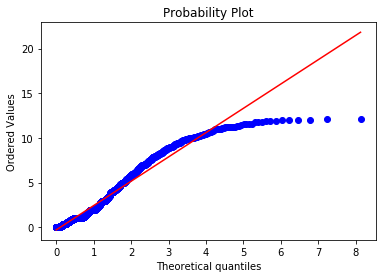



k = 9, size = 1
Number of positive jump times: 354
Mean: 0.4096751412429378


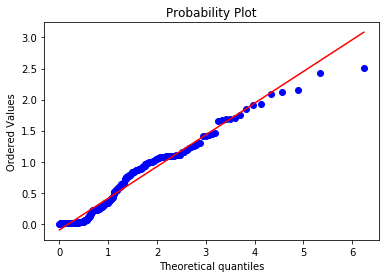



k = 9, size = 2
Number of positive jump times: 288
Mean: 0.3877986111111111


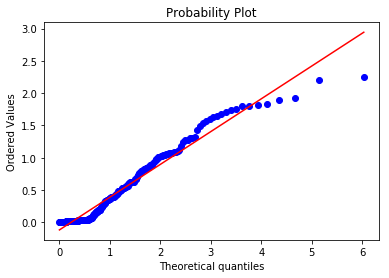



k = 9, size = 3
Number of positive jump times: 389
Mean: 0.20330591259640102


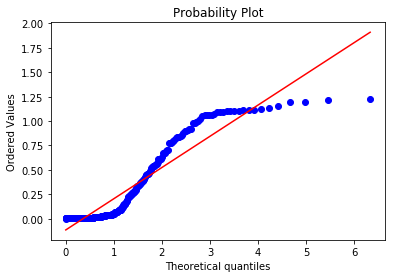



k = 9, size = 4
Number of positive jump times: 246
Mean: 0.526959349593496


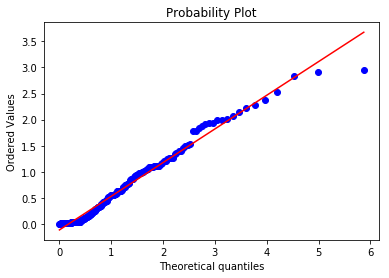



k = 9, size = 5
Number of positive jump times: 113
Mean: 0.8386991150442478


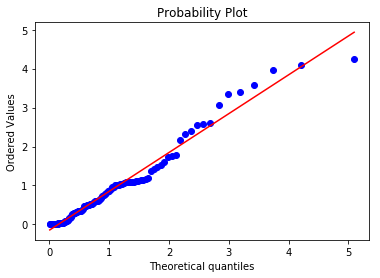



k = 9, size = 6
Number of positive jump times: 103
Mean: 0.564009708737864


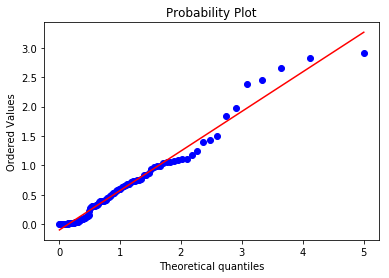



k = 9, size = 7
Number of positive jump times: 24
Mean: 0.7099583333333334


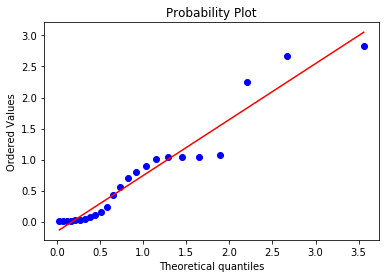



k = 9, size = 8
Number of positive jump times: 22
Mean: 0.8193636363636365


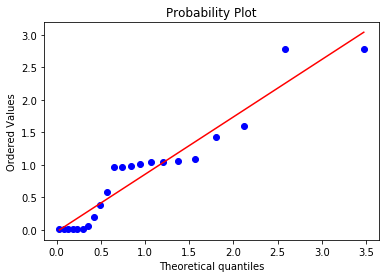



k = 9, size = 9
Number of positive jump times: 7
Mean: 0.12342857142857143


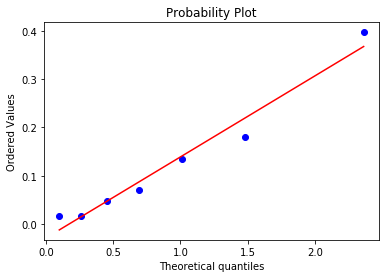



k = 9, size = 10
Number of positive jump times: 2
Mean: 5.0515


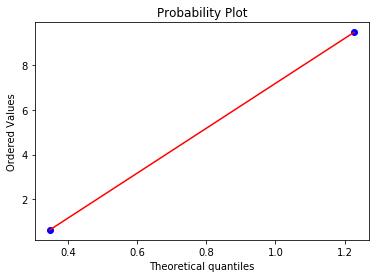



k = 9, size = 11
Number of positive jump times: 5
Mean: 22.200999999999997


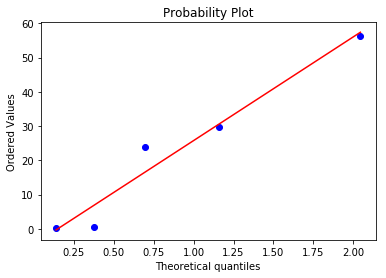



k = 9, size = 12
Number of positive jump times: 0
Mean: nan


k = 9, size = 13
Number of positive jump times: 1
Mean: 0.6


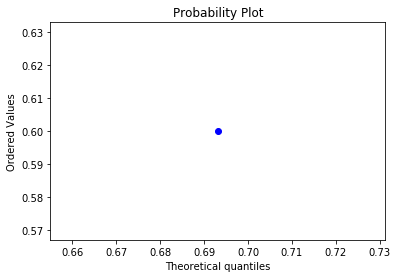



k = 9, size = 14
Number of positive jump times: 0
Mean: nan


k = 9, size = 15
Number of positive jump times: 0
Mean: nan


k = 9, size = 16
Number of positive jump times: 0
Mean: nan


k = 9, size = 17
Number of positive jump times: 0
Mean: nan


k = 9, size = 18
Number of positive jump times: 49
Mean: 2.6969387755102034


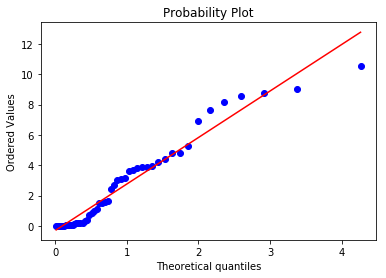



k = 9, size = 19
Number of positive jump times: 133
Mean: 1.8996917293233084


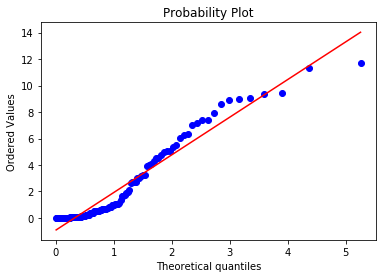



k = 9, size = 20
Number of positive jump times: 27
Mean: 0.045555555555555564


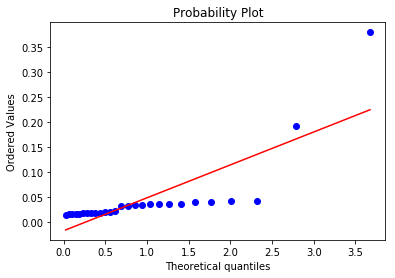



k = 9, size = 21
Number of positive jump times: 74
Mean: 0.027797297297297303


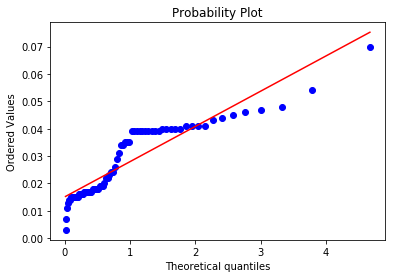



k = 9, size = 22
Number of positive jump times: 7
Mean: 1.0015714285714286


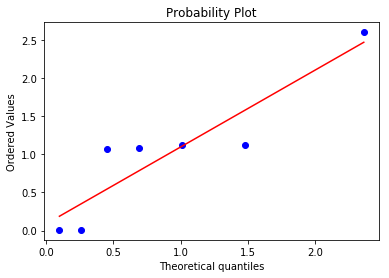



k = 9, size = 23
Number of positive jump times: 2
Mean: 3.5815


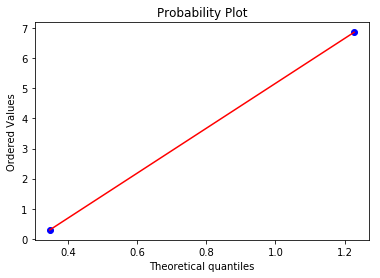



k = 10, size = 0
Number of positive jump times: 1667
Mean: 2.082781043791242


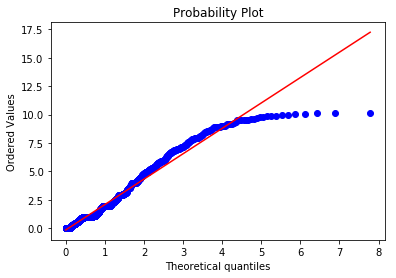



k = 10, size = 1
Number of positive jump times: 406
Mean: 0.37838916256157634


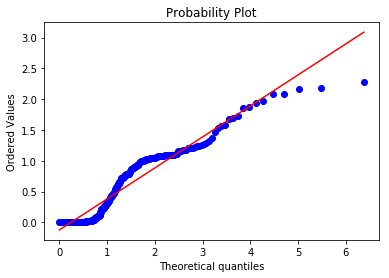



k = 10, size = 2
Number of positive jump times: 197
Mean: 0.6213299492385788


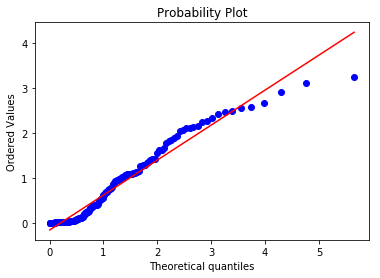



k = 10, size = 3
Number of positive jump times: 339
Mean: 0.4502330383480826


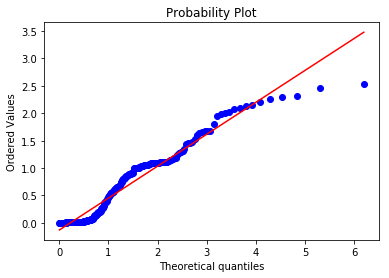



k = 10, size = 4
Number of positive jump times: 280
Mean: 0.5612035714285715


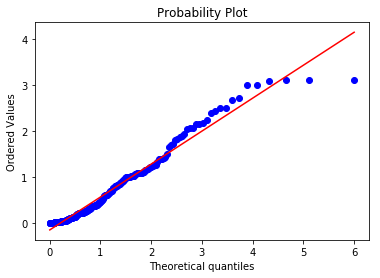



k = 10, size = 5
Number of positive jump times: 240
Mean: 0.5592374999999999


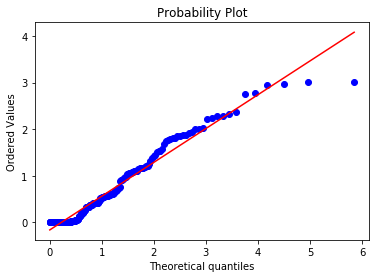



k = 10, size = 6
Number of positive jump times: 261
Mean: 0.33579310344827584


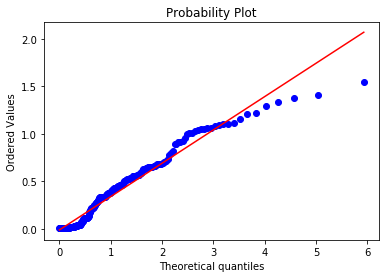



k = 10, size = 7
Number of positive jump times: 191
Mean: 0.371130890052356


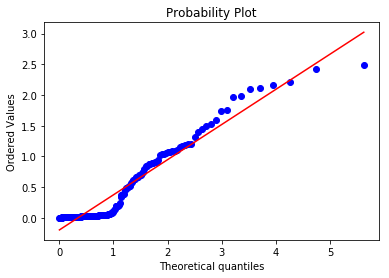



k = 10, size = 8
Number of positive jump times: 210
Mean: 0.3921428571428572


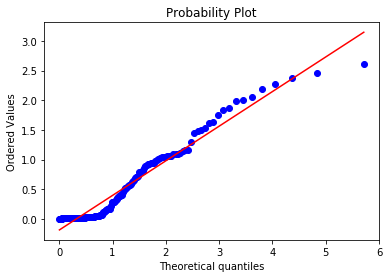



k = 10, size = 9
Number of positive jump times: 271
Mean: 0.37368634686346863


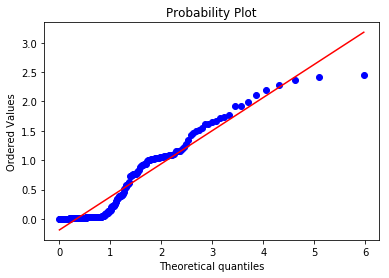



k = 10, size = 10
Number of positive jump times: 125
Mean: 0.5788719999999999


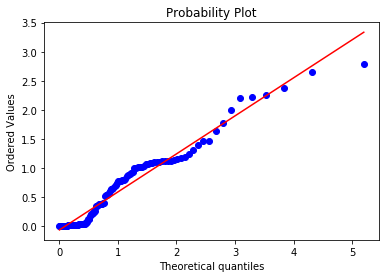



k = 10, size = 11
Number of positive jump times: 70
Mean: 0.707542857142857


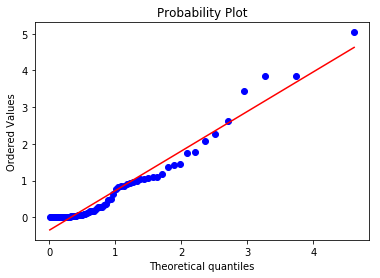



k = 10, size = 12
Number of positive jump times: 36
Mean: 1.0318611111111113


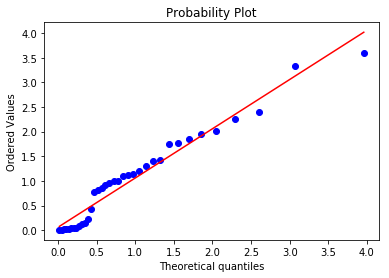



k = 10, size = 13
Number of positive jump times: 27
Mean: 0.30444444444444446


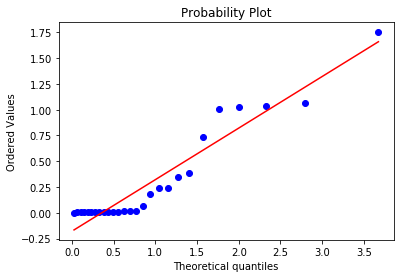



k = 10, size = 14
Number of positive jump times: 7
Mean: 0.32242857142857145


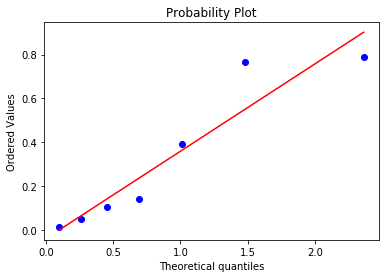



k = 10, size = 15
Number of positive jump times: 0
Mean: nan


k = 10, size = 16
Number of positive jump times: 0
Mean: nan


k = 10, size = 17
Number of positive jump times: 0
Mean: nan


k = 10, size = 18
Number of positive jump times: 0
Mean: nan


k = 10, size = 19
Number of positive jump times: 0
Mean: nan


k = 10, size = 20
Number of positive jump times: 0
Mean: nan


k = 10, size = 21
Number of positive jump times: 30
Mean: 0.6735666666666665


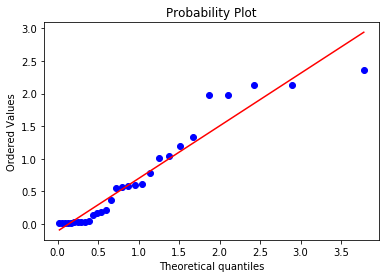



k = 10, size = 22
Number of positive jump times: 6
Mean: 0.10283333333333335


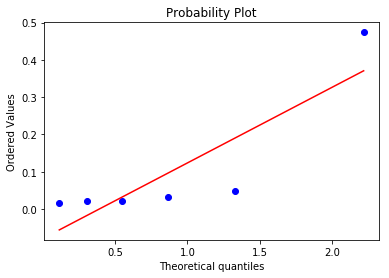



k = 10, size = 23
Number of positive jump times: 3
Mean: 6.020333333333333


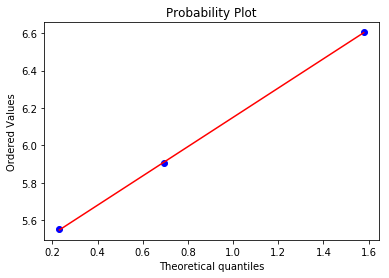



k = 10, size = 24
Number of positive jump times: 0
Mean: nan


k = 10, size = 25
Number of positive jump times: 0
Mean: nan


k = 10, size = 26
Number of positive jump times: 1
Mean: 0.04


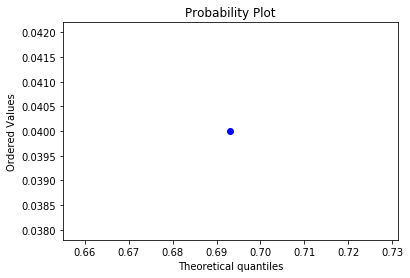



k = 10, size = 27
Number of positive jump times: 0
Mean: nan


k = 10, size = 28
Number of positive jump times: 0
Mean: nan


k = 10, size = 29
Number of positive jump times: 0
Mean: nan


k = 10, size = 30
Number of positive jump times: 0
Mean: nan


k = -10, size = 1
Number of negative jump times: 25
Mean: 13.212759999999998


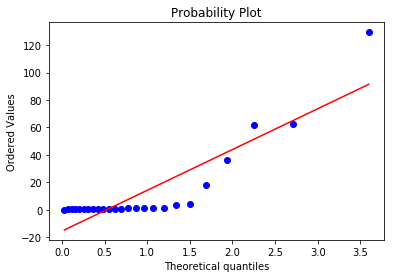



k = -10, size = 2
Number of negative jump times: 32
Mean: 36.91903125


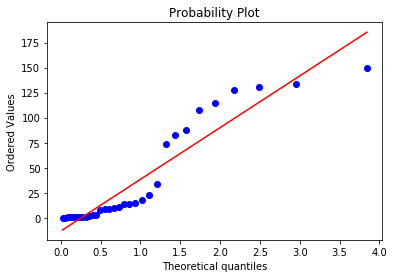



k = -10, size = 3
Number of negative jump times: 11
Mean: 38.93390909090909


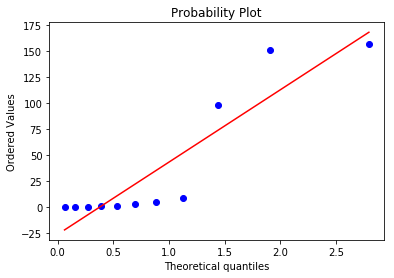



k = -10, size = 4
Number of negative jump times: 2
Mean: 243.307


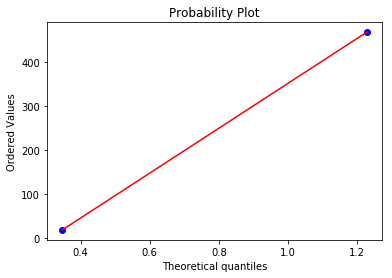



k = -10, size = 5
Number of negative jump times: 0
Mean: nan


k = -10, size = 6
Number of negative jump times: 0
Mean: nan


k = -10, size = 7
Number of negative jump times: 0
Mean: nan


k = -10, size = 8
Number of negative jump times: 0
Mean: nan


k = -10, size = 9
Number of negative jump times: 0
Mean: nan


k = -10, size = 10
Number of negative jump times: 1
Mean: 373.572


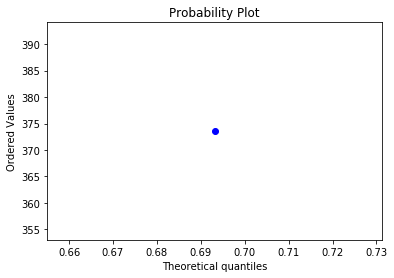



k = -10, size = 11
Number of negative jump times: 0
Mean: nan


k = -10, size = 12
Number of negative jump times: 3
Mean: 44.74633333333333


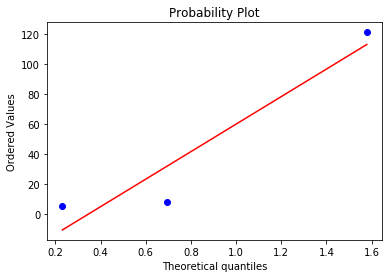



k = -10, size = 13
Number of negative jump times: 12
Mean: 2.638


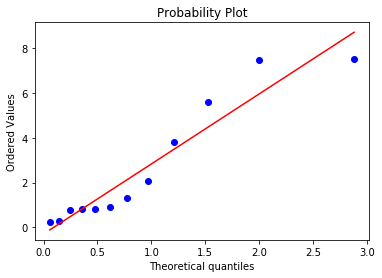



k = -10, size = 14
Number of negative jump times: 1
Mean: 1.647


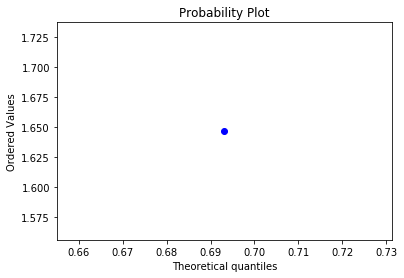



k = -9, size = 1
Number of negative jump times: 55
Mean: 3.419690909090909


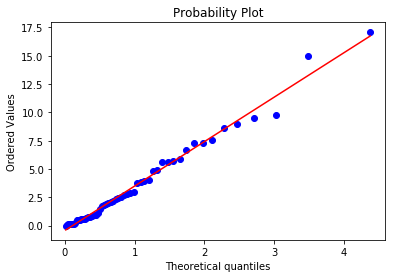



k = -9, size = 2
Number of negative jump times: 11
Mean: 0.8421818181818181


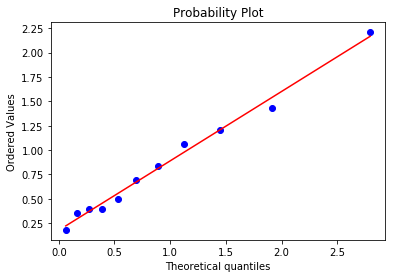



k = -9, size = 3
Number of negative jump times: 23
Mean: 1.5585217391304347


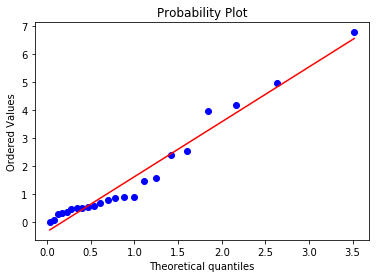



k = -9, size = 4
Number of negative jump times: 0
Mean: nan


k = -9, size = 5
Number of negative jump times: 0
Mean: nan


k = -9, size = 6
Number of negative jump times: 0
Mean: nan


k = -9, size = 7
Number of negative jump times: 0
Mean: nan


k = -9, size = 8
Number of negative jump times: 2
Mean: 27.127000000000002


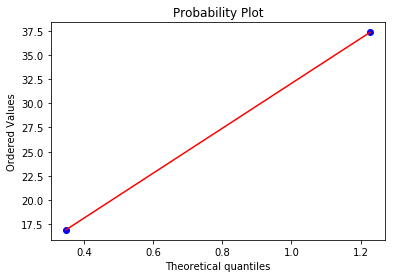



k = -9, size = 9
Number of negative jump times: 0
Mean: nan


k = -9, size = 10
Number of negative jump times: 0
Mean: nan


k = -9, size = 11
Number of negative jump times: 0
Mean: nan


k = -9, size = 12
Number of negative jump times: 0
Mean: nan


k = -8, size = 1
Number of negative jump times: 87
Mean: 1.1833103448275861


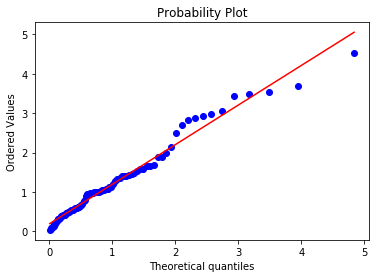



k = -8, size = 2
Number of negative jump times: 27
Mean: 4.271259259259259


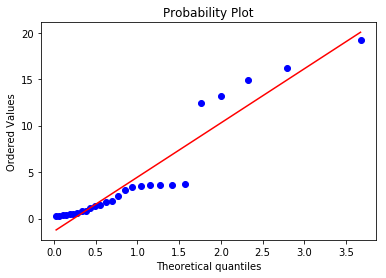



k = -8, size = 3
Number of negative jump times: 19
Mean: 1.3994736842105262


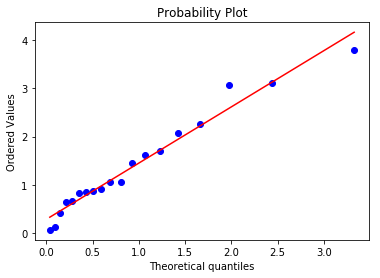



k = -8, size = 4
Number of negative jump times: 8
Mean: 0.6872499999999999


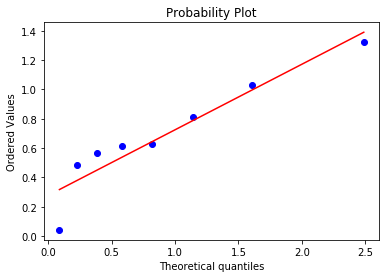



k = -8, size = 5
Number of negative jump times: 0
Mean: nan


k = -8, size = 6
Number of negative jump times: 0
Mean: nan


k = -8, size = 7
Number of negative jump times: 0
Mean: nan


k = -8, size = 8
Number of negative jump times: 0
Mean: nan


k = -8, size = 9
Number of negative jump times: 0
Mean: nan


k = -8, size = 10
Number of negative jump times: 1
Mean: 3.002


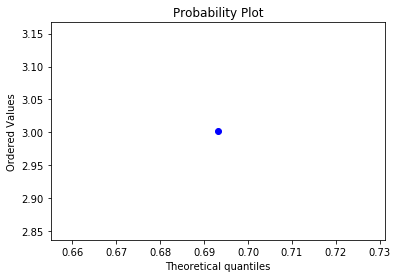



k = -8, size = 11
Number of negative jump times: 8
Mean: 2.3335


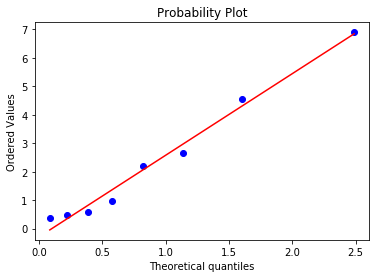



k = -8, size = 12
Number of negative jump times: 6
Mean: 3.1838333333333337


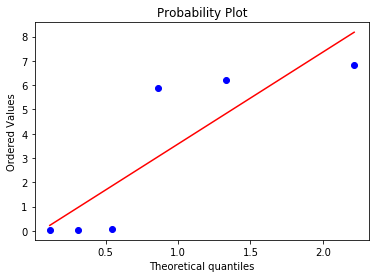



k = -8, size = 13
Number of negative jump times: 30
Mean: 3.0013999999999994


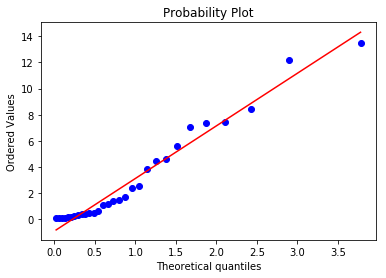



k = -8, size = 14
Number of negative jump times: 12
Mean: 4.217083333333334


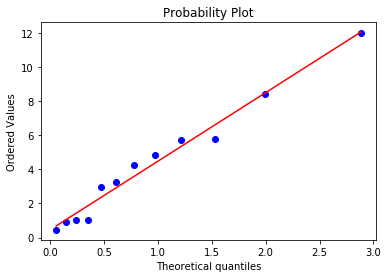



k = -8, size = 15
Number of negative jump times: 3
Mean: 1.8346666666666664


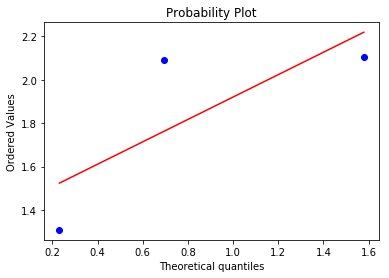



k = -7, size = 1
Number of negative jump times: 41
Mean: 5.479170731707318


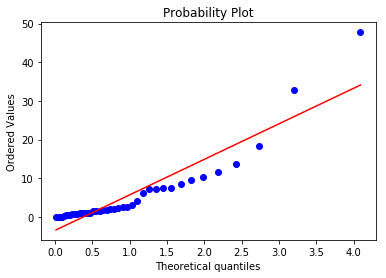



k = -7, size = 2
Number of negative jump times: 103
Mean: 1.8053980582524267


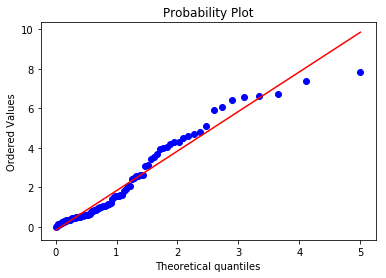



k = -7, size = 3
Number of negative jump times: 13
Mean: 0.6317692307692307


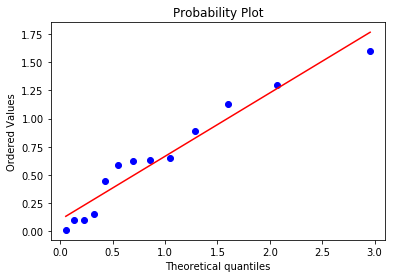



k = -7, size = 4
Number of negative jump times: 94
Mean: 1.6750851063829788


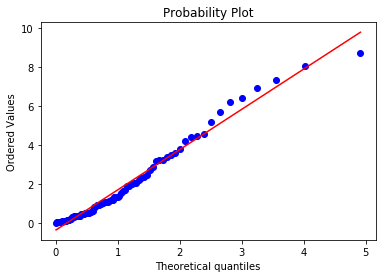



k = -7, size = 5
Number of negative jump times: 34
Mean: 0.8139411764705883


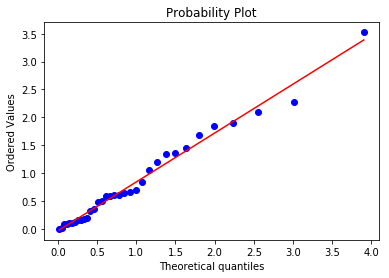



k = -7, size = 6
Number of negative jump times: 34
Mean: 1.1395882352941176


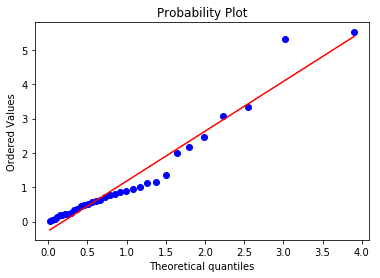



k = -7, size = 7
Number of negative jump times: 6
Mean: 3.374166666666666


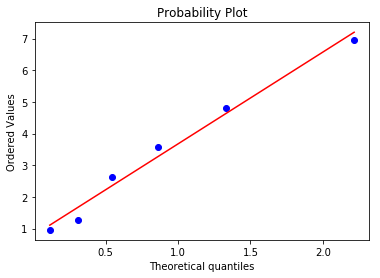



k = -7, size = 8
Number of negative jump times: 2
Mean: 2.457


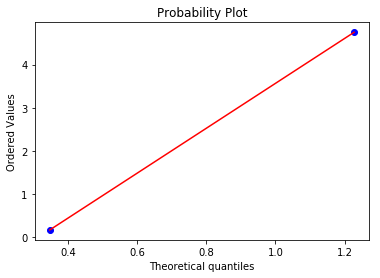



k = -7, size = 9
Number of negative jump times: 0
Mean: nan


k = -7, size = 10
Number of negative jump times: 2
Mean: 198.447


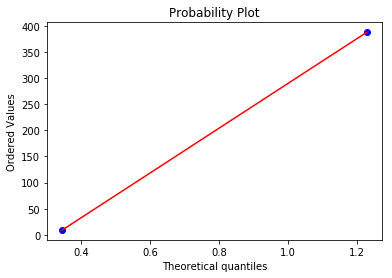



k = -7, size = 11
Number of negative jump times: 11
Mean: 2.178909090909091


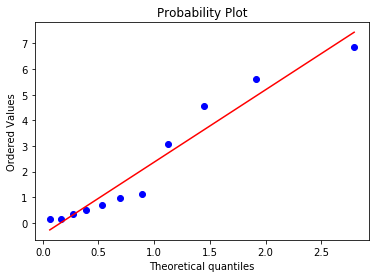



k = -7, size = 12
Number of negative jump times: 3
Mean: 452.146


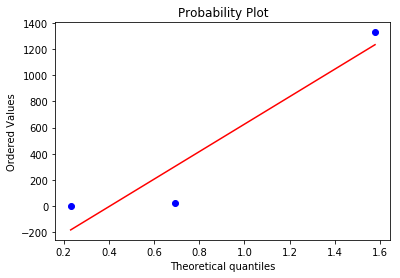



k = -7, size = 13
Number of negative jump times: 5
Mean: 0.9708


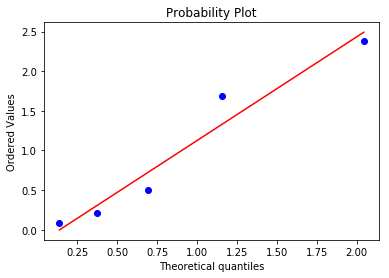



k = -7, size = 14
Number of negative jump times: 9
Mean: 1.6016666666666666


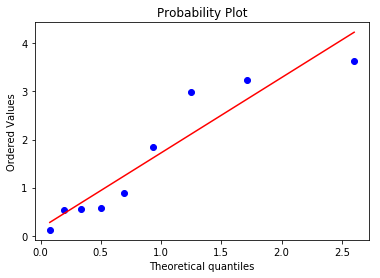



k = -7, size = 15
Number of negative jump times: 10
Mean: 0.8264999999999999


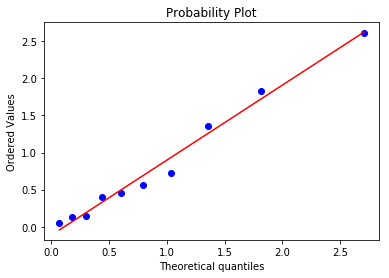



k = -7, size = 16
Number of negative jump times: 19
Mean: 3.3467894736842103


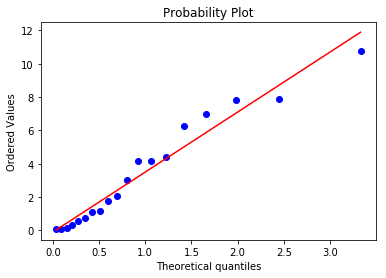



k = -7, size = 17
Number of negative jump times: 3
Mean: 0.534


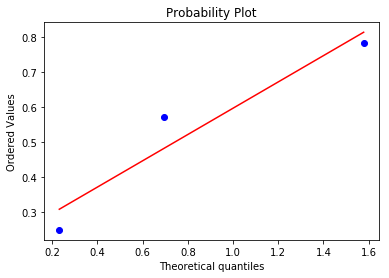



k = -6, size = 1
Number of negative jump times: 147
Mean: 0.5079931972789117


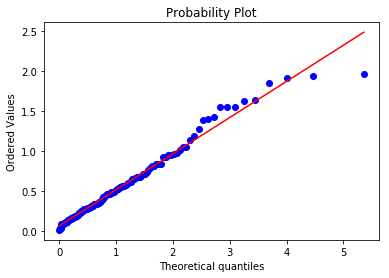



k = -6, size = 2
Number of negative jump times: 91
Mean: 2.657021978021978


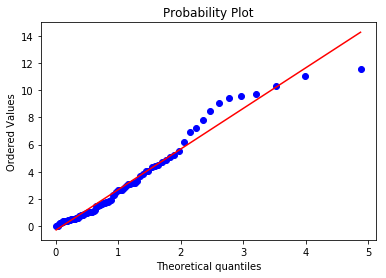



k = -6, size = 3
Number of negative jump times: 60
Mean: 0.62105


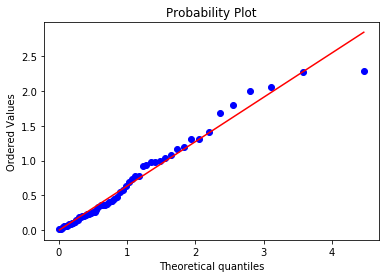



k = -6, size = 4
Number of negative jump times: 29
Mean: 0.4433793103448276


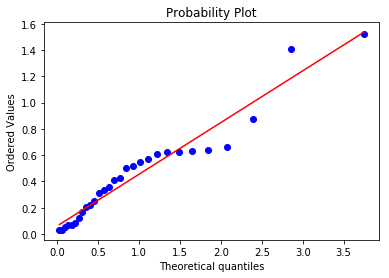



k = -6, size = 5
Number of negative jump times: 26
Mean: 0.5092307692307693


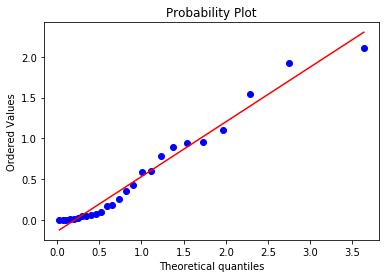



k = -6, size = 6
Number of negative jump times: 13
Mean: 0.30523076923076925


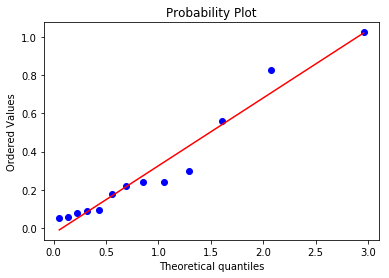



k = -6, size = 7
Number of negative jump times: 4
Mean: 0.16075000000000003


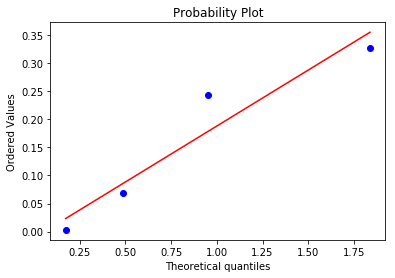



k = -6, size = 8
Number of negative jump times: 0
Mean: nan


k = -6, size = 9
Number of negative jump times: 0
Mean: nan


k = -6, size = 10
Number of negative jump times: 0
Mean: nan


k = -6, size = 11
Number of negative jump times: 0
Mean: nan


k = -6, size = 12
Number of negative jump times: 8
Mean: 8.77675


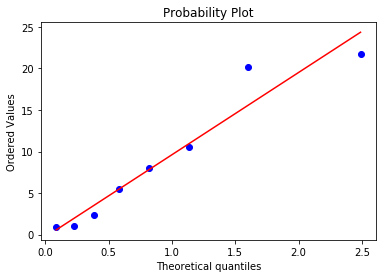



k = -6, size = 13
Number of negative jump times: 61
Mean: 1.4077540983606558


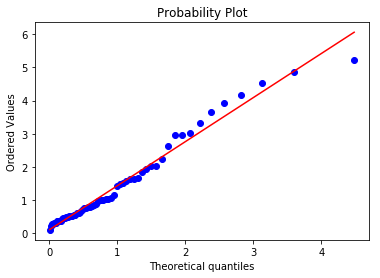



k = -6, size = 14
Number of negative jump times: 19
Mean: 10.371526315789476


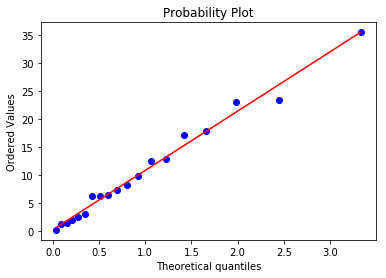



k = -6, size = 15
Number of negative jump times: 73
Mean: 5.272684931506849


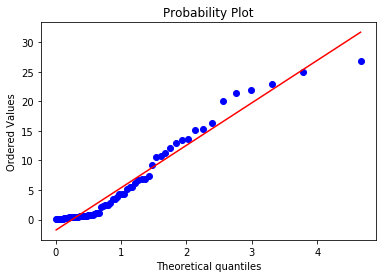



k = -6, size = 16
Number of negative jump times: 49
Mean: 0.4309183673469387


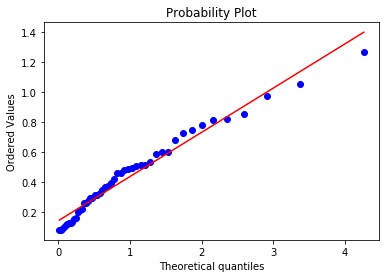



k = -6, size = 17
Number of negative jump times: 9
Mean: 2.091777777777778


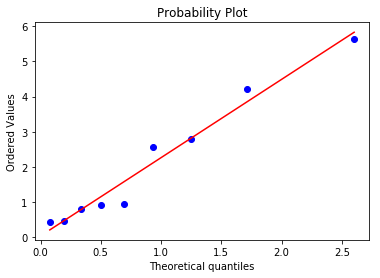



k = -6, size = 18
Number of negative jump times: 2
Mean: 5.2765


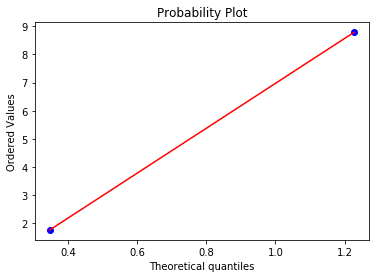



k = -5, size = 1
Number of negative jump times: 293
Mean: 1.64339590443686


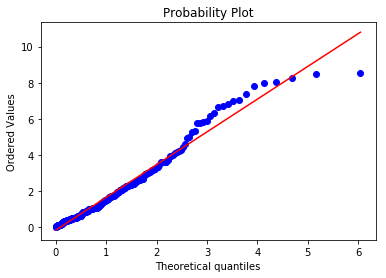



k = -5, size = 2
Number of negative jump times: 132
Mean: 1.291659090909091


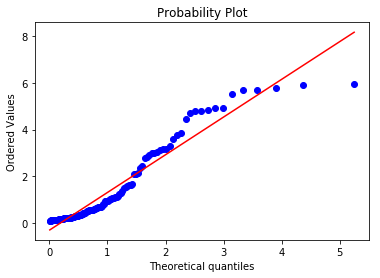



k = -5, size = 3
Number of negative jump times: 144
Mean: 0.7723333333333334


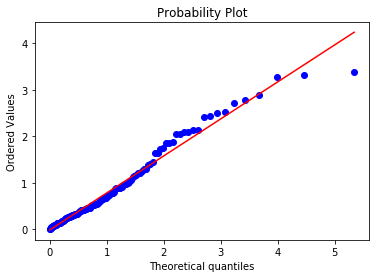



k = -5, size = 4
Number of negative jump times: 144
Mean: 0.4959583333333334


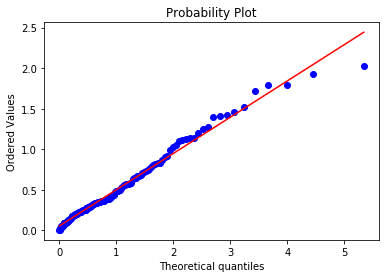



k = -5, size = 5
Number of negative jump times: 102
Mean: 2.096509803921569


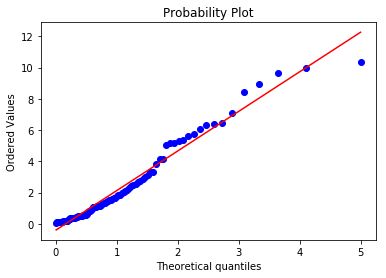



k = -5, size = 6
Number of negative jump times: 17
Mean: 0.46747058823529414


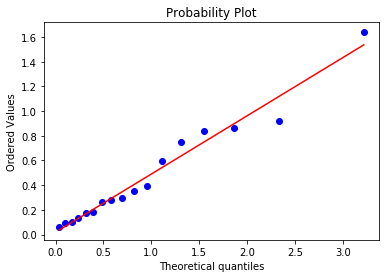



k = -5, size = 7
Number of negative jump times: 5
Mean: 0.9308000000000002


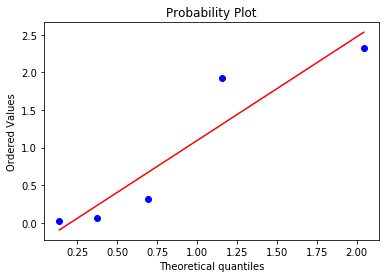



k = -5, size = 8
Number of negative jump times: 2
Mean: 0.5185


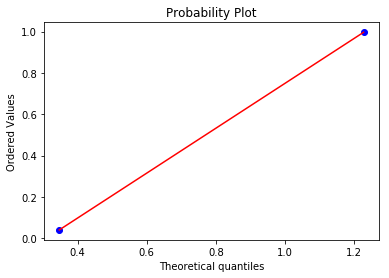



k = -5, size = 9
Number of negative jump times: 0
Mean: nan


k = -5, size = 10
Number of negative jump times: 0
Mean: nan


k = -5, size = 11
Number of negative jump times: 0
Mean: nan


k = -5, size = 12
Number of negative jump times: 0
Mean: nan


k = -5, size = 13
Number of negative jump times: 3
Mean: 18.867


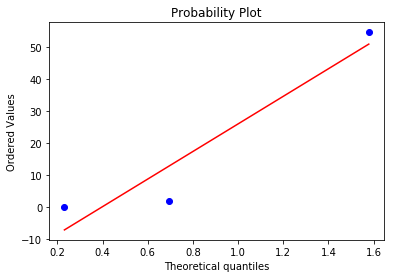



k = -5, size = 14
Number of negative jump times: 8
Mean: 0.891875


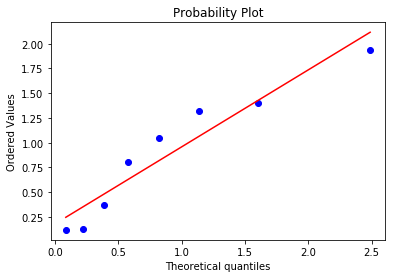



k = -5, size = 15
Number of negative jump times: 4
Mean: 16.657


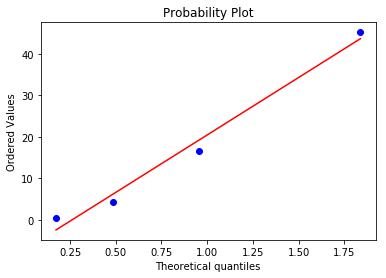



k = -5, size = 16
Number of negative jump times: 4
Mean: 0.13924999999999998


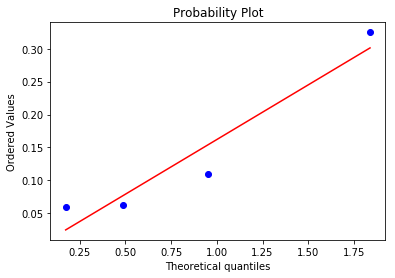



k = -5, size = 17
Number of negative jump times: 106
Mean: 0.47013207547169816


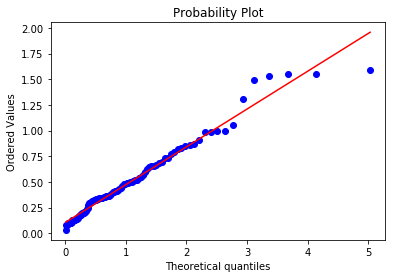



k = -5, size = 18
Number of negative jump times: 2
Mean: 1.7374999999999998


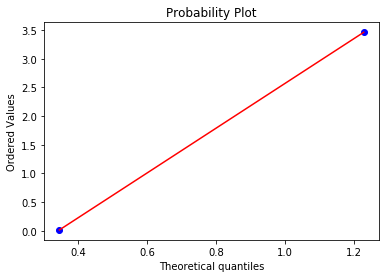



k = -5, size = 19
Number of negative jump times: 0
Mean: nan


k = -5, size = 20
Number of negative jump times: 1
Mean: 0.432


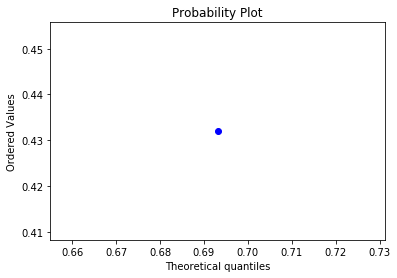



k = -4, size = 1
Number of negative jump times: 298
Mean: 1.7943859060402683


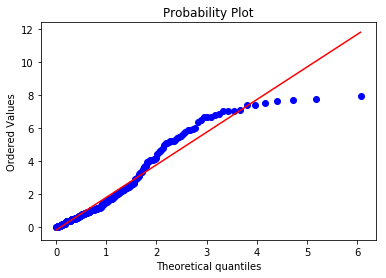



k = -4, size = 2
Number of negative jump times: 161
Mean: 1.4427204968944098


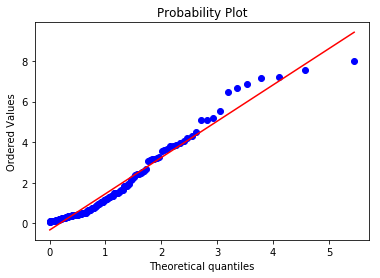



k = -4, size = 3
Number of negative jump times: 88
Mean: 1.6100454545454548


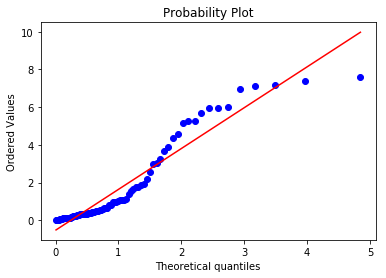



k = -4, size = 4
Number of negative jump times: 60
Mean: 1.6384833333333335


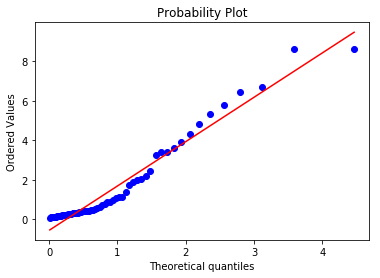



k = -4, size = 5
Number of negative jump times: 84
Mean: 0.42714285714285716


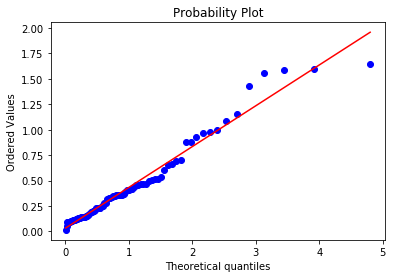



k = -4, size = 6
Number of negative jump times: 16
Mean: 0.47987500000000005


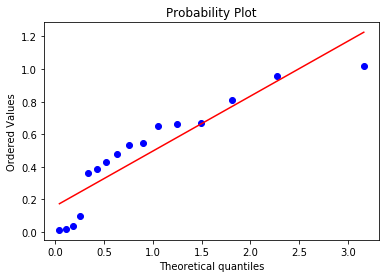



k = -4, size = 7
Number of negative jump times: 5
Mean: 0.42619999999999997


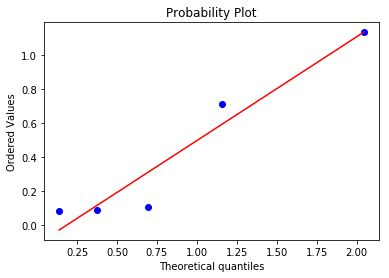



k = -4, size = 8
Number of negative jump times: 0
Mean: nan


k = -4, size = 9
Number of negative jump times: 0
Mean: nan


k = -4, size = 10
Number of negative jump times: 0
Mean: nan


k = -4, size = 11
Number of negative jump times: 0
Mean: nan


k = -4, size = 12
Number of negative jump times: 14
Mean: 6.206428571428572


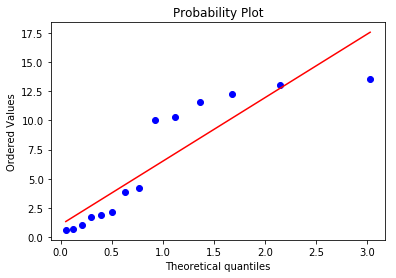



k = -4, size = 13
Number of negative jump times: 192
Mean: 3.6664427083333337


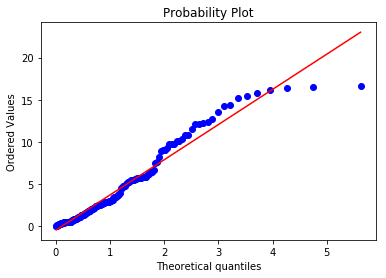



k = -4, size = 14
Number of negative jump times: 29
Mean: 2.447448275862069


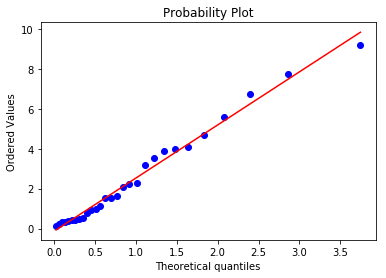



k = -4, size = 15
Number of negative jump times: 56
Mean: 7.628303571428572


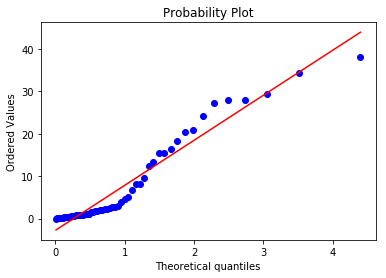



k = -4, size = 16
Number of negative jump times: 15
Mean: 2.014066666666667


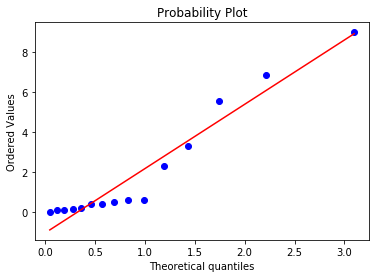



k = -4, size = 17
Number of negative jump times: 4
Mean: 3.6105


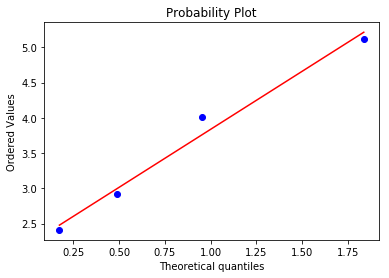



k = -4, size = 18
Number of negative jump times: 45
Mean: 3.784511111111111


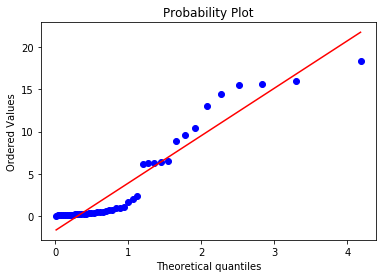



k = -4, size = 19
Number of negative jump times: 0
Mean: nan


k = -4, size = 20
Number of negative jump times: 0
Mean: nan


k = -4, size = 21
Number of negative jump times: 0
Mean: nan


k = -4, size = 22
Number of negative jump times: 1
Mean: 3.728


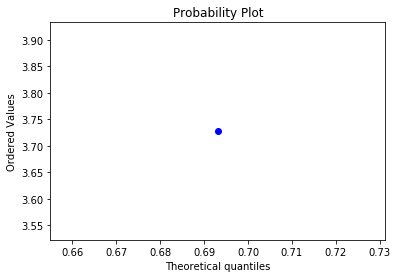



k = -3, size = 1
Number of negative jump times: 231
Mean: 2.0290259740259744


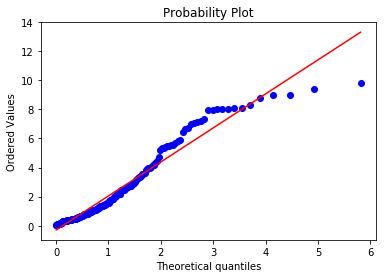



k = -3, size = 2
Number of negative jump times: 207
Mean: 2.6634782608695646


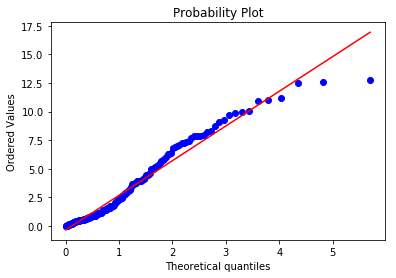



k = -3, size = 3
Number of negative jump times: 72
Mean: 1.9485833333333333


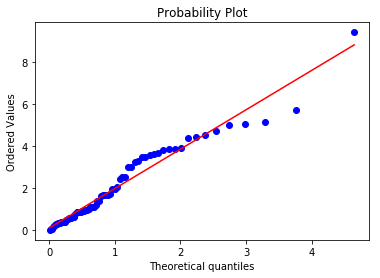



k = -3, size = 4
Number of negative jump times: 124
Mean: 2.8853548387096772


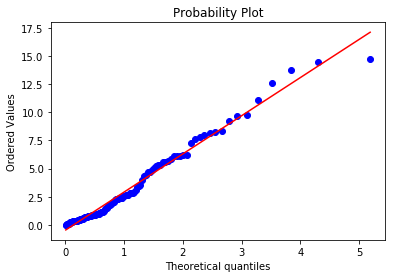



k = -3, size = 5
Number of negative jump times: 69
Mean: 3.2056086956521734


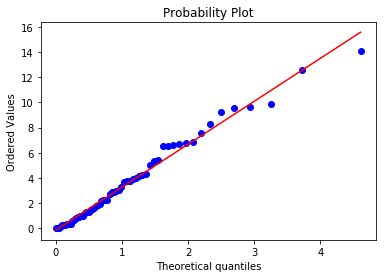



k = -3, size = 6
Number of negative jump times: 87
Mean: 1.5967126436781605


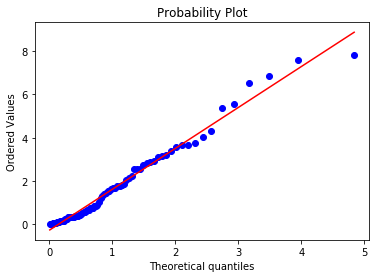



k = -3, size = 7
Number of negative jump times: 75
Mean: 4.359746666666666


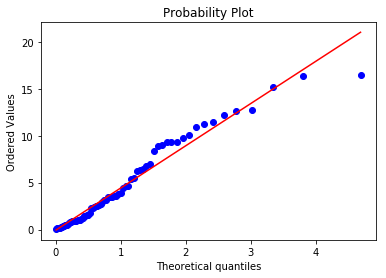



k = -3, size = 8
Number of negative jump times: 45
Mean: 1.395088888888889


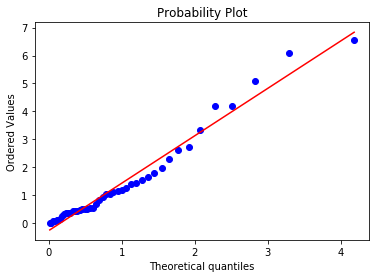



k = -3, size = 9
Number of negative jump times: 31
Mean: 0.9932258064516128


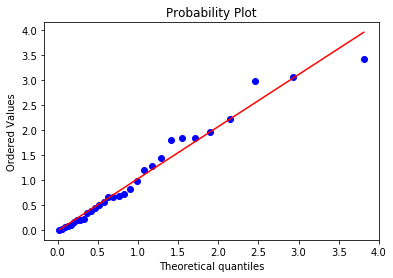



k = -3, size = 10
Number of negative jump times: 18
Mean: 1.6905555555555556


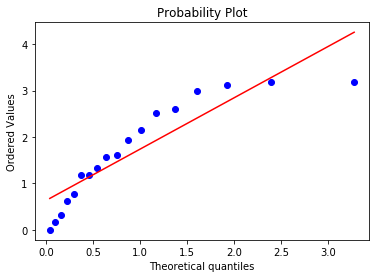



k = -3, size = 11
Number of negative jump times: 4
Mean: 0.44725


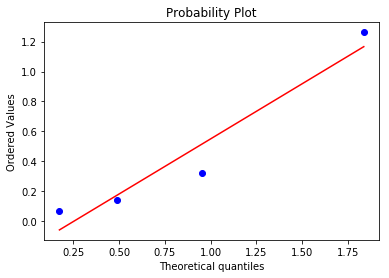



k = -3, size = 12
Number of negative jump times: 3
Mean: 2.1856666666666666


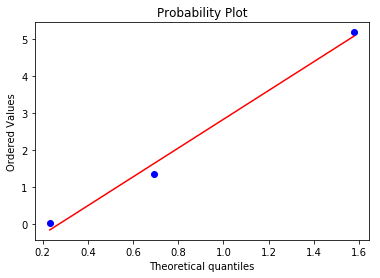



k = -3, size = 13
Number of negative jump times: 3
Mean: 0.13666666666666666


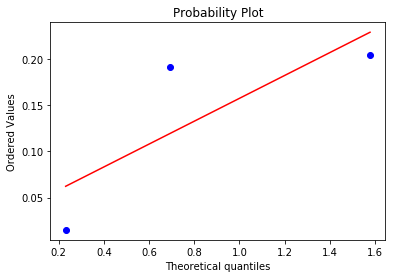



k = -3, size = 14
Number of negative jump times: 3
Mean: 1.6659999999999997


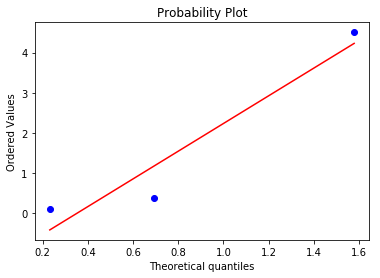



k = -3, size = 15
Number of negative jump times: 5
Mean: 0.6620000000000001


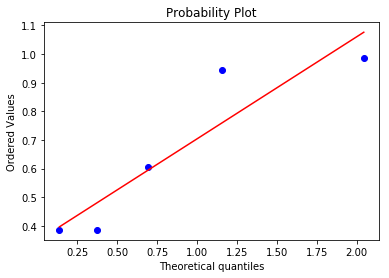



k = -3, size = 16
Number of negative jump times: 4
Mean: 0.61175


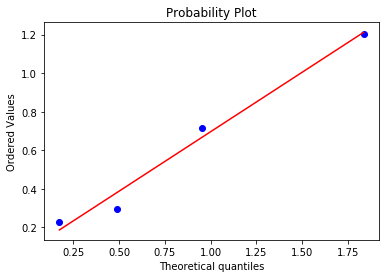



k = -3, size = 17
Number of negative jump times: 29
Mean: 2.094896551724138


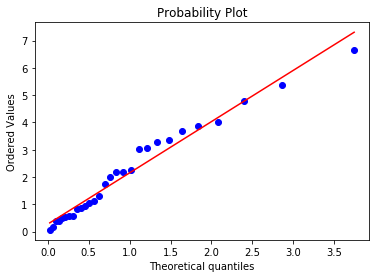



k = -3, size = 18
Number of negative jump times: 47
Mean: 3.6800851063829794


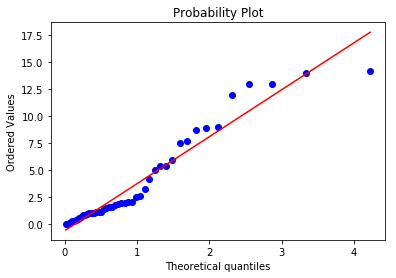



k = -3, size = 19
Number of negative jump times: 70
Mean: 2.8839285714285716


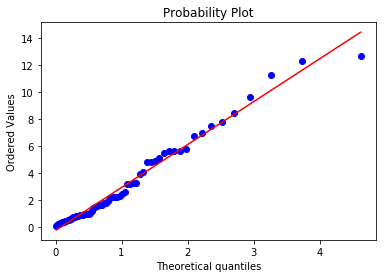



k = -3, size = 20
Number of negative jump times: 3
Mean: 14.038333333333334


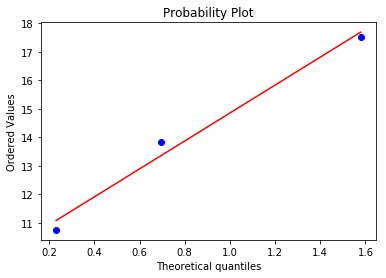



k = -3, size = 21
Number of negative jump times: 0
Mean: nan


k = -3, size = 22
Number of negative jump times: 9
Mean: 2.3349999999999995


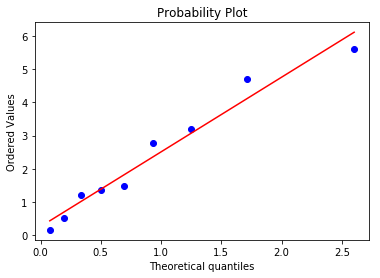



k = -3, size = 23
Number of negative jump times: 1
Mean: 1.509


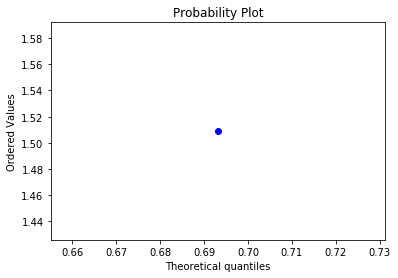



k = -3, size = 24
Number of negative jump times: 19
Mean: 5.363368421052632


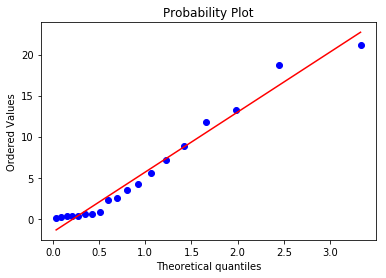



k = -3, size = 25
Number of negative jump times: 6
Mean: 2.5265


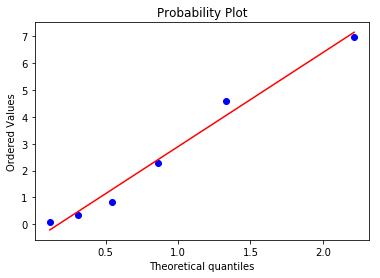



k = -3, size = 26
Number of negative jump times: 2
Mean: 4.8895


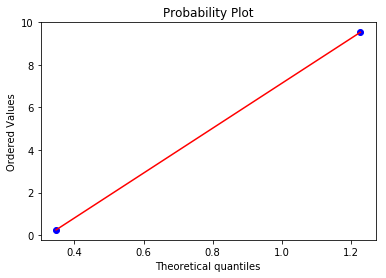



k = -2, size = 1
Number of negative jump times: 434
Mean: 0.8866797235023041


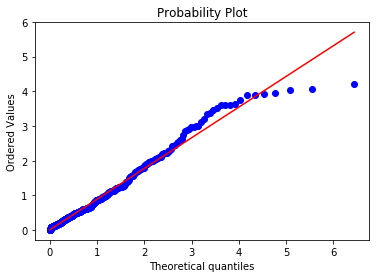



k = -2, size = 2
Number of negative jump times: 166
Mean: 1.243168674698795


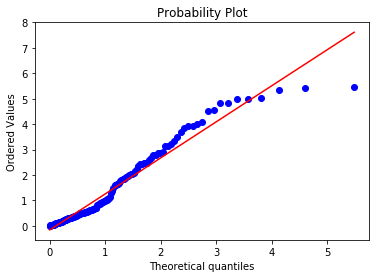



k = -2, size = 3
Number of negative jump times: 156
Mean: 1.040602564102564


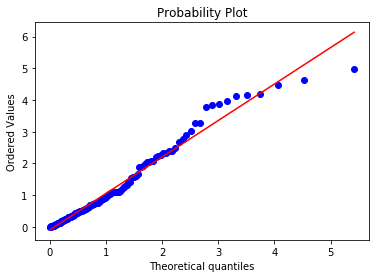



k = -2, size = 4
Number of negative jump times: 151
Mean: 2.566490066225166


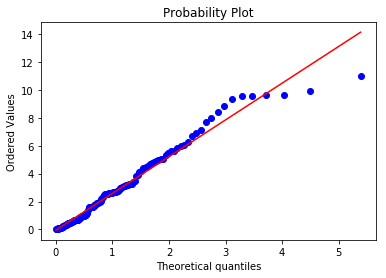



k = -2, size = 5
Number of negative jump times: 105
Mean: 2.8746857142857145


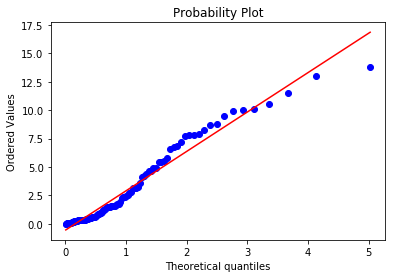



k = -2, size = 6
Number of negative jump times: 81
Mean: 6.3162469135802475


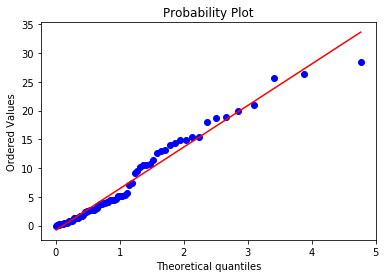



k = -2, size = 7
Number of negative jump times: 80
Mean: 2.170675


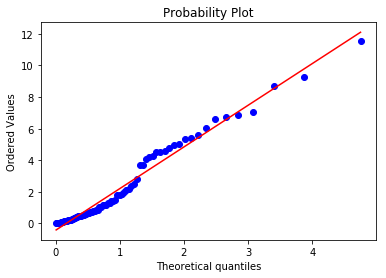



k = -2, size = 8
Number of negative jump times: 50
Mean: 0.95954


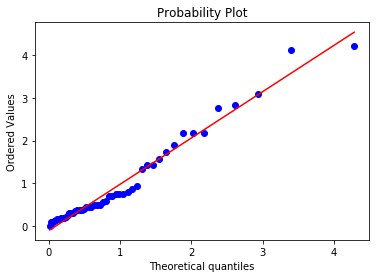



k = -2, size = 9
Number of negative jump times: 21
Mean: 0.4152380952380952


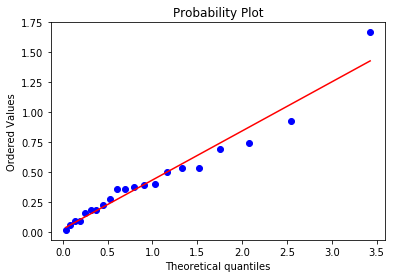



k = -2, size = 10
Number of negative jump times: 3
Mean: 1.0396666666666667


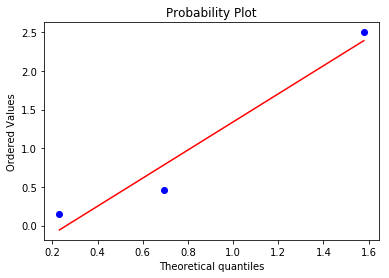



k = -2, size = 11
Number of negative jump times: 1
Mean: 0.211


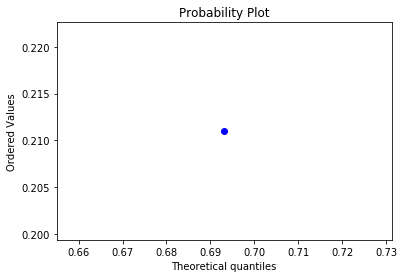



k = -2, size = 12
Number of negative jump times: 0
Mean: nan


k = -2, size = 13
Number of negative jump times: 0
Mean: nan


k = -2, size = 14
Number of negative jump times: 9
Mean: 6.727


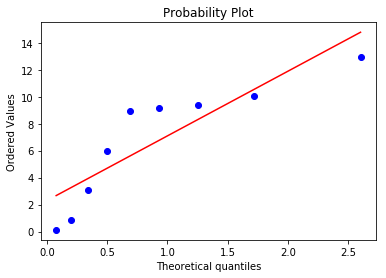



k = -2, size = 15
Number of negative jump times: 97
Mean: 2.526422680412371


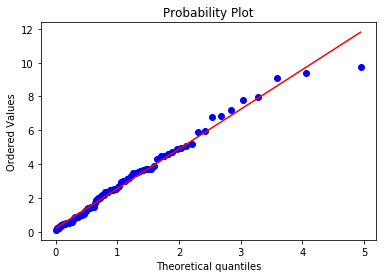



k = -2, size = 16
Number of negative jump times: 68
Mean: 4.521852941176469


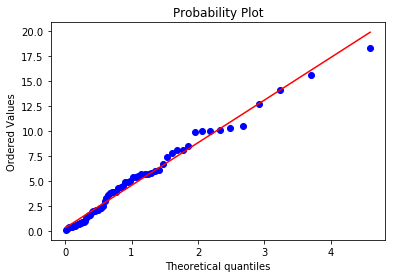



k = -2, size = 17
Number of negative jump times: 42
Mean: 3.5785476190476198


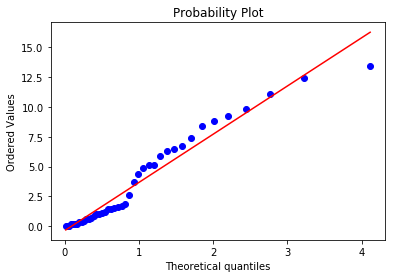



k = -2, size = 18
Number of negative jump times: 25
Mean: 4.55112


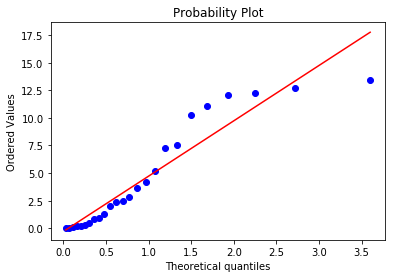



k = -2, size = 19
Number of negative jump times: 19
Mean: 5.242421052631579


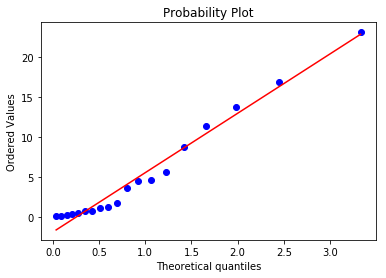



k = -2, size = 20
Number of negative jump times: 3
Mean: 1.9649999999999999


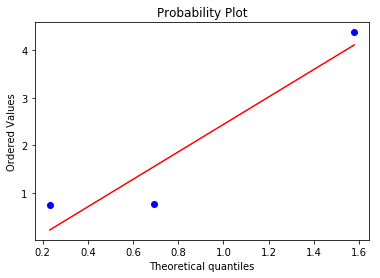



k = -2, size = 21
Number of negative jump times: 43
Mean: 0.3895813953488372


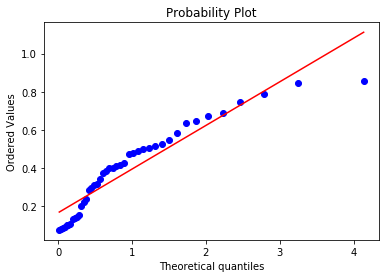



k = -1, size = 1
Number of negative jump times: 271
Mean: 2.6291328413284134


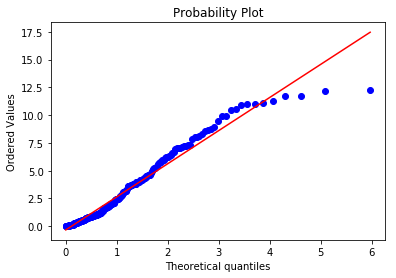



k = -1, size = 2
Number of negative jump times: 231
Mean: 2.86458154978355


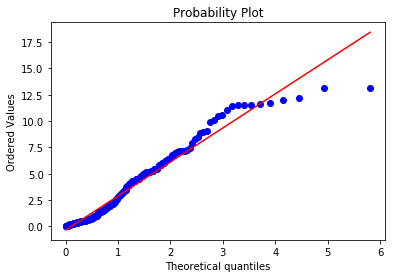



k = -1, size = 3
Number of negative jump times: 314
Mean: 0.5454777070063694


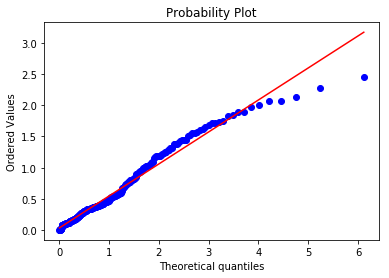



k = -1, size = 4
Number of negative jump times: 165
Mean: 1.5014848484848484


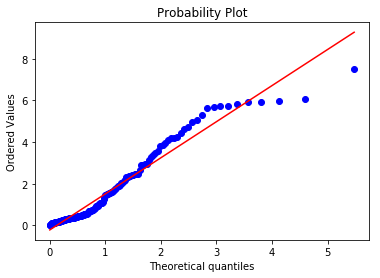



k = -1, size = 5
Number of negative jump times: 205
Mean: 1.8330439024390244


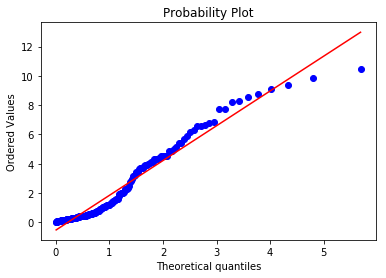



k = -1, size = 6
Number of negative jump times: 81
Mean: 1.5723827160493826


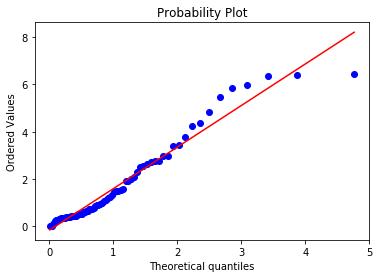



k = -1, size = 7
Number of negative jump times: 106
Mean: 1.6301415094339622


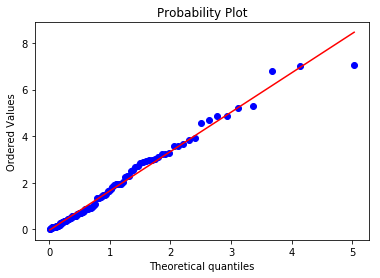



k = -1, size = 8
Number of negative jump times: 55
Mean: 2.5945454545454543


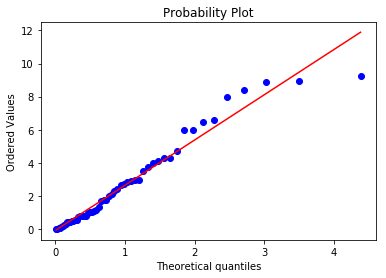



k = -1, size = 9
Number of negative jump times: 37
Mean: 0.6471081081081081


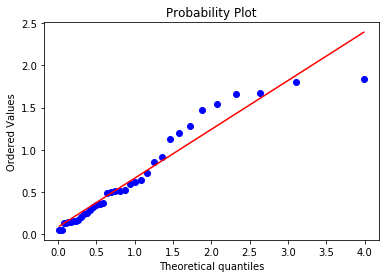



k = -1, size = 10
Number of negative jump times: 23
Mean: 2.8786521739130437


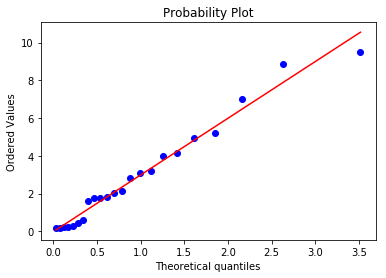



k = -1, size = 11
Number of negative jump times: 7
Mean: 3.0991428571428576


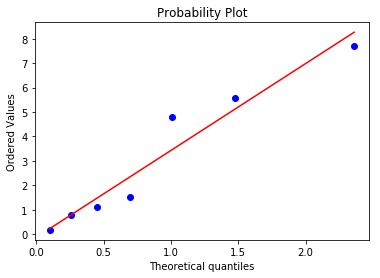



k = -1, size = 12
Number of negative jump times: 5
Mean: 1.342


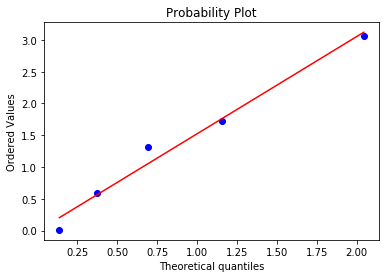



k = -1, size = 13
Number of negative jump times: 2
Mean: 0.751


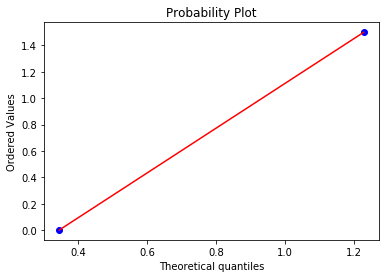



k = -1, size = 14
Number of negative jump times: 0
Mean: nan


k = -1, size = 15
Number of negative jump times: 0
Mean: nan


k = -1, size = 16
Number of negative jump times: 0
Mean: nan


k = -1, size = 17
Number of negative jump times: 4
Mean: 0.704


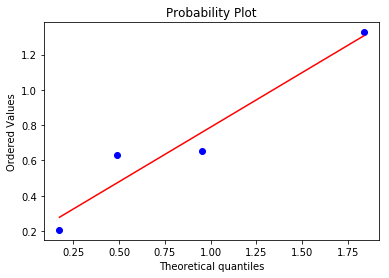



k = -1, size = 18
Number of negative jump times: 12
Mean: 2.5829999999999997


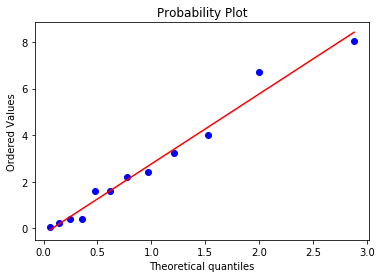



k = -1, size = 19
Number of negative jump times: 58
Mean: 3.354206896551724


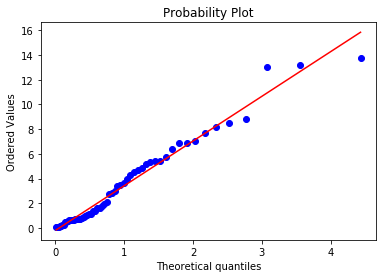



k = -1, size = 20
Number of negative jump times: 17
Mean: 3.600764705882353


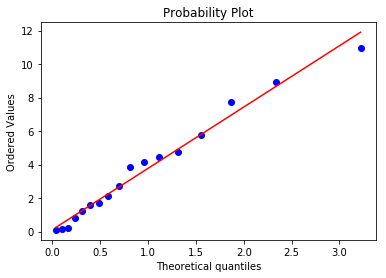



k = -1, size = 21
Number of negative jump times: 13
Mean: 2.8257692307692306


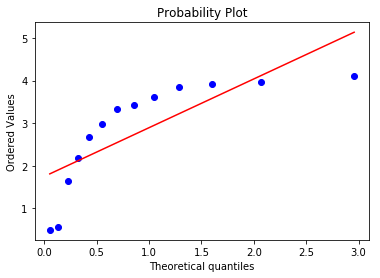



k = -1, size = 22
Number of negative jump times: 24
Mean: 3.9583749999999998


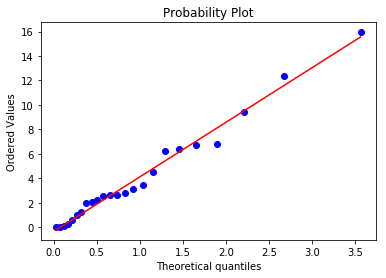



k = -1, size = 23
Number of negative jump times: 42
Mean: 1.8084761904761908


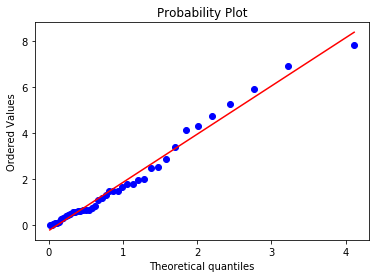



k = -1, size = 24
Number of negative jump times: 31
Mean: 1.875935483870968


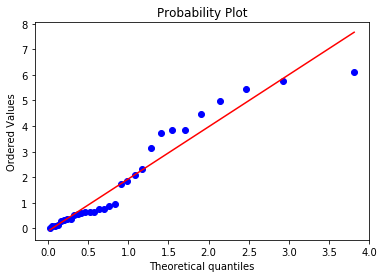



k = -1, size = 25
Number of negative jump times: 0
Mean: nan


k = -1, size = 26
Number of negative jump times: 1
Mean: 0.384


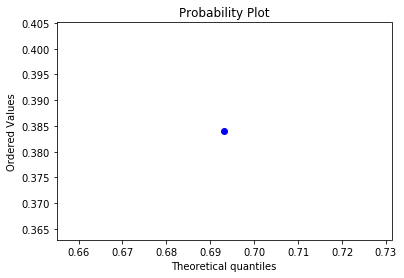



k = 1, size = 1
Number of negative jump times: 189
Mean: 3.3444232804232805


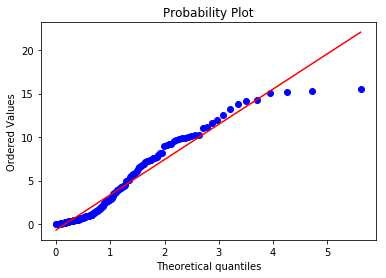



k = 1, size = 2
Number of negative jump times: 49
Mean: 2.007857142857143


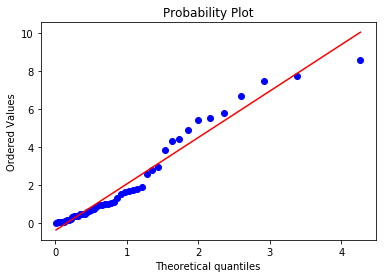



k = 1, size = 3
Number of negative jump times: 55
Mean: 1.9656545454545455


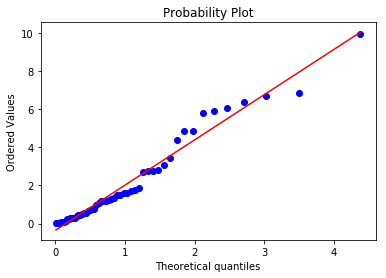



k = 1, size = 4
Number of negative jump times: 72
Mean: 2.2665555555555557


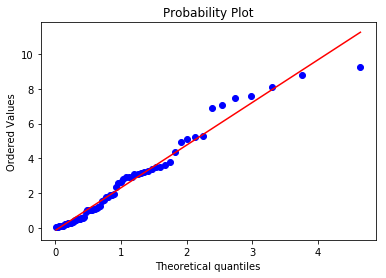



k = 1, size = 5
Number of negative jump times: 48
Mean: 1.2572083333333335


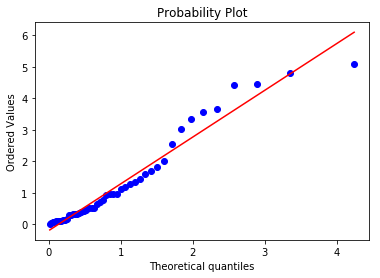



k = 1, size = 6
Number of negative jump times: 32
Mean: 1.6789375


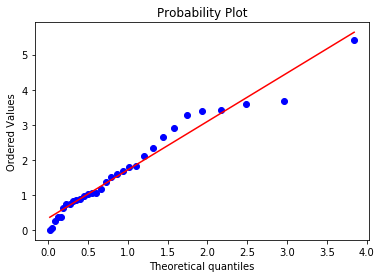



k = 1, size = 7
Number of negative jump times: 27
Mean: 3.0126296296296293


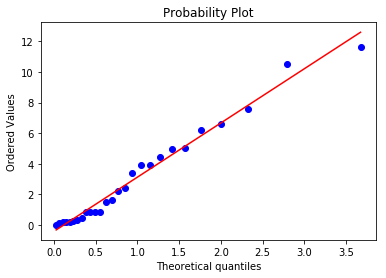



k = 1, size = 8
Number of negative jump times: 26
Mean: 2.1502692307692306


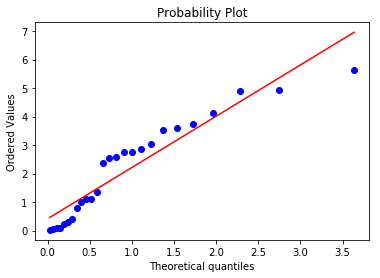



k = 1, size = 9
Number of negative jump times: 20
Mean: 2.2774000000000005


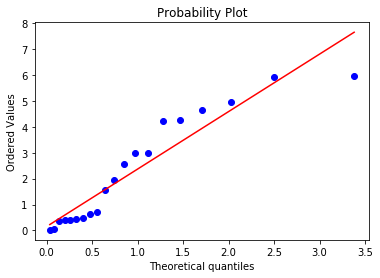



k = 1, size = 10
Number of negative jump times: 7
Mean: 10.472857142857142


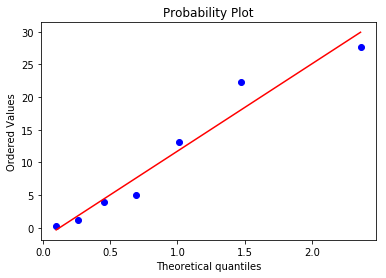



k = 1, size = 11
Number of negative jump times: 13
Mean: 2.665153846153846


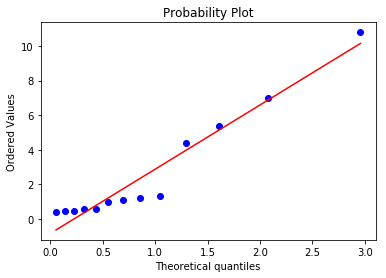



k = 1, size = 12
Number of negative jump times: 1
Mean: 0.085


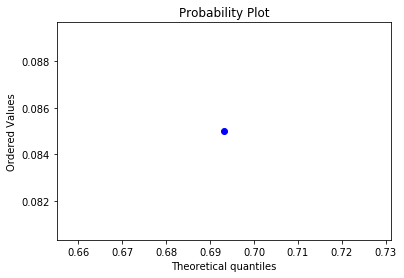



k = 1, size = 13
Number of negative jump times: 0
Mean: nan


k = 1, size = 14
Number of negative jump times: 0
Mean: nan


k = 1, size = 15
Number of negative jump times: 0
Mean: nan


k = 1, size = 16
Number of negative jump times: 1
Mean: 9.901


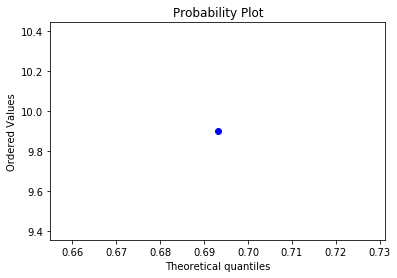



k = 1, size = 17
Number of negative jump times: 0
Mean: nan


k = 1, size = 18
Number of negative jump times: 19
Mean: 0.7750526315789474


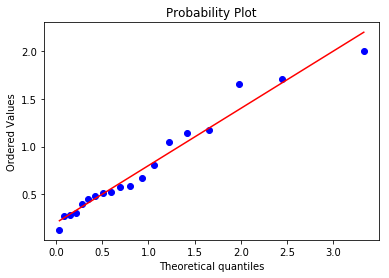



k = 1, size = 19
Number of negative jump times: 0
Mean: nan


k = 1, size = 20
Number of negative jump times: 7
Mean: 1.4332857142857145


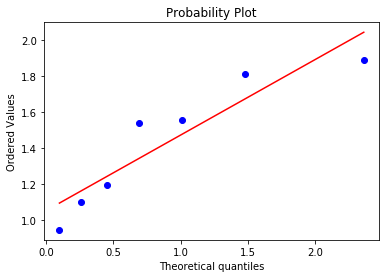



k = 1, size = 21
Number of negative jump times: 0
Mean: nan


k = 1, size = 22
Number of negative jump times: 1
Mean: 0.535


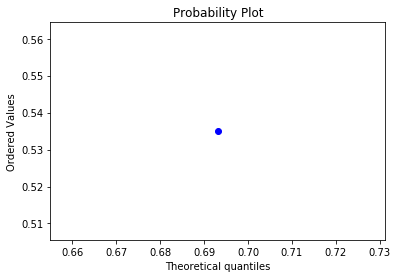



k = 2, size = 1
Number of negative jump times: 236
Mean: 0.9869194915254237


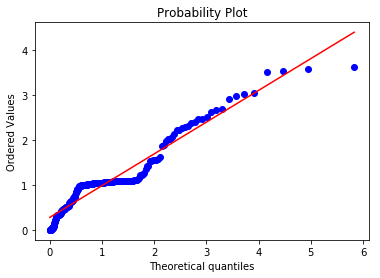



k = 2, size = 2
Number of negative jump times: 249
Mean: 1.0803775100401607


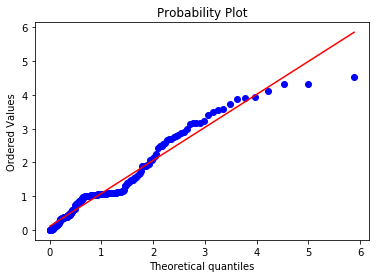



k = 2, size = 3
Number of negative jump times: 284
Mean: 0.8125422535211267


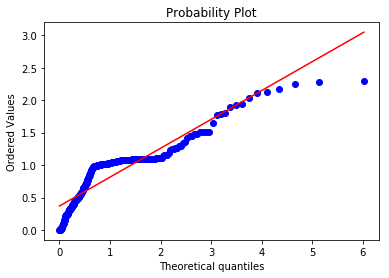



k = 2, size = 4
Number of negative jump times: 214
Mean: 1.7278130841121495


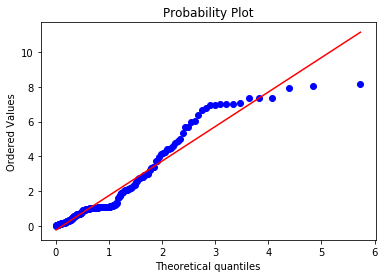



k = 2, size = 5
Number of negative jump times: 227
Mean: 1.1085374449339207


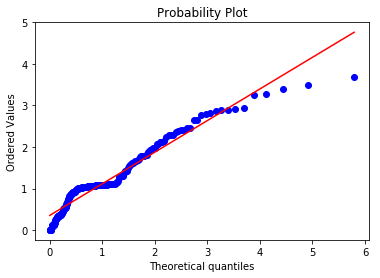



k = 2, size = 6
Number of negative jump times: 73
Mean: 1.4013881917808222


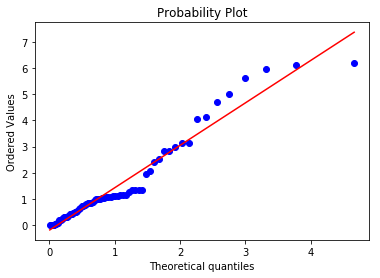



k = 2, size = 7
Number of negative jump times: 37
Mean: 0.749837837837838


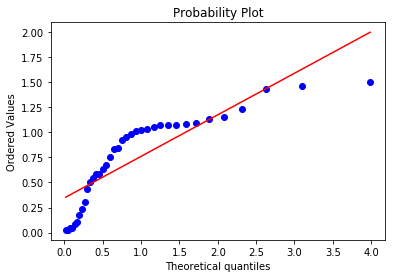



k = 2, size = 8
Number of negative jump times: 11
Mean: 1.7025454545454544


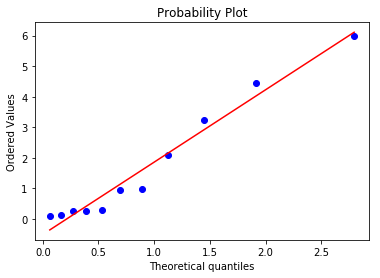



k = 2, size = 9
Number of negative jump times: 7
Mean: 2.6792857142857143


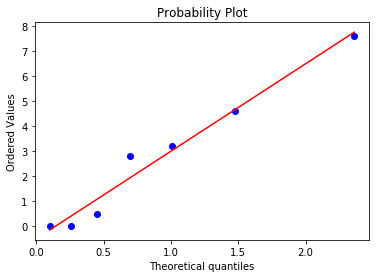



k = 2, size = 10
Number of negative jump times: 6
Mean: 0.4053333333333334


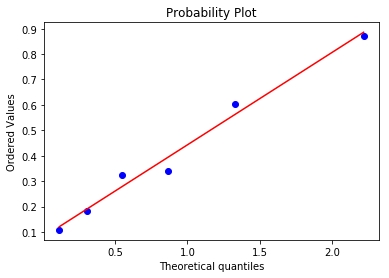



k = 2, size = 11
Number of negative jump times: 9
Mean: 0.8666666666666667


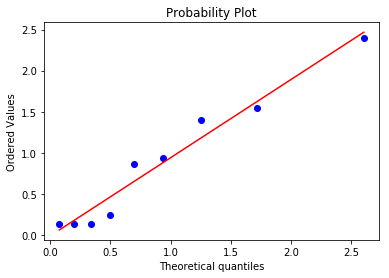



k = 2, size = 12
Number of negative jump times: 0
Mean: nan


k = 2, size = 13
Number of negative jump times: 0
Mean: nan


k = 2, size = 14
Number of negative jump times: 0
Mean: nan


k = 2, size = 15
Number of negative jump times: 0
Mean: nan


k = 2, size = 16
Number of negative jump times: 0
Mean: nan


k = 2, size = 17
Number of negative jump times: 0
Mean: nan


k = 2, size = 18
Number of negative jump times: 0
Mean: nan


k = 2, size = 19
Number of negative jump times: 0
Mean: nan


k = 2, size = 20
Number of negative jump times: 0
Mean: nan


k = 2, size = 21
Number of negative jump times: 0
Mean: nan


k = 2, size = 22
Number of negative jump times: 0
Mean: nan


k = 2, size = 23
Number of negative jump times: 7
Mean: 4.366714285714285


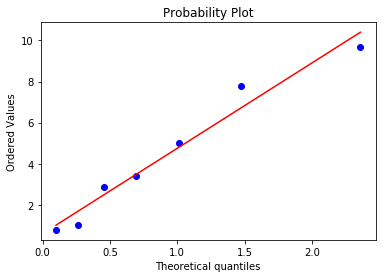



k = 3, size = 1
Number of negative jump times: 136
Mean: 1.4068382352941176


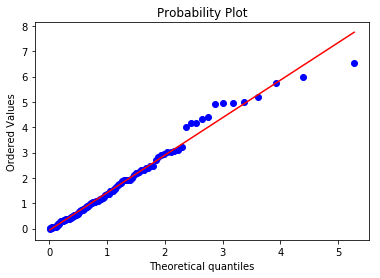



k = 3, size = 2
Number of negative jump times: 210
Mean: 2.441004761904762


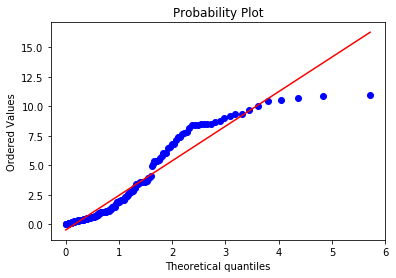



k = 3, size = 3
Number of negative jump times: 192
Mean: 2.7110468749999996


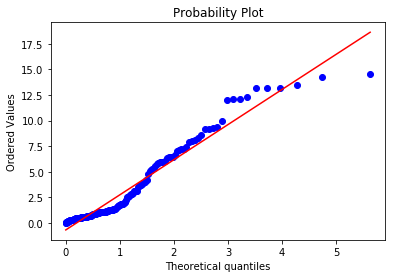



k = 3, size = 4
Number of negative jump times: 281
Mean: 2.372829181494662


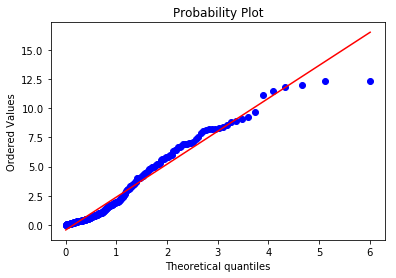



k = 3, size = 5
Number of negative jump times: 146
Mean: 2.111513698630137


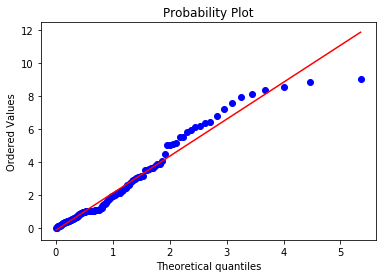



k = 3, size = 6
Number of negative jump times: 83
Mean: 1.5052530120481926


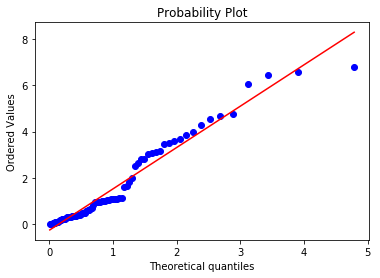



k = 3, size = 7
Number of negative jump times: 41
Mean: 4.849121951219512


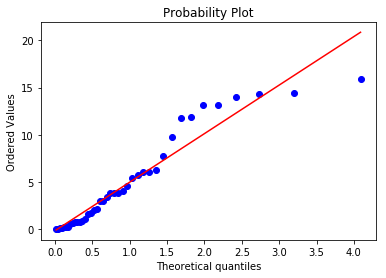



k = 3, size = 8
Number of negative jump times: 11
Mean: 1.7587272727272727


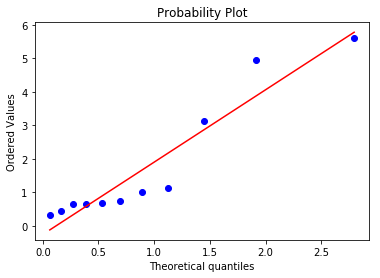



k = 3, size = 9
Number of negative jump times: 5
Mean: 2.3776


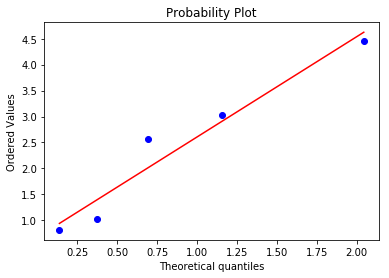



k = 3, size = 10
Number of negative jump times: 0
Mean: nan


k = 3, size = 11
Number of negative jump times: 0
Mean: nan


k = 3, size = 12
Number of negative jump times: 0
Mean: nan


k = 3, size = 13
Number of negative jump times: 0
Mean: nan


k = 3, size = 14
Number of negative jump times: 0
Mean: nan


k = 3, size = 15
Number of negative jump times: 3
Mean: 24.810999999999996


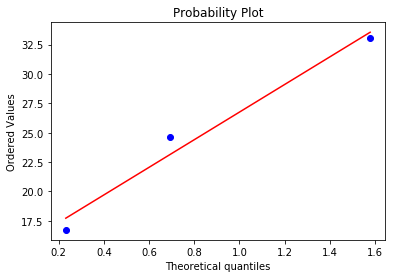



k = 3, size = 16
Number of negative jump times: 32
Mean: 4.5169999999999995


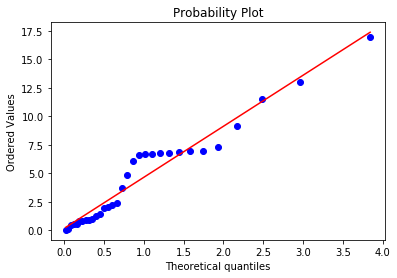



k = 3, size = 17
Number of negative jump times: 15
Mean: 3.1019999999999994


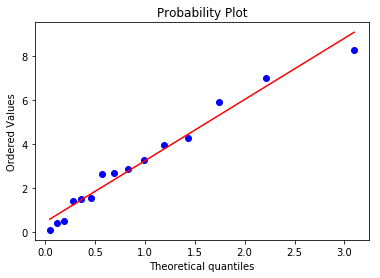



k = 3, size = 18
Number of negative jump times: 20
Mean: 5.0605169000000005


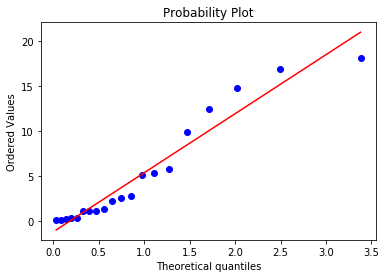



k = 3, size = 19
Number of negative jump times: 2
Mean: 29.5995


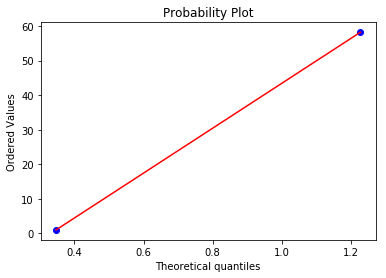



k = 4, size = 1
Number of negative jump times: 245
Mean: 0.7763836734693877


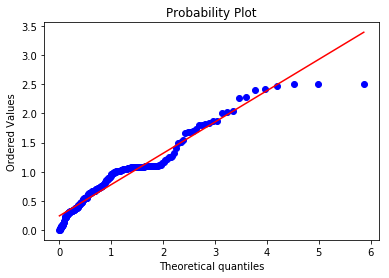



k = 4, size = 2
Number of negative jump times: 147
Mean: 1.2596530612244896


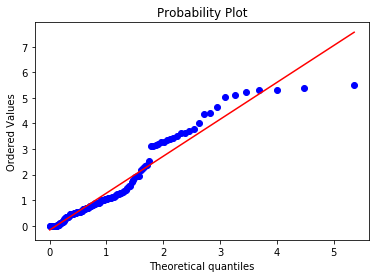



k = 4, size = 3
Number of negative jump times: 357
Mean: 0.8740112044817927


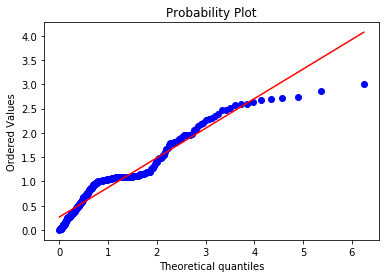



k = 4, size = 4
Number of negative jump times: 323
Mean: 1.1476346749226005


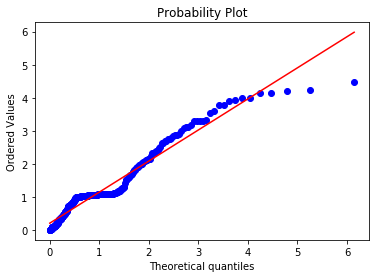



k = 4, size = 5
Number of negative jump times: 669
Mean: 0.8369237668161436


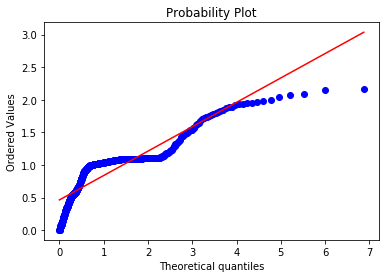



k = 4, size = 6
Number of negative jump times: 247
Mean: 1.0323481781376518


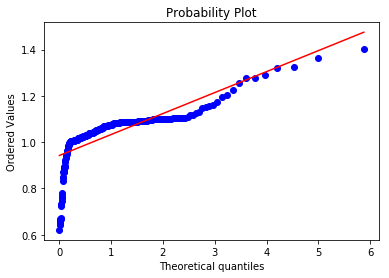



k = 4, size = 7
Number of negative jump times: 141
Mean: 0.8074751773049645


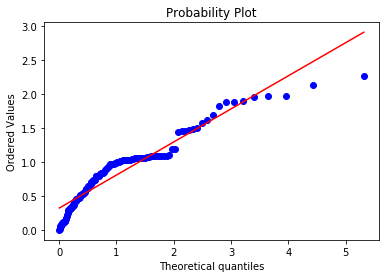



k = 4, size = 8
Number of negative jump times: 28
Mean: 1.1517857142857142


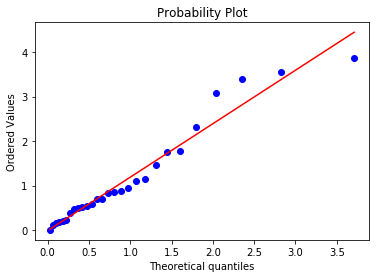



k = 4, size = 9
Number of negative jump times: 28
Mean: 4.419535714285714


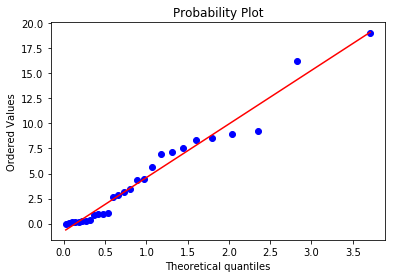



k = 4, size = 10
Number of negative jump times: 2
Mean: 0.5035000000000001


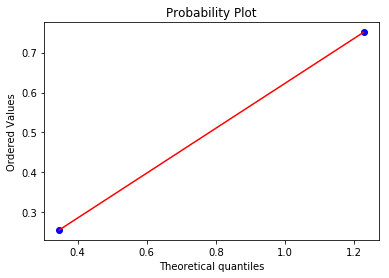



k = 4, size = 11
Number of negative jump times: 0
Mean: nan


k = 4, size = 12
Number of negative jump times: 0
Mean: nan


k = 4, size = 13
Number of negative jump times: 0
Mean: nan


k = 4, size = 14
Number of negative jump times: 0
Mean: nan


k = 4, size = 15
Number of negative jump times: 0
Mean: nan


k = 4, size = 16
Number of negative jump times: 0
Mean: nan


k = 4, size = 17
Number of negative jump times: 0
Mean: nan


k = 4, size = 18
Number of negative jump times: 2
Mean: 333.605


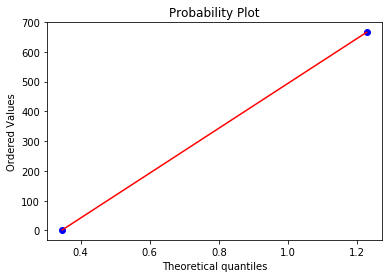



k = 4, size = 19
Number of negative jump times: 0
Mean: nan


k = 4, size = 20
Number of negative jump times: 18
Mean: 3.756166666666667


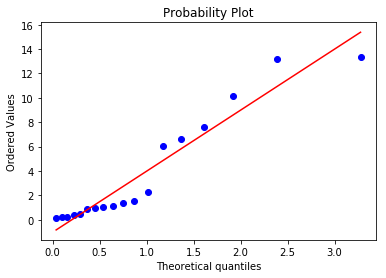



k = 4, size = 21
Number of negative jump times: 6
Mean: 0.3348333333333333


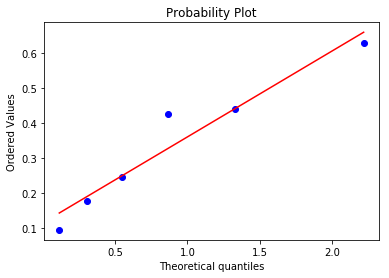



k = 4, size = 22
Number of negative jump times: 1
Mean: 0.398


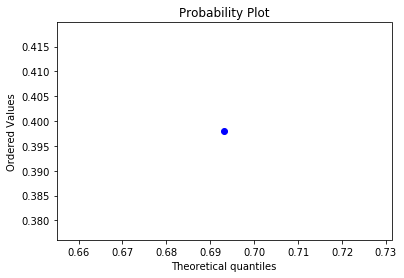



k = 5, size = 1
Number of negative jump times: 307
Mean: 0.7493517915309447


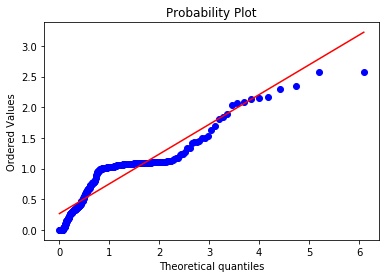



k = 5, size = 2
Number of negative jump times: 136
Mean: 1.8828897058823528


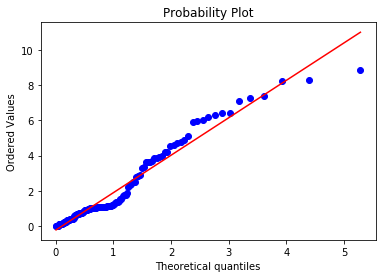



k = 5, size = 3
Number of negative jump times: 600
Mean: 0.7610933333333333


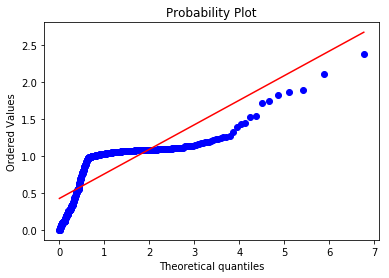



k = 5, size = 4
Number of negative jump times: 196
Mean: 2.4215255102040816


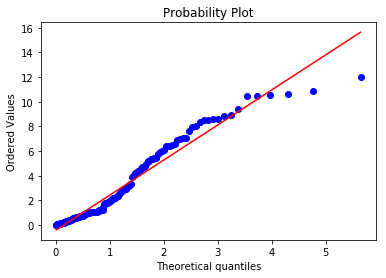



k = 5, size = 5
Number of negative jump times: 182
Mean: 1.6000714285714284


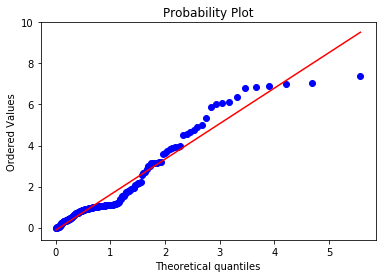



k = 5, size = 6
Number of negative jump times: 213
Mean: 2.051957746478873


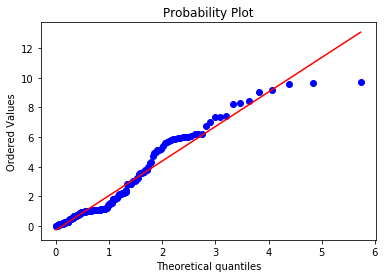



k = 5, size = 7
Number of negative jump times: 56
Mean: 1.5378214285714285


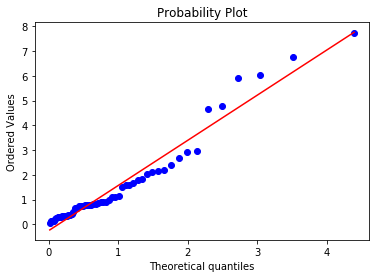



k = 5, size = 8
Number of negative jump times: 75
Mean: 1.7321733333333331


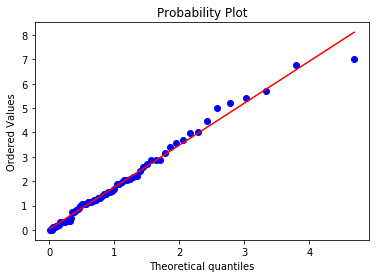



k = 5, size = 9
Number of negative jump times: 19
Mean: 3.3013157894736844


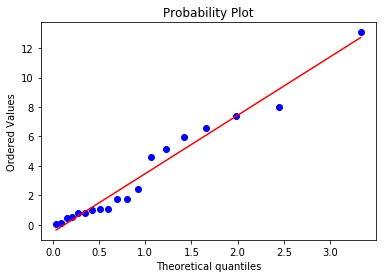



k = 5, size = 10
Number of negative jump times: 1
Mean: 7.487


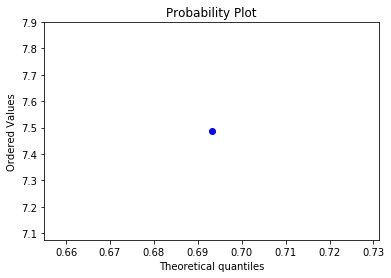



k = 5, size = 11
Number of negative jump times: 11
Mean: 2.0124545454545455


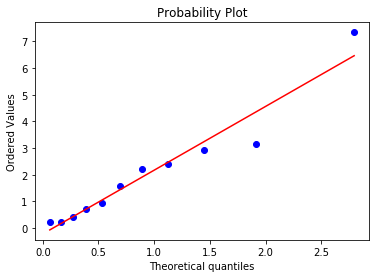



k = 5, size = 12
Number of negative jump times: 0
Mean: nan


k = 5, size = 13
Number of negative jump times: 0
Mean: nan


k = 5, size = 14
Number of negative jump times: 0
Mean: nan


k = 5, size = 15
Number of negative jump times: 0
Mean: nan


k = 5, size = 16
Number of negative jump times: 0
Mean: nan


k = 5, size = 17
Number of negative jump times: 0
Mean: nan


k = 5, size = 18
Number of negative jump times: 2
Mean: 2.5255


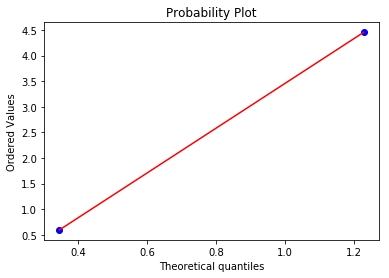



k = 5, size = 19
Number of negative jump times: 3
Mean: 144.37466666666666


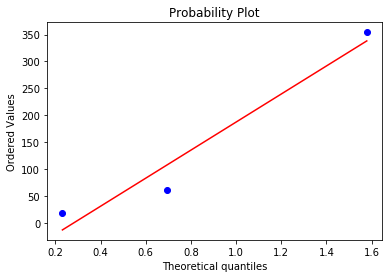



k = 5, size = 20
Number of negative jump times: 20
Mean: 3.77395


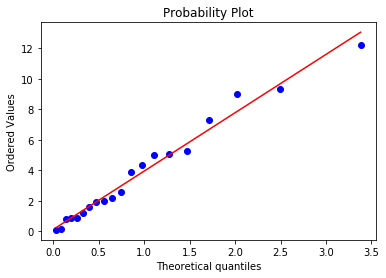



k = 5, size = 21
Number of negative jump times: 78
Mean: 2.4039743589743594


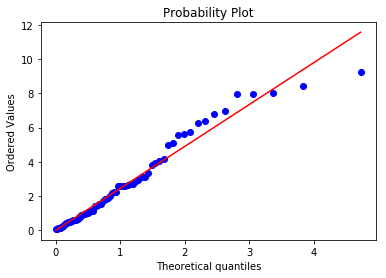



k = 5, size = 22
Number of negative jump times: 84
Mean: 5.201357142857143


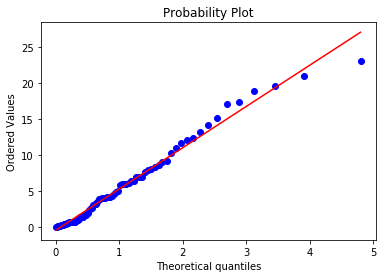



k = 5, size = 23
Number of negative jump times: 33
Mean: 4.604787878787879


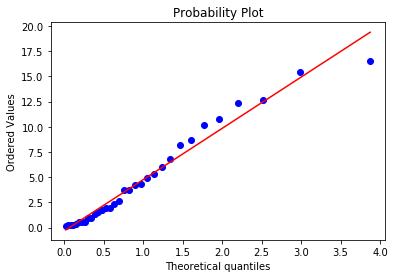



k = 5, size = 24
Number of negative jump times: 5
Mean: 6.011999999999999


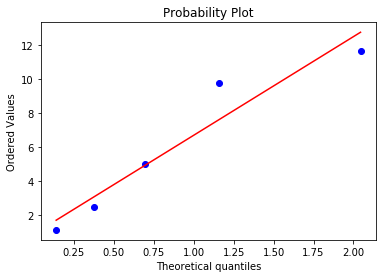



k = 5, size = 25
Number of negative jump times: 1
Mean: 0.929


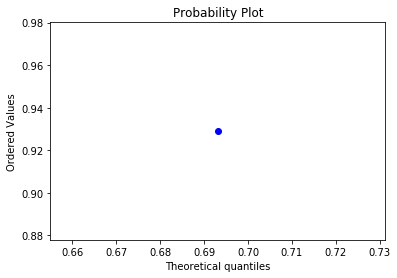



k = 6, size = 1
Number of negative jump times: 245
Mean: 2.541518367346939


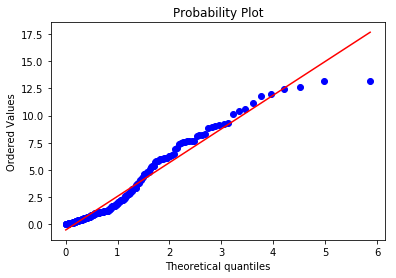



k = 6, size = 2
Number of negative jump times: 255
Mean: 1.4280039215686273


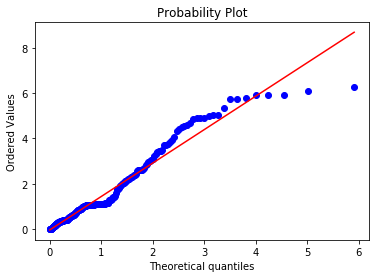



k = 6, size = 3
Number of negative jump times: 243
Mean: 1.1669506172839508


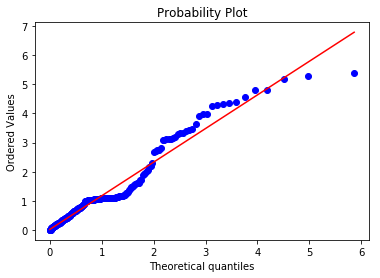



k = 6, size = 4
Number of negative jump times: 346
Mean: 0.9790346820809248


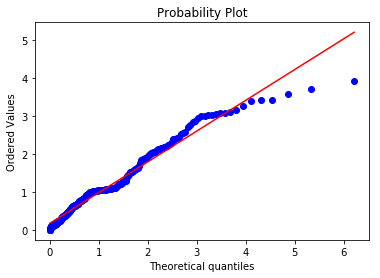



k = 6, size = 5
Number of negative jump times: 313
Mean: 0.9213354632587859


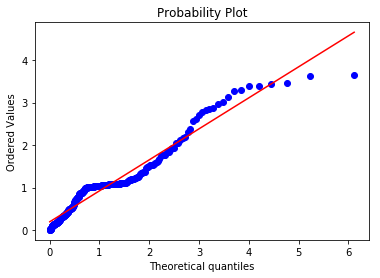



k = 6, size = 6
Number of negative jump times: 237
Mean: 0.8583459915611814


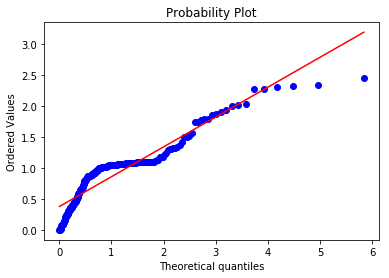



k = 6, size = 7
Number of negative jump times: 214
Mean: 0.8914953271028038


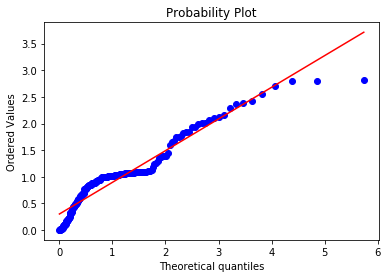



k = 6, size = 8
Number of negative jump times: 48
Mean: 1.29125


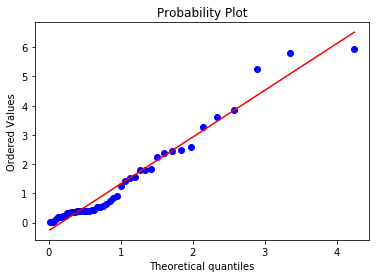



k = 6, size = 9
Number of negative jump times: 23
Mean: 3.1711739130434786


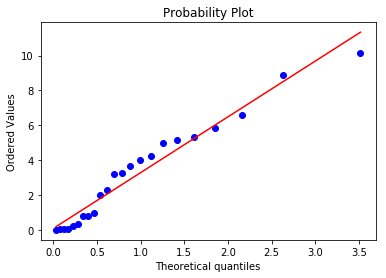



k = 6, size = 10
Number of negative jump times: 2
Mean: 1.7435


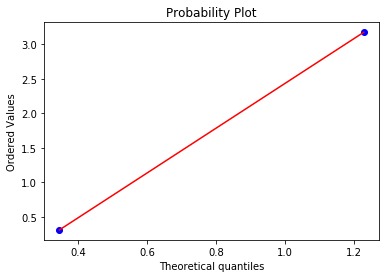



k = 6, size = 11
Number of negative jump times: 0
Mean: nan


k = 6, size = 12
Number of negative jump times: 0
Mean: nan


k = 6, size = 13
Number of negative jump times: 0
Mean: nan


k = 6, size = 14
Number of negative jump times: 0
Mean: nan


k = 6, size = 15
Number of negative jump times: 0
Mean: nan


k = 6, size = 16
Number of negative jump times: 0
Mean: nan


k = 6, size = 17
Number of negative jump times: 6
Mean: 7.623333333333334


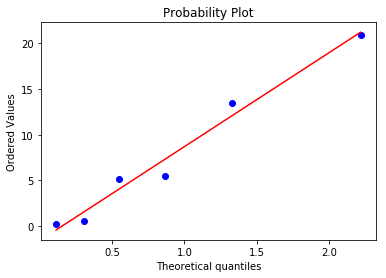



k = 6, size = 18
Number of negative jump times: 42
Mean: 2.4598333333333335


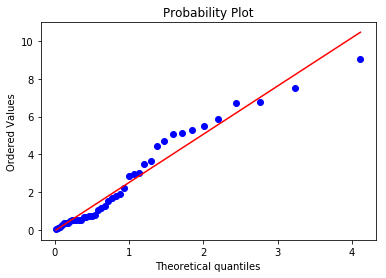



k = 6, size = 19
Number of negative jump times: 29
Mean: 4.423793103448276


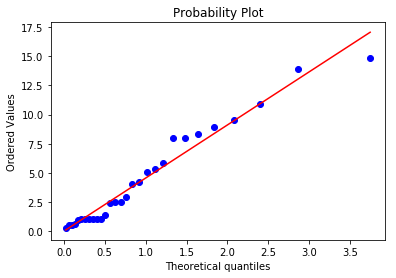



k = 6, size = 20
Number of negative jump times: 9
Mean: 2.681333333333333


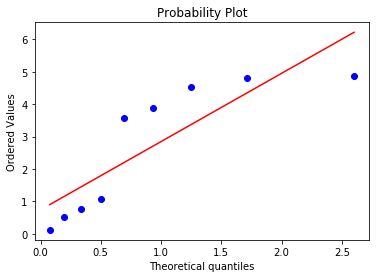



k = 7, size = 1
Number of negative jump times: 374
Mean: 2.125374331550802


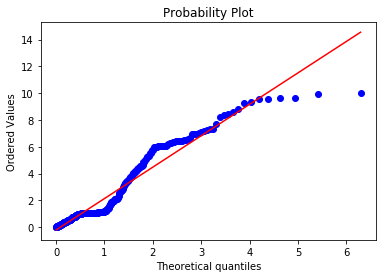



k = 7, size = 2
Number of negative jump times: 310
Mean: 0.8220419354838712


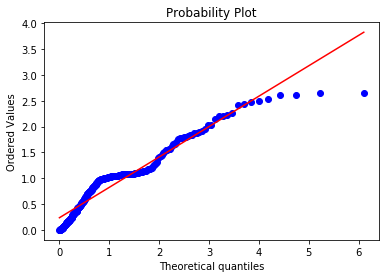



k = 7, size = 3
Number of negative jump times: 438
Mean: 0.8435388127853882


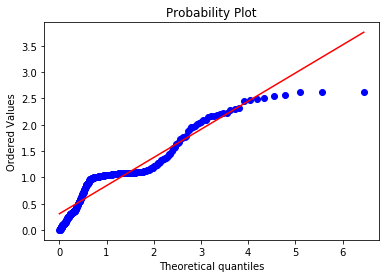



k = 7, size = 4
Number of negative jump times: 287
Mean: 1.5522299651567943


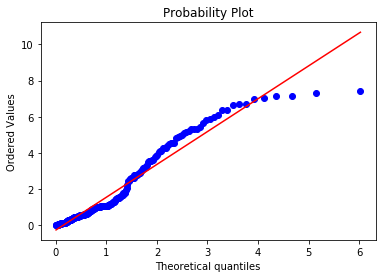



k = 7, size = 5
Number of negative jump times: 269
Mean: 1.6632899628252789


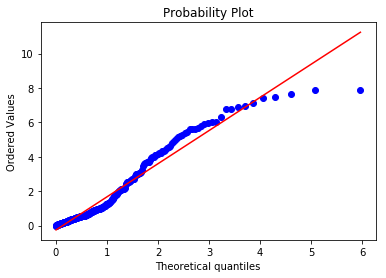



k = 7, size = 6
Number of negative jump times: 154
Mean: 1.4870454545454546


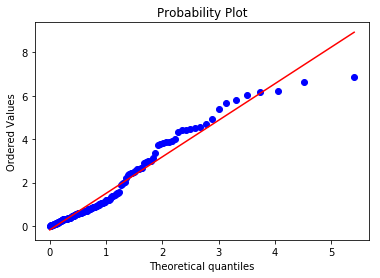



k = 7, size = 7
Number of negative jump times: 145
Mean: 1.5793931034482758


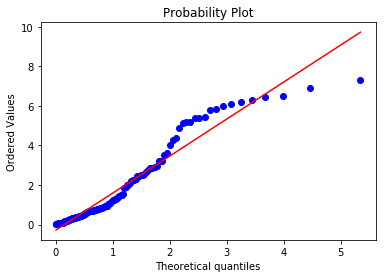



k = 7, size = 8
Number of negative jump times: 51
Mean: 1.979372549019608


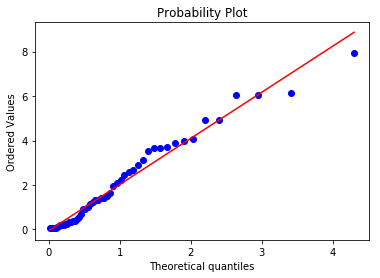



k = 7, size = 9
Number of negative jump times: 49
Mean: 0.5231020408163266


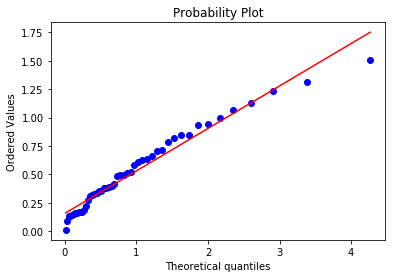



k = 7, size = 10
Number of negative jump times: 0
Mean: nan


k = 7, size = 11
Number of negative jump times: 0
Mean: nan


k = 7, size = 12
Number of negative jump times: 0
Mean: nan


k = 7, size = 13
Number of negative jump times: 0
Mean: nan


k = 7, size = 14
Number of negative jump times: 0
Mean: nan


k = 7, size = 15
Number of negative jump times: 0
Mean: nan


k = 7, size = 16
Number of negative jump times: 6
Mean: 26.027500000000003


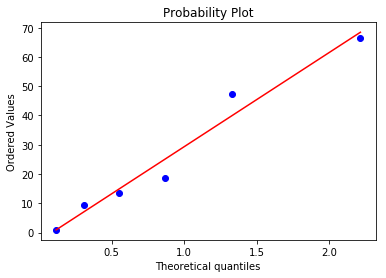



k = 7, size = 17
Number of negative jump times: 36
Mean: 1.1002777777777777


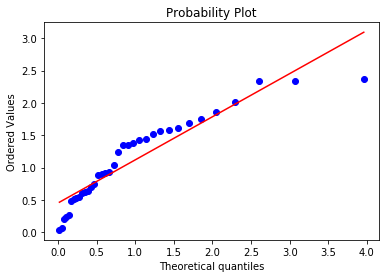



k = 7, size = 18
Number of negative jump times: 44
Mean: 3.383636363636364


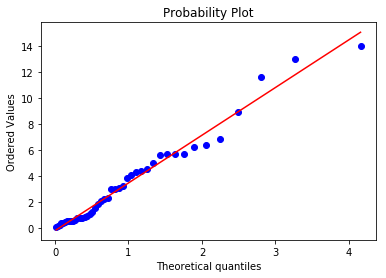



k = 7, size = 19
Number of negative jump times: 64
Mean: 8.9685625


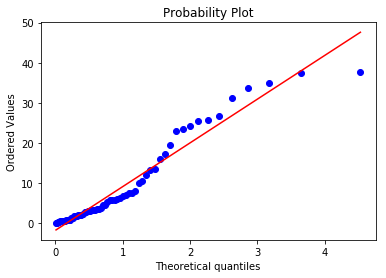



k = 7, size = 20
Number of negative jump times: 10
Mean: 15.112


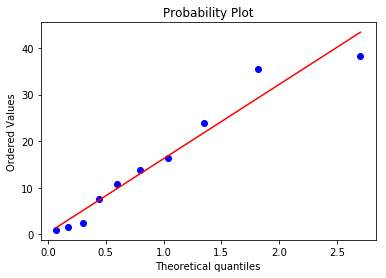



k = 8, size = 1
Number of negative jump times: 218
Mean: 0.7411743119266053


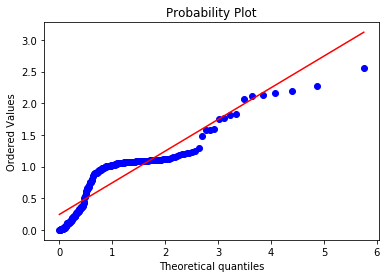



k = 8, size = 2
Number of negative jump times: 315
Mean: 1.3076158730158731


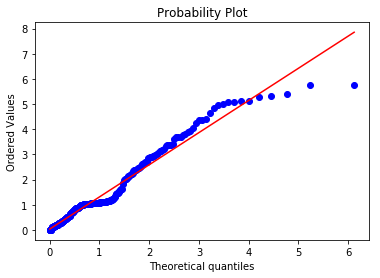



k = 8, size = 3
Number of negative jump times: 309
Mean: 0.8148511326860841


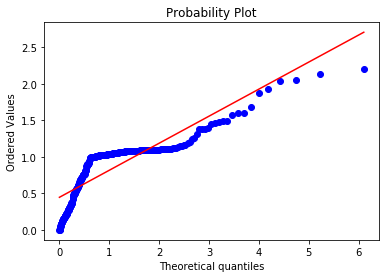



k = 8, size = 4
Number of negative jump times: 564
Mean: 0.8192695035460994


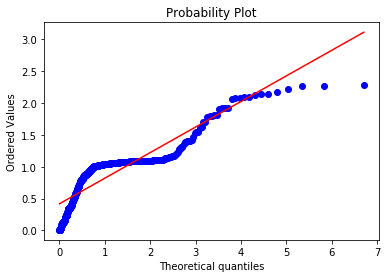



k = 8, size = 5
Number of negative jump times: 561
Mean: 0.814524064171123


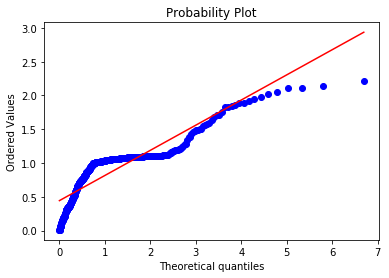



k = 8, size = 6
Number of negative jump times: 560
Mean: 0.8072714285714285


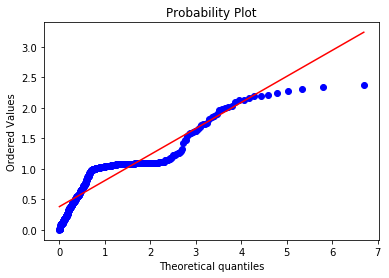



k = 8, size = 7
Number of negative jump times: 368
Mean: 0.7732336956521738


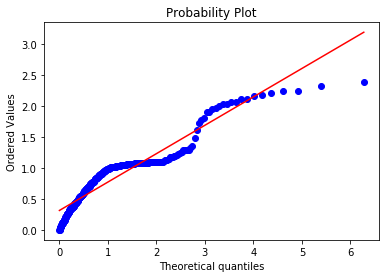



k = 8, size = 8
Number of negative jump times: 83
Mean: 0.800421686746988


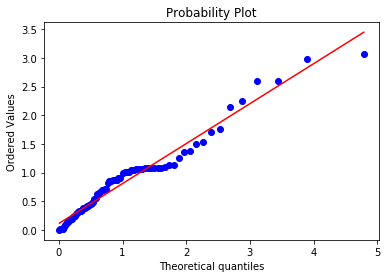



k = 8, size = 9
Number of negative jump times: 11
Mean: 0.6921818181818181


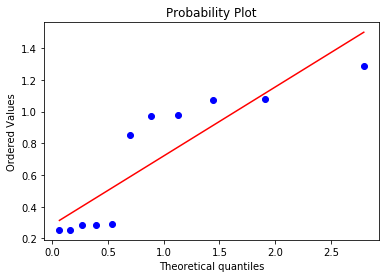



k = 8, size = 10
Number of negative jump times: 7
Mean: 0.23942857142857138


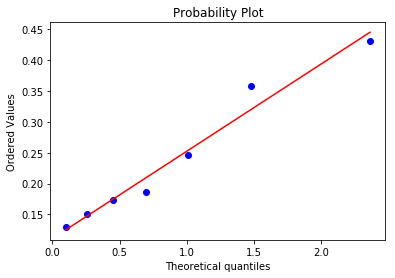



k = 8, size = 11
Number of negative jump times: 0
Mean: nan


k = 8, size = 12
Number of negative jump times: 0
Mean: nan


k = 8, size = 13
Number of negative jump times: 0
Mean: nan


k = 8, size = 14
Number of negative jump times: 0
Mean: nan


k = 8, size = 15
Number of negative jump times: 0
Mean: nan


k = 8, size = 16
Number of negative jump times: 0
Mean: nan


k = 8, size = 17
Number of negative jump times: 0
Mean: nan


k = 8, size = 18
Number of negative jump times: 0
Mean: nan


k = 8, size = 19
Number of negative jump times: 0
Mean: nan


k = 8, size = 20
Number of negative jump times: 0
Mean: nan


k = 8, size = 21
Number of negative jump times: 7
Mean: 43.84071428571429


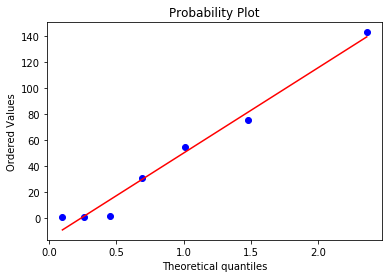



k = 8, size = 22
Number of negative jump times: 11
Mean: 1.0368181818181819


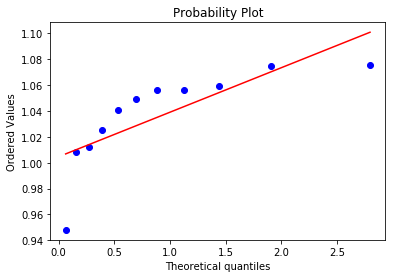



k = 8, size = 23
Number of negative jump times: 41
Mean: 2.0517560975609754


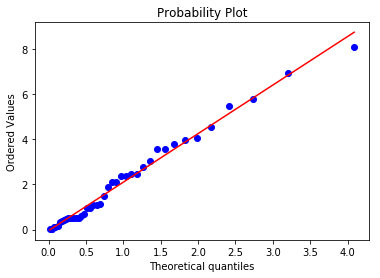



k = 8, size = 24
Number of negative jump times: 14
Mean: 3.374357142857143


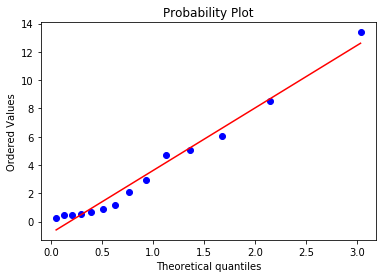



k = 8, size = 25
Number of negative jump times: 0
Mean: nan


k = 8, size = 26
Number of negative jump times: 7
Mean: 2.2374285714285715


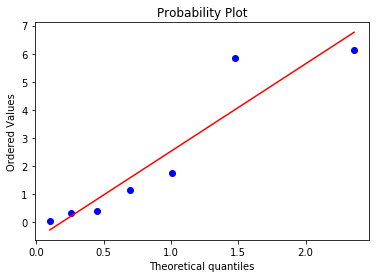



k = 8, size = 27
Number of negative jump times: 3
Mean: 6.416


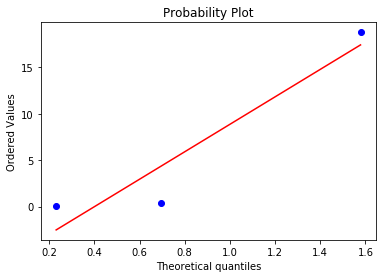



k = 9, size = 1
Number of negative jump times: 260
Mean: 0.7901884615384616


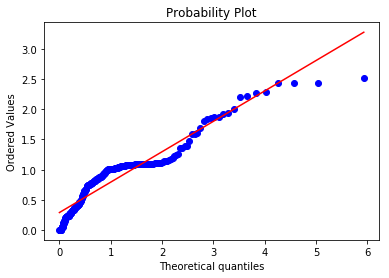



k = 9, size = 2
Number of negative jump times: 234
Mean: 1.6270128205128203


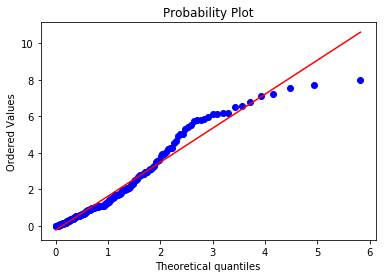



k = 9, size = 3
Number of negative jump times: 334
Mean: 0.8318323353293413


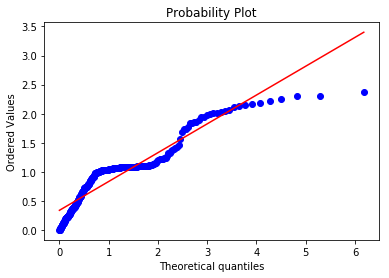



k = 9, size = 4
Number of negative jump times: 282
Mean: 1.0661453900709221


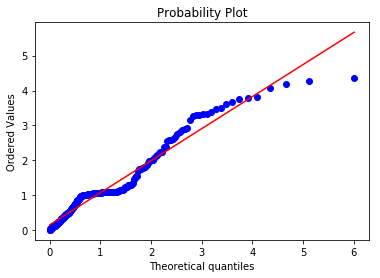



k = 9, size = 5
Number of negative jump times: 185
Mean: 1.5329945945945949


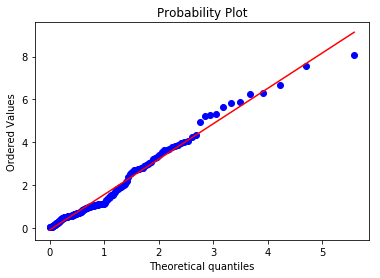



k = 9, size = 6
Number of negative jump times: 214
Mean: 1.5942336448598131


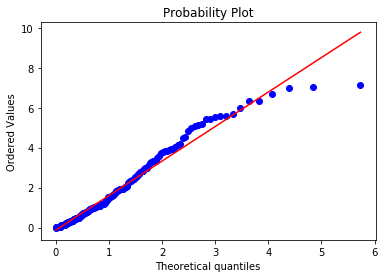



k = 9, size = 7
Number of negative jump times: 62
Mean: 0.8534999999999999


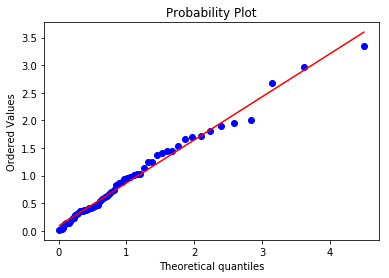



k = 9, size = 8
Number of negative jump times: 66
Mean: 1.4482121212121213


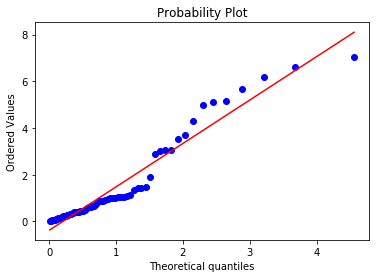



k = 9, size = 9
Number of negative jump times: 11
Mean: 0.8334545454545453


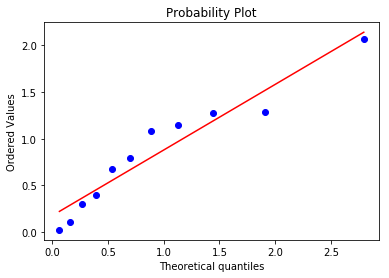



k = 9, size = 10
Number of negative jump times: 7
Mean: 1.966


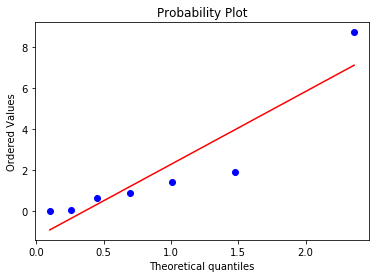



k = 9, size = 11
Number of negative jump times: 4
Mean: 2.67375


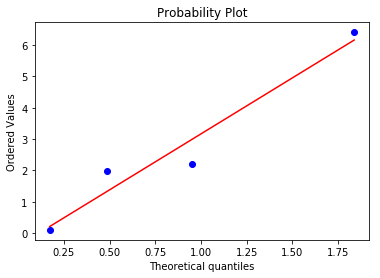



k = 9, size = 12
Number of negative jump times: 1
Mean: 0.095


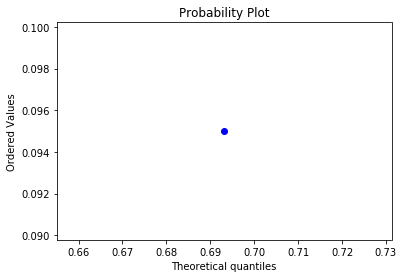



k = 9, size = 13
Number of negative jump times: 1
Mean: 1.106


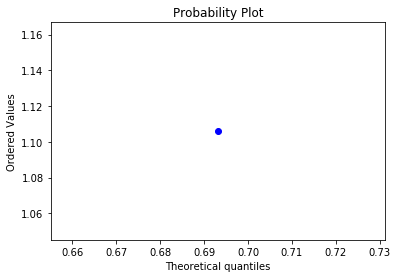



k = 9, size = 14
Number of negative jump times: 0
Mean: nan


k = 9, size = 15
Number of negative jump times: 1
Mean: 0.182


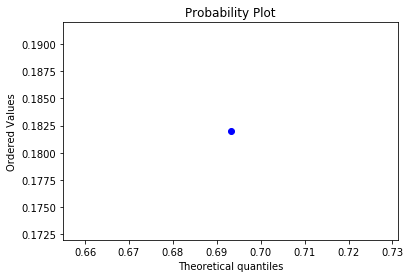



k = 9, size = 16
Number of negative jump times: 0
Mean: nan


k = 9, size = 17
Number of negative jump times: 0
Mean: nan


k = 9, size = 18
Number of negative jump times: 3
Mean: 64.62933333333334


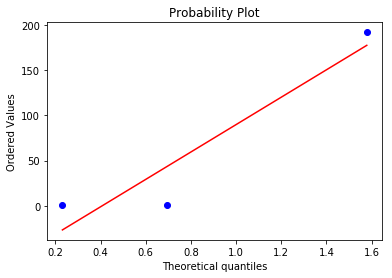



k = 9, size = 19
Number of negative jump times: 8
Mean: 9.02875


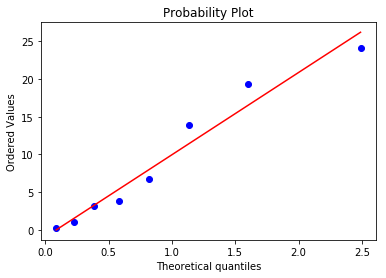



k = 9, size = 20
Number of negative jump times: 144
Mean: 6.312069444444444


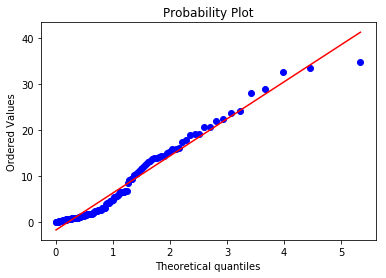



k = 9, size = 21
Number of negative jump times: 63
Mean: 8.603142857142858


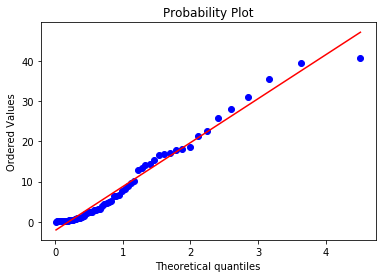



k = 9, size = 22
Number of negative jump times: 58
Mean: 4.003051724137931


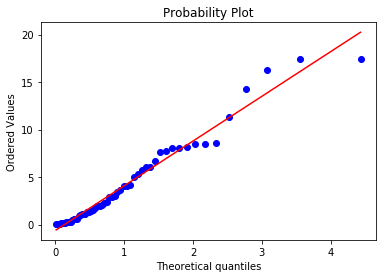



k = 9, size = 23
Number of negative jump times: 59
Mean: 3.607033898305085


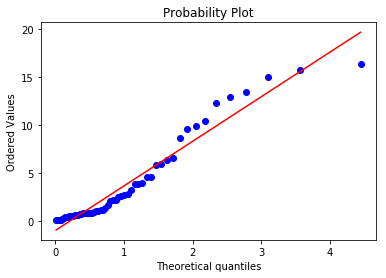



k = 10, size = 1
Number of negative jump times: 289
Mean: 0.8312145328719723


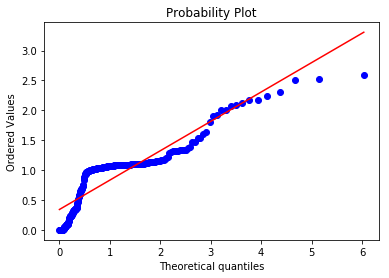



k = 10, size = 2
Number of negative jump times: 245
Mean: 0.9637102040816325


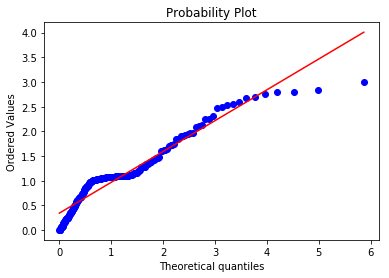



k = 10, size = 3
Number of negative jump times: 252
Mean: 0.7588412698412699


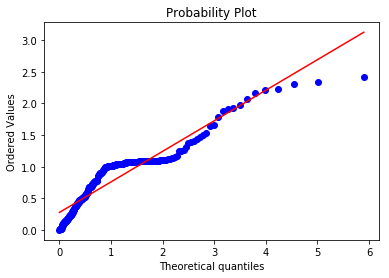



k = 10, size = 4
Number of negative jump times: 267
Mean: 0.846441947565543


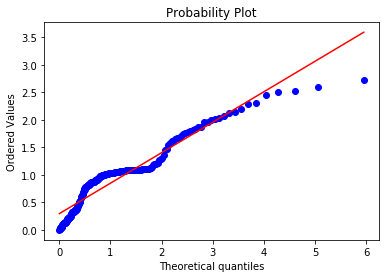



k = 10, size = 5
Number of negative jump times: 205
Mean: 1.5767365853658537


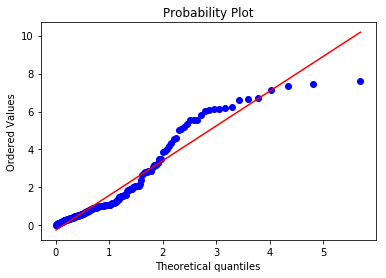



k = 10, size = 6
Number of negative jump times: 386
Mean: 0.7031398963730571


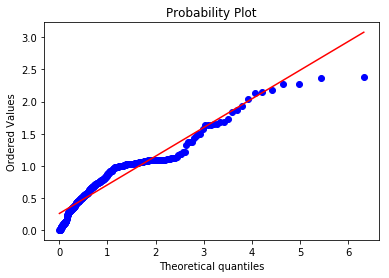



k = 10, size = 7
Number of negative jump times: 161
Mean: 1.8429875776397515


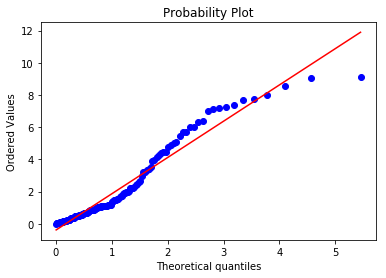



k = 10, size = 8
Number of negative jump times: 174
Mean: 1.338218390804598


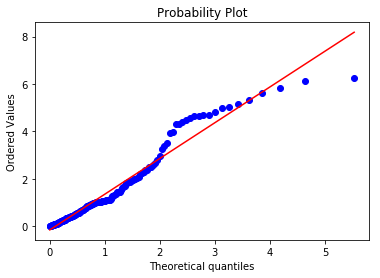



k = 10, size = 9
Number of negative jump times: 256
Mean: 1.874265625


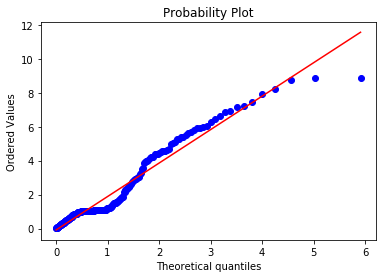



k = 10, size = 10
Number of negative jump times: 206
Mean: 0.8425145631067961


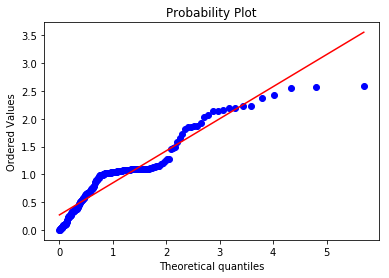



k = 10, size = 11
Number of negative jump times: 160
Mean: 2.465375


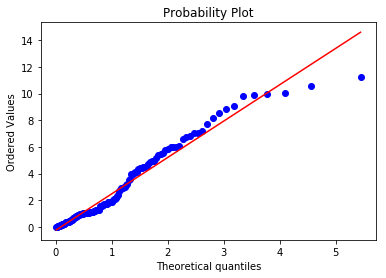



k = 10, size = 12
Number of negative jump times: 88
Mean: 2.132079545454545


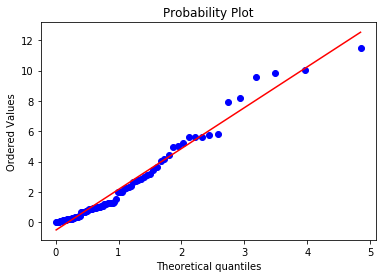



k = 10, size = 13
Number of negative jump times: 70
Mean: 1.5714714285714289


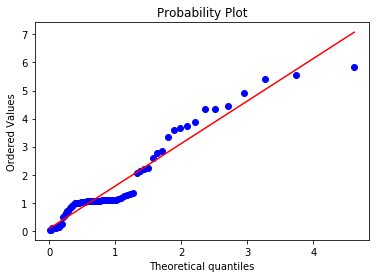



k = 10, size = 14
Number of negative jump times: 31
Mean: 0.6343548387096773


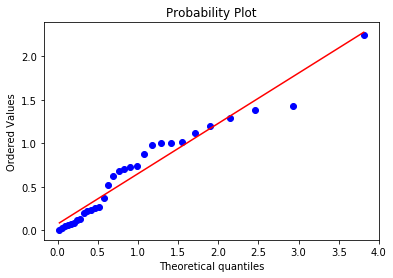



k = 10, size = 15
Number of negative jump times: 2
Mean: 0.6285000000000001


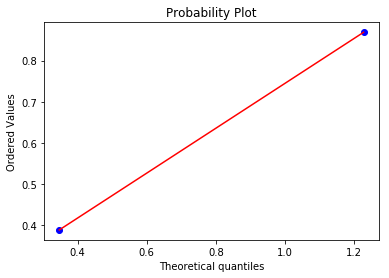



k = 10, size = 16
Number of negative jump times: 3
Mean: 0.7406666666666667


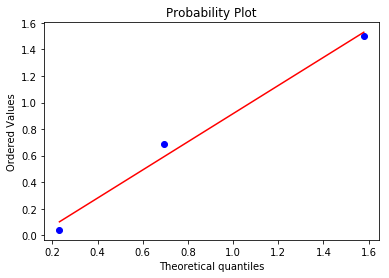



k = 10, size = 17
Number of negative jump times: 0
Mean: nan


k = 10, size = 18
Number of negative jump times: 0
Mean: nan


k = 10, size = 19
Number of negative jump times: 0
Mean: nan


k = 10, size = 20
Number of negative jump times: 0
Mean: nan


k = 10, size = 21
Number of negative jump times: 0
Mean: nan


k = 10, size = 22
Number of negative jump times: 1
Mean: 715.251


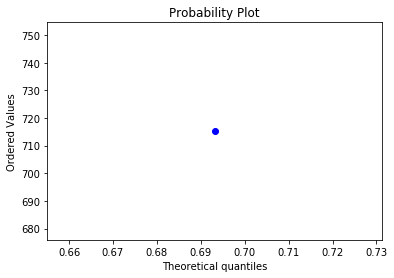



k = 10, size = 23
Number of negative jump times: 33
Mean: 1.2182727272727272


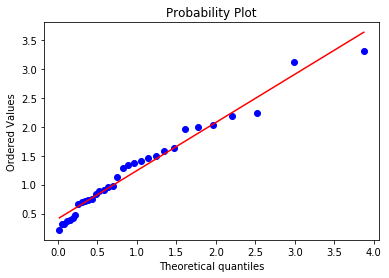



k = 10, size = 24
Number of negative jump times: 11
Mean: 3.5742727272727275


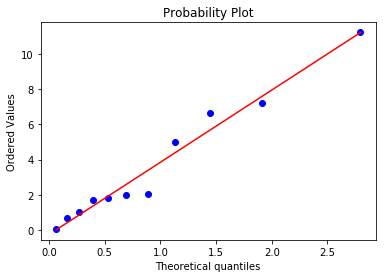



k = 10, size = 25
Number of negative jump times: 6
Mean: 4.477166666666666


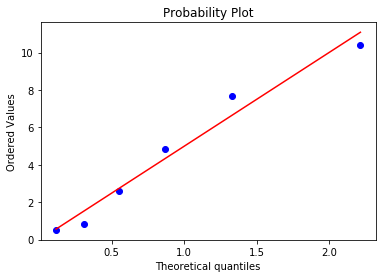



k = 10, size = 26
Number of negative jump times: 3
Mean: 4.483


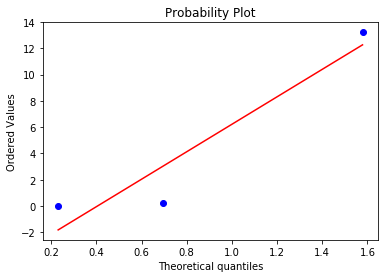



k = 10, size = 27
Number of negative jump times: 1
Mean: 4.915


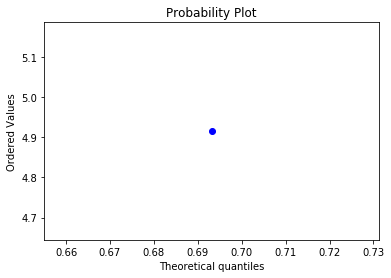



k = 10, size = 28
Number of negative jump times: 1
Mean: 13.666


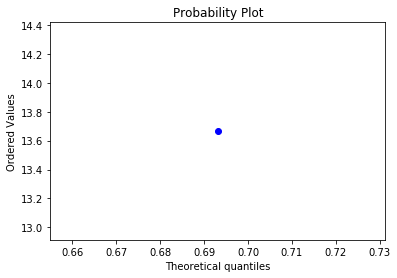



k = 10, size = 29
Number of negative jump times: 1
Mean: 0.226


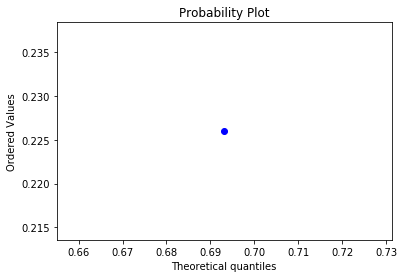



k = 10, size = 30
Number of negative jump times: 1
Mean: 2.978


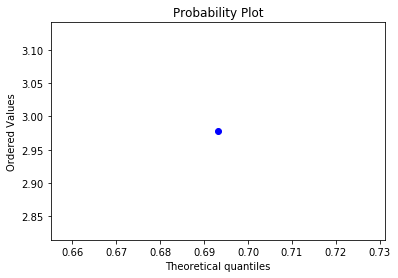

In [215]:
# Remove outliers
def without_outliers(data):
    if len(data) <= 3:
        return data
    quartiles = np.percentile(data,[25,50,75])
    IQR = quartiles[2] - quartiles[0]
    lower_bound = quartiles[0] - 2*IQR
    upper_bound = quartiles[2] + 2*IQR
    return [d for d in data if d >= lower_bound and d <= upper_bound]


for k in time_between_events_pos:
    time_between_events_pos[k] = \
    OrderedDict([(s,without_outliers(ts)) for (s,ts) in time_between_events_pos[k].items()])
    #time_between_events_pos[k] = \
    #OrderedDict([(s,ts) for (s,ts) in time_between_events_pos[k].items() if len(ts) > 20])
# time_between_events_pos = OrderedDict([(k,d) for (k,d) in time_between_events_pos.items() if len(d) > 0])
        
for k in time_between_events_neg:
    time_between_events_neg[k] = \
    OrderedDict([(s,without_outliers(ts)) for (s,ts) in time_between_events_neg[k].items()])
    #time_between_events_neg[k] = \
    #OrderedDict([(s,ts) for (s,ts) in time_between_events_neg[k].items() if len(ts) > 20])    
# time_between_events_neg = OrderedDict([(k,d) for (k,d) in time_between_events_neg.items() if len(d) > 0])

       
for k,v in time_between_events_pos.items():
    for size,times in v.items():
        n = len(times)
        print("k = {}, size = {}".format(k,size))
        print("Number of positive jump times: {}".format(n))
        num_data_points = len(times)
        print("Mean: {}".format(np.mean(times)))
        probplot(times, dist=expon, plot=pylab)
        pylab.show()
        print("\n")

for k,v in time_between_events_neg.items():
    for size,times in v.items():
        n = len(times)
        print("k = {}, size = {}".format(k,size))
        print("Number of negative jump times: {}".format(n))
        num_data_points = len(times)
        print("Mean: {}".format(np.mean(times)))
        probplot(times, dist=expon, plot=pylab)
        pylab.show()
        print("\n")

k = -10
Number of positive jump times: 1
Mean: 64.22725714285714


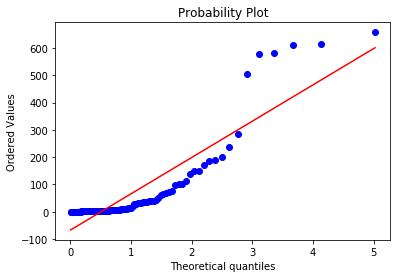



k = -9
Number of positive jump times: 1
Mean: 77.45670229007634


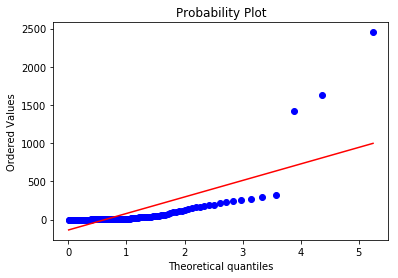



k = -8
Number of positive jump times: 1
Mean: 10.76897140772532


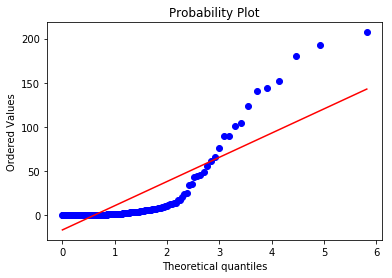



k = -7
Number of positive jump times: 1
Mean: 1.3789733656174332


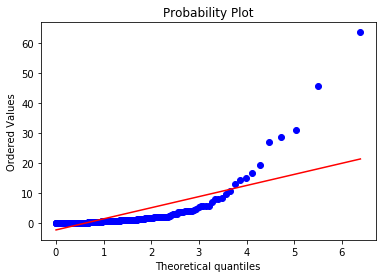



k = -6
Number of positive jump times: 1
Mean: 0.9027268518518519


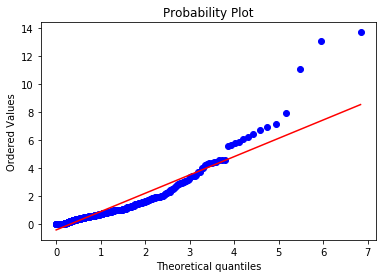



k = -5
Number of positive jump times: 1
Mean: 0.9356730103806228


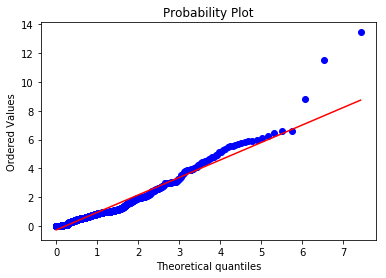



k = -4
Number of positive jump times: 1
Mean: 0.7883887999999999


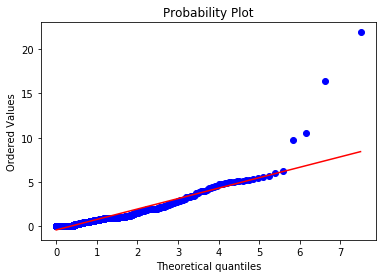



k = -3
Number of positive jump times: 1
Mean: 1.2285222154595254


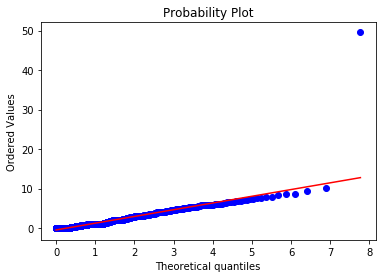



k = -2
Number of positive jump times: 1
Mean: 1.4081079168949773


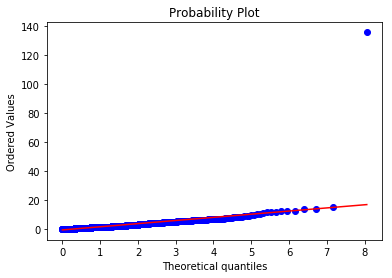



k = -1
Number of positive jump times: 1
Mean: 1.1836950625869262


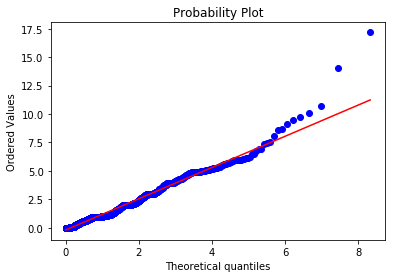



k = 1
Number of positive jump times: 1
Mean: 2.502609941090909


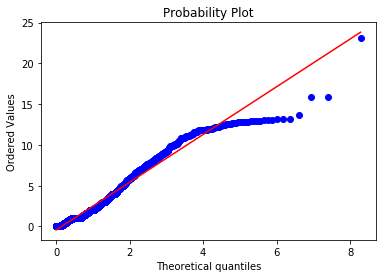



k = 2
Number of positive jump times: 1
Mean: 2.4213894703457024


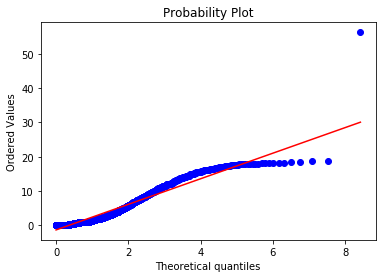



k = 3
Number of positive jump times: 1
Mean: 2.832929299363057


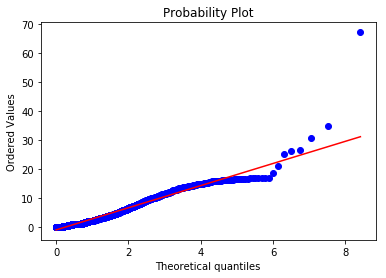



k = 4
Number of positive jump times: 1
Mean: 1.5894961458075174


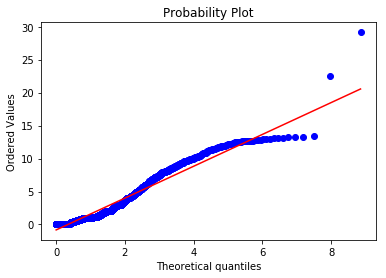



k = 5
Number of positive jump times: 1
Mean: 1.8045681916271037


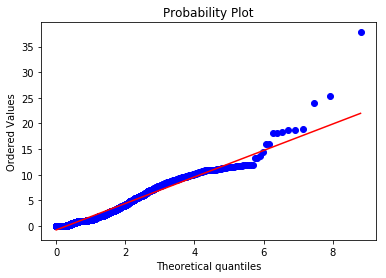



k = 6
Number of positive jump times: 1
Mean: 2.0206753217430573


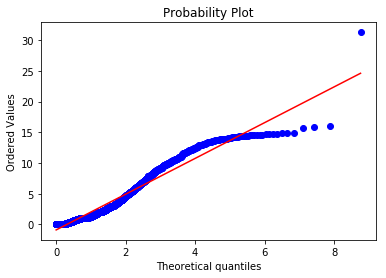



k = 7
Number of positive jump times: 1
Mean: 1.9114773933347484


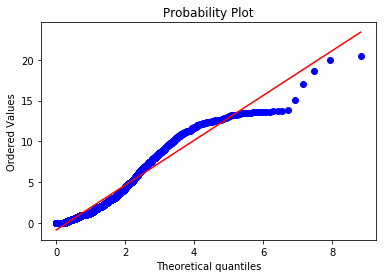



k = 8
Number of positive jump times: 1
Mean: 1.457716534128562


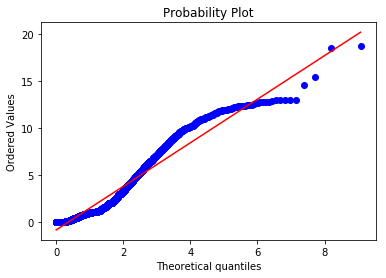



k = 9
Number of positive jump times: 1
Mean: 1.6347248866618944


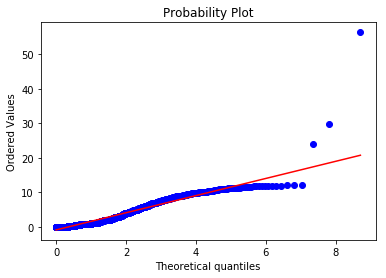



k = 10
Number of positive jump times: 1
Mean: 1.0860064117242958


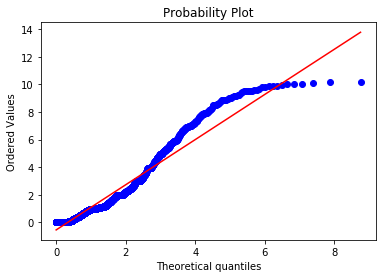

In [216]:
time_between_events_pos_combined = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])
time_between_events_neg_combined = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])

for k in time_between_events_pos:
    time_between_events_pos_combined[k] = [time for (size,times) in time_between_events_pos[k].items() for time in times]
for k in time_between_events_neg:
    time_between_events_neg_combined[k] = [time for (size,times) in time_between_events_neg[k].items() for time in times]

for (k,times) in time_between_events_pos_combined.items():
    print("k = {}".format(k))
    print("Number of positive jump times: {}".format(n))
    num_data_points = len(times)
    print("Mean: {}".format(np.mean(times)))
    probplot(times, dist=expon, plot=pylab)
    pylab.show()
    print("\n")

# Compare to aribrtary exponential distribution

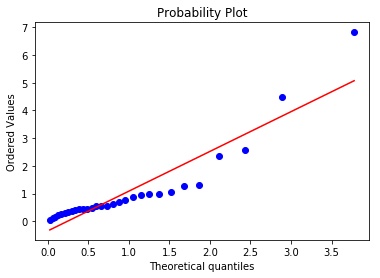

In [13]:
x = [np.random.exponential() for _ in range(30)]
kstest(x,'expon',args=(np.mean(x),))
probplot(x, dist=expon, plot=pylab)
pylab.show()

# Graph Arrival Rates

-10


/Users/andrewwang/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/andrewwang/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


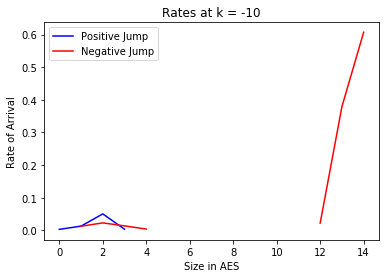

-9


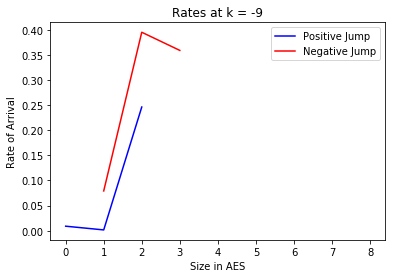

-8


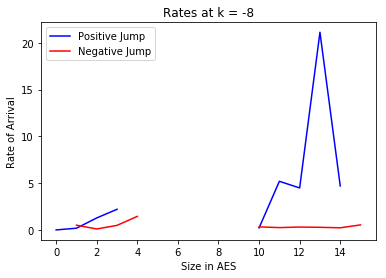

-7


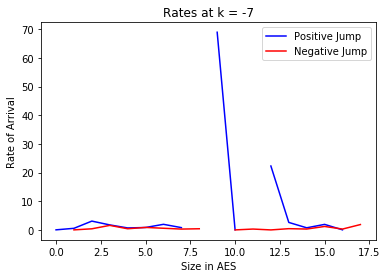

-6


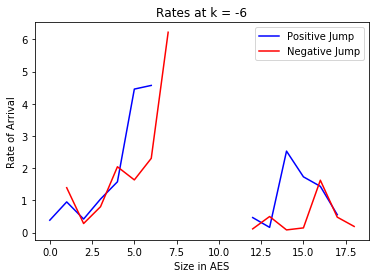

-5


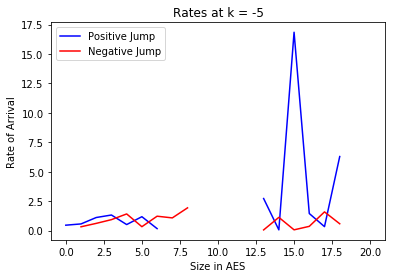

-4


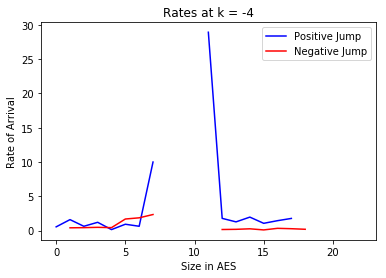

-3


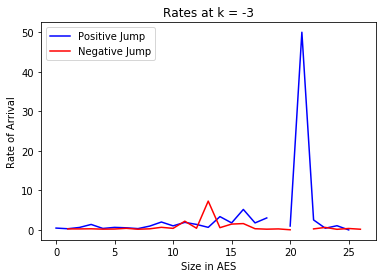

-2


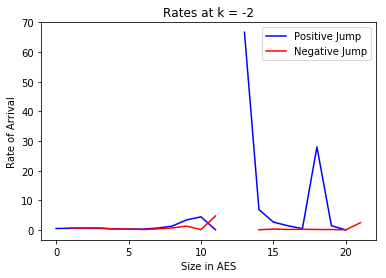

-1


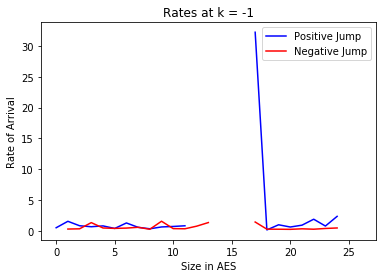

1


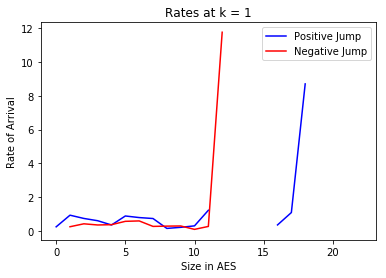

2


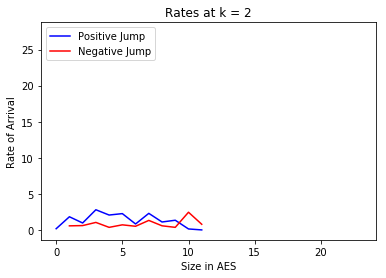

3


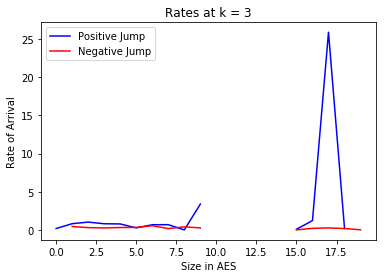

4


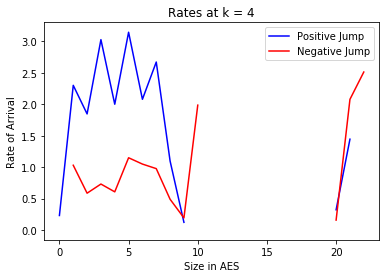

5


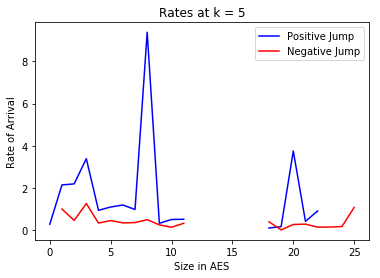

6


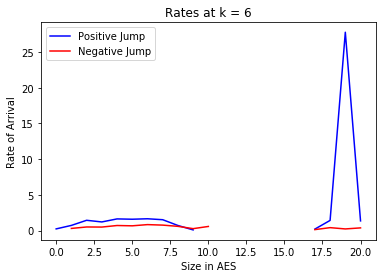

7


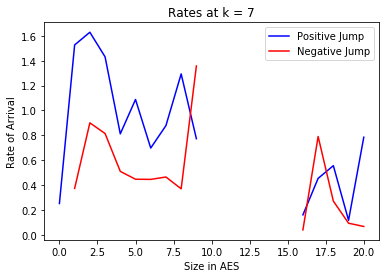

8


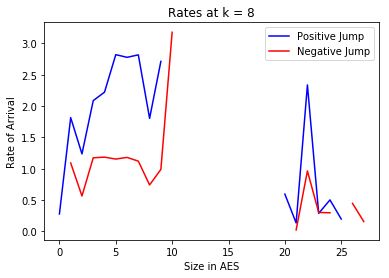

9


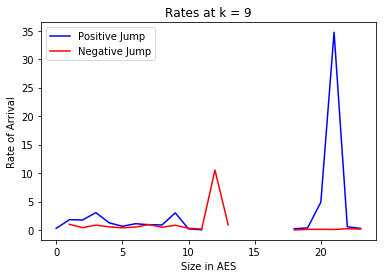

10


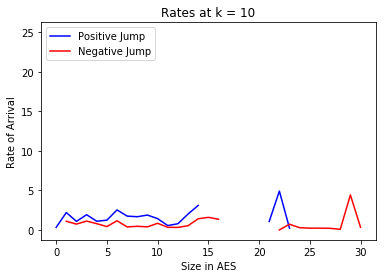

In [14]:
pos_rates_dict = OrderedDict([(k,OrderedDict()) for k in time_between_events_pos])
neg_rates_dict = OrderedDict([(k,OrderedDict()) for k in time_between_events_neg])

for k in pos_rates_dict:
    pos_rates_dict[k] = OrderedDict([(size,1/np.mean(times)) for size,times in time_between_events_pos[k].items()])
for k in neg_rates_dict:
    neg_rates_dict[k] = OrderedDict([(size,1/np.mean(times)) for size,times in time_between_events_neg[k].items()])

for k in range(-K,K+1):
    if k == 0:
        continue
    
    print(k)
        
    if len(pos_rates_dict[k]) > 0:
        pos_size,pos_rates = zip(*(pos_rates_dict[k].items()))
    else:
        pos_size,pos_rates = [],[]
        
    if len(neg_rates_dict[k]) > 0:
        neg_size,neg_rates = zip(*(neg_rates_dict[k].items()))
    else:
        neg_size,neg_rates = [],[]
        
    plt.plot(pos_size,pos_rates,'b')
    plt.plot(neg_size,neg_rates,'r')
    plt.xlabel('Size in AES')
    plt.ylabel('Rate of Arrival')
    plt.title('Rates at k = {}'.format(k))
    plt.legend(['Positive Jump', 'Negative Jump'])
    plt.show()
        
        

In [209]:
time_between_events_pos[-1][0]

[0.023,
 0.011,
 0.052,
 1.141,
 1.062,
 4.504,
 10.205,
 0.675,
 5.232,
 9.664,
 3.642,
 7.63,
 2.538,
 5.058,
 6.736,
 10.707,
 3.273,
 10.311,
 0.068,
 7.469,
 1.276,
 0.126,
 2.096,
 0.91,
 1.742,
 4.376,
 9.685,
 0.969,
 1.312,
 5.254,
 10.597,
 0.947,
 3.888,
 2.882,
 0.022,
 0.378,
 0.443,
 0.57,
 0.491,
 1.538,
 0.443,
 3.19,
 2.898,
 7.496,
 13.089,
 10.629,
 1.334,
 0.823,
 7.572,
 12.463,
 1.13,
 0.876,
 0.959,
 1.943,
 0.029,
 0.56,
 0.411,
 0.651,
 0.85,
 0.349,
 1.186,
 0.569,
 0.034,
 1.03,
 0.346,
 2.174,
 1.649,
 0.523,
 0.361,
 0.59,
 0.722,
 0.326,
 1.148,
 1.682,
 2.364,
 0.572,
 0.778,
 7.156,
 1.012,
 1.934,
 0.462,
 0.444,
 2.105,
 0.622,
 0.558,
 1.551,
 0.556,
 2.301,
 0.445,
 0.523,
 1.21,
 0.156,
 0.395,
 4.072,
 0.856,
 2.322,
 3.243,
 0.038,
 0.517,
 1.522,
 0.669,
 0.053,
 0.059,
 0.11,
 7.006,
 0.656,
 6.656,
 9.051,
 8.787,
 6.083,
 8.194,
 9.886,
 0.89,
 1.145,
 6.978,
 0.437,
 0.73,
 0.525,
 0.556,
 0.981,
 0.916,
 0.041,
 0.99,
 1.093,
 0.771,
 1.184,

# Find (number of positive jumps - number of negative jumps) between time intervals of 1 minutes each

In [15]:
ending_time = updates[-1]['time'] + timedelta(seconds=1)
ending_time + timedelta(seconds = 1)
time_period_length = (ending_time - starting_time).total_seconds()

times = []
time = starting_time
while time <= ending_time:
    time += timedelta(seconds = 60)
    times.append(time)

n = len(times)

changes_at_each_k = OrderedDict([(k,[0 for _ in range(n)]) for k in range(-K,K+1) if k != 0])

i = 0
for u in combined_updates:
    if u['change'] < 0:
        changes_at_each_k[u['k']][i] -= 1
    else:
        changes_at_each_k[u['k']][i] += 1
        
    if u['time'] > times[i]:
        i += 1
        
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df = pd.DataFrame(changes_at_each_k)
correlations = df.corr().astype('object')

significances = correlations.copy()
for k1 in changes_at_each_k:
    for k2 in changes_at_each_k:
        res = pearsonr(changes_at_each_k[k1],changes_at_each_k[k2])
        significances[k1][k2] = res
significances

,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8,9,10
-10,"(1.0, 0.0)","(0.121450482715, 3.80355480422e-06)","(0.0809064926558, 0.00212232988016)","(0.144166103111, 3.91385979006e-08)","(0.126451579677, 1.48185423587e-06)","(0.0776384177191, 0.00319771925152)","(0.105141517559, 6.40259486031e-05)","(-0.140822985881, 8.05124814872e-08)","(0.00431449017591, 0.870060235963)","(0.119100154995, 5.84979388724e-06)","(0.0264819267326, 0.315271668646)","(-0.0155550523554, 0.555327544202)","(-0.0558352020766, 0.0341234563302)","(-0.0928037187951, 0.000421556855913)","(-0.0024115288446, 0.927149534551)","(-0.0119623573902, 0.650144417513)","(-0.00058621179141, 0.98226779132)","(-0.016631606745, 0.528288596036)","(-0.032383676969, 0.21939851457)","(-0.0182273717053, 0.489479524661)"
-9,"(0.121450482715, 3.80355480422e-06)","(1.0, 0.0)","(0.168374378521, 1.27800483446e-10)","(0.174379984747, 2.68991779273e-11)","(0.0330512461291, 0.210038385547)","(0.00794042571425, 0.763367940888)","(0.0568806582257, 0.0309012259507)","(-0.06423719619, 0.0147674819905)","(0.0981370093758, 0.000191624279293)","(0.113023109319, 1.71584193451e-05)","(-0.0831896163178, 0.00158007331498)","(0.00660310320099, 0.802312608177)","(0.0210995549244, 0.423672807406)","(-0.0440138561605, 0.0950050482849)","(0.0211898170597, 0.42169217994)","(-0.00219072361464, 0.933803812443)","(0.0203901268974, 0.439428073004)","(0.009438959811, 0.720432919723)","(0.0505914101544, 0.0549373971938)","(0.0466663325654, 0.0766789314605)"
-8,"(0.0809064926558, 0.00212232988016)","(0.168374378521, 1.27800483446e-10)","(1.0, 0.0)","(0.232771222561, 3.60115726761e-19)","(-0.0197745586138, 0.453367090835)","(0.0284688027534, 0.280322226188)","(0.0464677270158, 0.0779431375494)","(-0.0969784532535, 0.000228193420039)","(0.0537556423922, 0.0413915251075)","(0.0370515041341, 0.159941819935)","(-0.0562089362537, 0.03294005662)","(0.00993909894721, 0.70628949113)","(-0.0250141565549, 0.342852273924)","(-0.0636703428796, 0.0156716644466)","(-0.0846264710294, 0.00130750492223)","(-0.0267288728209, 0.310778583554)","(-0.014108496421, 0.592690313952)","(-0.00229031832585, 0.930801784812)","(0.0456116226304, 0.0835879720196)","(0.0347985620473, 0.186913306324)"
-7,"(0.144166103111, 3.91385979006e-08)","(0.174379984747, 2.68991779273e-11)","(0.232771222561, 3.60115726761e-19)","(1.0, 0.0)","(0.278649155934, 4.3254863985e-27)","(-0.0135297819532, 0.607953593076)","(0.0226517576357, 0.390374991539)","(-0.0572017196323, 0.0299655859429)","(0.116239858718, 9.77191014889e-06)","(0.0523613242352, 0.0469656427793)","(-0.0796599434838, 0.00248579308978)","(-0.0134778238853, 0.609332484)","(-0.0209547994572, 0.426860511458)","(-0.0833066665725, 0.0015560528566)","(-0.0539109620505, 0.0408067504926)","(-0.00499889450991, 0.849676533945)","(0.0282588120656, 0.283886569736)","(-0.0173410567852, 0.510843512754)","(0.0105465366953, 0.689247479363)","(0.0219312355951, 0.405629578241)"
-6,"(0.126451579677, 1.48185423587e-06)","(0.0330512461291, 0.210038385547)","(-0.0197745586138, 0.453367090835)","(0.278649155934, 4.3254863985e-27)","(1.0, 0.0)","(-0.0744740867281, 0.00469033477686)","(0.0365572580239, 0.165591483824)","(0.0884027664264, 0.00078419851853)","(-0.0422072116167, 0.109382762906)","(-0.0132162269595, 0.6162958813)","(0.0383008560686, 0.146310910189)","(0.0775309163366, 0.0032403285633)","(-0.0261445975632, 0.321477791484)","(-0.0369831281799, 0.160714622494)","(-0.0613150290395, 0.0199700151491)","(-0.0174567074303, 0.508028489157)","(-0.00963421867055, 0.71489950352)","(-0.0171646615979, 0.515152733377)","(-0.027627310963, 0.294789618139)","(0.0331456086853, 0.208738957716)"
-5,"(0.0776384177191, 0.00319771925152)","(0.00794042571425, 0.763367940888)","(0.0284688027534, 0.280322226188)","(-0.0135297819532, 0.607953593076)","(-0.0744740867281, 0.00469033477686)","(1.0, 0.0)","(0.554925966843, 4.36670353878e-117)","(-0.142610988077, 5.48556416891e-08)","(0.00229133778693, 0.930771060779)","(0.0033692576890

# Correlation Matrix
## Rows and columns are queue positions, the value is (correlation, p-value) where the p-value is Pearson's correlation
### Highlighted red are those that have correlation > 0.1

In [16]:
threshold = 0.10
def color_significant_red(val):
    global threshold
    if val[0] > 0.99999: # Same index
        color = 'green'
    else:
        color = 'red' if abs(val[0]) > threshold else 'black'
    return 'color: %s' % color

colored_table = significances.loc[-5:5,-5:5].style.applymap(color_significant_red)
colored_table = colored_table.format(lambda x: "{0:.3f},{1:.3f}".format(x[0],x[1]))
colored_table

,-5,-4,-3,-2,-1,1,2,3,4,5
-5,"1.000,0.000","0.555,0.000","-0.143,0.000","0.002,0.931","0.003,0.898","-0.059,0.024","0.056,0.033","0.016,0.555","0.004,0.881","-0.007,0.799"
-4,"0.555,0.000","1.000,0.000","0.011,0.678","0.054,0.042","-0.083,0.002","-0.089,0.001","0.081,0.002","0.019,0.462","-0.031,0.244","-0.037,0.164"
-3,"-0.143,0.000","0.011,0.678","1.000,0.000","-0.108,0.000","-0.024,0.360","-0.075,0.005","-0.095,0.000","0.033,0.214","0.097,0.000","0.009,0.725"
-2,"0.002,0.931","0.054,0.042","-0.108,0.000","1.000,0.000","-0.055,0.036","-0.123,0.000","-0.097,0.000","-0.036,0.175","0.011,0.666","0.028,0.297"
-1,"0.003,0.898","-0.083,0.002","-0.024,0.360","-0.055,0.036","1.000,0.000","0.007,0.803","-0.062,0.018","-0.076,0.004","-0.049,0.064","-0.008,0.756"
1,"-0.059,0.024","-0.089,0.001","-0.075,0.005","-0.123,0.000","0.007,0.803","1.000,0.000","0.041,0.118","-0.118,0.000","-0.070,0.008","-0.053,0.045"
2,"0.056,0.033","0.081,0.002","-0.095,0.000","-0.097,0.000","-0.062,0.018","0.041,0.118","1.000,0.000","-0.015,0.578","-0.123,0.000","-0.041,0.118"
3,"0.016,0.555","0.019,0.462","0.033,0.214","-0.036,0.175","-0.076,0.004","-0.118,0.000","-0.015,0.578","1.000,0.000","-0.028,0.296","-0.134,0.000"
4,"0.004,0.881","-0.031,0.244","0.097,0.000","0.011,0.666","-0.049,0.064","-0.070,0.008","-0.123,0.000","-0.028,0.296","1.000,0.000","-0.017,0.530"
5,"-0.007,0.799","-0.037,0.164","0.009,0.725","0.028,0.297","-0.008,0.756","-0.053,0.045","-0.041,0.118","-0.134,0.000","-0.017,0.530","1.000,0.000"


# Lagged Correlation Matrix

In [17]:
lagged_significances = significances.copy()
for k1 in changes_at_each_k:
    for k2 in changes_at_each_k:
        res = pearsonr(changes_at_each_k[k1][:(n-1)],changes_at_each_k[k2][1:n])
        significances[k1][k2] = res
lagged_significances

,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8,9,10
-10,"(1.0, 0.0)","(0.121450482715, 3.80355480422e-06)","(0.0809064926558, 0.00212232988016)","(0.144166103111, 3.91385979006e-08)","(0.126451579677, 1.48185423587e-06)","(0.0776384177191, 0.00319771925152)","(0.105141517559, 6.40259486031e-05)","(-0.140822985881, 8.05124814872e-08)","(0.00431449017591, 0.870060235963)","(0.119100154995, 5.84979388724e-06)","(0.0264819267326, 0.315271668646)","(-0.0155550523554, 0.555327544202)","(-0.0558352020766, 0.0341234563302)","(-0.0928037187951, 0.000421556855913)","(-0.0024115288446, 0.927149534551)","(-0.0119623573902, 0.650144417513)","(-0.00058621179141, 0.98226779132)","(-0.016631606745, 0.528288596036)","(-0.032383676969, 0.21939851457)","(-0.0182273717053, 0.489479524661)"
-9,"(0.121450482715, 3.80355480422e-06)","(1.0, 0.0)","(0.168374378521, 1.27800483446e-10)","(0.174379984747, 2.68991779273e-11)","(0.0330512461291, 0.210038385547)","(0.00794042571425, 0.763367940888)","(0.0568806582257, 0.0309012259507)","(-0.06423719619, 0.0147674819905)","(0.0981370093758, 0.000191624279293)","(0.113023109319, 1.71584193451e-05)","(-0.0831896163178, 0.00158007331498)","(0.00660310320099, 0.802312608177)","(0.0210995549244, 0.423672807406)","(-0.0440138561605, 0.0950050482849)","(0.0211898170597, 0.42169217994)","(-0.00219072361464, 0.933803812443)","(0.0203901268974, 0.439428073004)","(0.009438959811, 0.720432919723)","(0.0505914101544, 0.0549373971938)","(0.0466663325654, 0.0766789314605)"
-8,"(0.0809064926558, 0.00212232988016)","(0.168374378521, 1.27800483446e-10)","(1.0, 0.0)","(0.232771222561, 3.60115726761e-19)","(-0.0197745586138, 0.453367090835)","(0.0284688027534, 0.280322226188)","(0.0464677270158, 0.0779431375494)","(-0.0969784532535, 0.000228193420039)","(0.0537556423922, 0.0413915251075)","(0.0370515041341, 0.159941819935)","(-0.0562089362537, 0.03294005662)","(0.00993909894721, 0.70628949113)","(-0.0250141565549, 0.342852273924)","(-0.0636703428796, 0.0156716644466)","(-0.0846264710294, 0.00130750492223)","(-0.0267288728209, 0.310778583554)","(-0.014108496421, 0.592690313952)","(-0.00229031832585, 0.930801784812)","(0.0456116226304, 0.0835879720196)","(0.0347985620473, 0.186913306324)"
-7,"(0.144166103111, 3.91385979006e-08)","(0.174379984747, 2.68991779273e-11)","(0.232771222561, 3.60115726761e-19)","(1.0, 0.0)","(0.278649155934, 4.3254863985e-27)","(-0.0135297819532, 0.607953593076)","(0.0226517576357, 0.390374991539)","(-0.0572017196323, 0.0299655859429)","(0.116239858718, 9.77191014889e-06)","(0.0523613242352, 0.0469656427793)","(-0.0796599434838, 0.00248579308978)","(-0.0134778238853, 0.609332484)","(-0.0209547994572, 0.426860511458)","(-0.0833066665725, 0.0015560528566)","(-0.0539109620505, 0.0408067504926)","(-0.00499889450991, 0.849676533945)","(0.0282588120656, 0.283886569736)","(-0.0173410567852, 0.510843512754)","(0.0105465366953, 0.689247479363)","(0.0219312355951, 0.405629578241)"
-6,"(0.126451579677, 1.48185423587e-06)","(0.0330512461291, 0.210038385547)","(-0.0197745586138, 0.453367090835)","(0.278649155934, 4.3254863985e-27)","(1.0, 0.0)","(-0.0744740867281, 0.00469033477686)","(0.0365572580239, 0.165591483824)","(0.0884027664264, 0.00078419851853)","(-0.0422072116167, 0.109382762906)","(-0.0132162269595, 0.6162958813)","(0.0383008560686, 0.146310910189)","(0.0775309163366, 0.0032403285633)","(-0.0261445975632, 0.321477791484)","(-0.0369831281799, 0.160714622494)","(-0.0613150290395, 0.0199700151491)","(-0.0174567074303, 0.508028489157)","(-0.00963421867055, 0.71489950352)","(-0.0171646615979, 0.515152733377)","(-0.027627310963, 0.294789618139)","(0.0331456086853, 0.208738957716)"
-5,"(0.0776384177191, 0.00319771925152)","(0.00794042571425, 0.763367940888)","(0.0284688027534, 0.280322226188)","(-0.0135297819532, 0.607953593076)","(-0.0744740867281, 0.00469033477686)","(1.0, 0.0)","(0.554925966843, 4.36670353878e-117)","(-0.142610988077, 5.48556416891e-08)","(0.00229133778693, 0.930771060779)","(0.0033692576890

In [19]:
colored_table_2 = lagged_significances.loc[-5:5,-5:5].style.applymap(color_significant_red)
colored_table_2 = colored_table.format(lambda x: "{0:.3f},{1:.3f}".format(x[0],x[1]))
colored_table_2

,-5,-4,-3,-2,-1,1,2,3,4,5
-5,"-0.071,0.007","0.030,0.251","0.171,0.000","-0.009,0.726","-0.032,0.232","-0.066,0.012","-0.011,0.675","-0.030,0.254","0.046,0.084","0.005,0.838"
-4,"0.209,0.000","0.179,0.000","-0.070,0.008","0.035,0.180","0.035,0.188","-0.036,0.174","-0.030,0.261","-0.004,0.893","-0.001,0.983","-0.005,0.851"
-3,"0.090,0.001","0.110,0.000","-0.072,0.006","-0.028,0.291","-0.073,0.006","-0.009,0.738","0.041,0.124","0.056,0.035","-0.022,0.398","-0.045,0.087"
-2,"0.006,0.824","0.026,0.316","0.089,0.001","-0.062,0.018","0.009,0.735","0.054,0.042","0.057,0.031","-0.068,0.010","-0.083,0.002","0.001,0.975"
-1,"0.069,0.009","-0.065,0.013","0.022,0.411","0.013,0.627","-0.181,0.000","0.068,0.009","-0.009,0.739","-0.031,0.247","-0.009,0.724","-0.003,0.918"
1,"0.006,0.824","0.019,0.468","0.112,0.000","-0.015,0.569","0.039,0.141","-0.172,0.000","-0.030,0.249","0.043,0.102","0.093,0.000","0.033,0.211"
2,"-0.020,0.446","0.010,0.696","-0.037,0.158","-0.014,0.603","0.047,0.074","0.021,0.429","-0.083,0.002","-0.023,0.384","0.077,0.004","-0.027,0.299"
3,"-0.040,0.125","0.012,0.653","-0.055,0.038","0.043,0.101","-0.011,0.670","0.121,0.000","0.027,0.313","-0.022,0.403","0.027,0.307","-0.022,0.397"
4,"-0.037,0.161","0.022,0.408","0.055,0.036","0.051,0.052","-0.057,0.032","-0.112,0.000","-0.024,0.357","0.114,0.000","-0.162,0.000","0.008,0.773"
5,"0.007,0.779","-0.021,0.426","0.040,0.132","-0.016,0.541","0.008,0.748","0.031,0.239","-0.018,0.498","0.046,0.079","0.067,0.011","-0.152,0.000"


# Do optimization for this model
Partially inspired from the article you sent me, arrival rate intensity of positive and negative jumps at a certain position $k$ is a point process:

$$\lambda(t)^+ = \mu^+ + \phi_1(t-T_0^+) + \phi_2(t-T_0^-) + \phi_3(t-T_1^+) + \phi_4(t-T_1^-) + \phi_5(t-T_{-1}^+) + \phi_6(t-T_{-1}^-)$$

$$\lambda(t)^- = \mu^- + \phi_7(t-T_0^+) + \phi_8(t-T_0^-) + \phi_9(t-T_1^+) + \phi_{10}(t-T_1^-) + \phi_{11}(t-T_{-1}^+) + \phi_{12}(t-T_{-1}^-)$$

where $T_0^+$ is the time of the last positive jump at position $k$, $T_0^-$ is the time of the last negative jump at position $k$, $T_1^+$ is the time of the last positive jump at position $k+1$, and so on.

$\mu^+$ and $\mu^-$ could be the base rates. Each $\phi_i(x) = \alpha_ie^{(-\delta_ix)}$. This would address the fact that previous arrivals at price $k$ as well as at the nearest positions $k+1$ and $k-1$ affect the arrival rate. I suppose I could also take into account more than one previous arrival from each position, or have it depend on even more positions. I could use an MLE to estimate the parameters above.


In [40]:
times_1_pos = []
times_1_neg = []
times_2_pos = []
times_2_neg = []
times_m1_pos = []
times_m1_neg = []

for u in combined_updates:
    t = (u['time'] - starting_time).total_seconds()
    if u['k'] == 1:
        if u['change'] > 0:
            times_1_pos.append(t)
        else:
            times_1_neg.append(t)
    if u['k'] == 2:
        if u['change'] > 0:
            times_2_pos.append(t)
        else:
            times_2_neg.append(t)
    if u['k'] == -1:
        if u['change'] > 0:
            times_m1_pos.append(t)
        else:
            times_m1_neg.append(t)

In [191]:
def likelihood(x,times,other_times,T):
    n = int((len(x) - 1)/2)
    if len(other_times) != n:
        raise Exception('Must provide {} correct number of other times'.format(n))
    
    mu = x[0]
    alpha = x[1:(n+1)]
    beta = x[(n+1):(2*n+1)]
    
    cum = 0
    
    cum += mu*T
    
    for i in range(n):
        prev_time = -np.inf
        for t in other_times[i]:
            cum += alpha[i]/beta[i]*(1-np.exp(-beta[i]*(t-prev_time)))
            prev_time = t
        cum += alpha[i]/beta[i]*(1-np.exp(-beta[i]*(T-prev_time)))
    
    for t in times:
        inner_cum = mu
        for i in range(n):
            index = bisect.bisect_left(other_times[i],t)
            if index == 0:
                prev_time = -np.inf
            else:
                prev_time = other_times[i][index-1]
            inner_cum += alpha[i]*np.exp(-beta[i]*(t-prev_time))
        cum -= np.log(inner_cum)
    
    return cum

def jacobian(x,times,other_times,T):
    n = int((len(x) - 1)/2)
    if len(other_times) != n:
        raise Exception('Must provide {} correct number of other times'.format(n))
        
    res = [0 for _ in range(len(x))]
    
    mu = x[0]
    alpha = x[1:(n+1)]
    beta = x[(n+1):(2*n+1)]
    
    
    #cum = 0
    #cum += mu*T
    
    res[0] += T
    
    for i in range(n):
        prev_time = -np.inf
        for t in other_times[i]:
            #cum += alpha[i]/beta[i]*(1-np.exp(-beta[i]*(t-prev_time)))
            res[i+1] += 1/beta[i]*(1-np.exp(-beta[i]*(t-prev_time)))
            if prev_time == -np.inf:
                res[i+n+1] += (alpha[i]*-beta[i]**-2)
            else:
                res[i+n+1] += alpha[i]*\
                        (-beta[i]**-2 + np.exp(-beta[i]*(t-prev_time))*((t-prev_time)/beta[i] + beta[i]**-2))
            prev_time = t
        #cum += alpha[i]/beta[i]*(1-np.exp(-beta[i]*(T-prev_time)))
        res[i+1] += 1/beta[i]*(1-np.exp(-beta[i]*(T-prev_time)))
        res[i+n+1] += alpha[i]*\
                        (-beta[i]**-2 + np.exp(-beta[i]*(T-prev_time))*((T-prev_time)/beta[i] + beta[i]**-2))

    for t in times:
        inner_cum = mu
        prev_time = [None for _ in range(n)]
        for i in range(n):
            index = bisect.bisect_left(other_times[i],t)
            if index == 0:
                prev_time[i] = -np.inf
            else:
                prev_time[i] = other_times[i][index-1]
            inner_cum += alpha[i]*np.exp(-beta[i]*(t-prev_time[i]))
        # cum -= np.log(inner_cum)
        res[0] -= 1/inner_cum
        for i in range(n):
            if prev_time[i] != -np.inf:
                res[1+i] -= 1/inner_cum*np.exp(-beta[i]*(t-prev_time[i]))
                res[1+i+n] -= 1/inner_cum*(-alpha[i]*(t-prev_time[i]))*np.exp(-beta[i]*(t-prev_time[i]))
                
        
    return res    

In [192]:
likelihood([0.5 for _ in range(13)], times_1_pos, \
           [times_1_pos,times_1_neg,times_2_pos,times_2_neg,times_m1_pos,times_m1_neg],86400)

jacobian([0.5 for _ in range(13)], times_1_pos, \
           [times_1_pos,times_1_neg,times_2_pos,times_2_neg,times_m1_pos,times_m1_neg],86400)

[0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]

54814.222148



[84087.626193446253,
 3538.4607852426866,
 3133.5844055669236,
 4115.7804316599231,
 3912.5877324199159,
 3790.1925257678986,
 3511.8128118690988,
 -2555.7553473999455,
 -2668.235085206758,
 -2955.2870956197048,
 -3109.4363991390655,
 -2602.2104382312236,
 -2678.4869397247435]

In [193]:
from scipy.optimize import minimize
import scipy
from scipy.optimize import LinearConstraint

In [206]:
#linear_constraint = LinearConstraint([[0,1,1,1,1,1,1,0,0,0,0,0,0]], 0, np.inf)
bnds = [(None,None) for _ in range(13)]
bnds[0] = (0.01,None)
for i in range(1,13):
    bnds[i] = (0.01,20)
    
res1 = minimize(likelihood,[1 for _ in range(13)],\
         args=(times_1_pos, \
           [times_1_pos,times_1_neg,times_2_pos,times_2_neg,times_m1_pos,times_m1_neg],86400), \
         bounds=bnds, \
        constraints = [linear_constraint], \
         options={'maxiter':1000000,}, \
         method = 'SLSQP', \
         jac = jacobian)



    
res2 = minimize(likelihood,[1 for _ in range(13)],\
         args=(times_1_neg, \
           [times_1_pos,times_1_neg,times_2_pos,times_2_neg,times_m1_pos,times_m1_neg],86400), \
         bounds=bnds, \
        constraints = [linear_constraint], \
         options={'maxiter':1000000,}, \
         method = 'SLSQP', \
         jac = jacobian)


[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]

98955.9559634

[  0.44219012   0.02146115   0.01999286   0.02316127   0.02232658
   0.02229155   0.0212218   19.9911413   19.99110305  19.9897116
  19.98940586  19.99061286  19.99056025]

40813.9776584

[  1.00000000e-02   1.27959326e-02   2.00000000e+01   1.33457581e-02
   1.80770606e+00   1.30645669e-02   7.95057180e-01   1.99567302e+01
   1.99567281e+01   1.99566733e+01   1.99566606e+01   1.99567092e+01
   1.99567065e+01]

8767.42820436

[  0.13697773  20.          19.9990334   19.99999805  19.99991348
  19.99999855  19.99996138  19.99998493  19.99998464  19.99998483
  19.99998488  19.9999849   19.99998497]

28816.8314114

[  0.05629205   7.29949536  19.99964761   7.29984402   8.44000675
   7.29966553   7.79655493  19.97249951  19.97249804  19.97246333
  19.97245525  19.97248614  19.97248445]

13786.4070233

[  0.02844187   2.91567775  19.99985961   2.91614743   4.44988792
   2.91590715   3.5843201   19.9630124   19.96301052  19

[  1.14267350e-02   5.13955499e-02   3.12229953e+00   3.92144807e-01
   2.78606960e+00   2.48871810e-01   2.75927635e+00   1.29904340e+01
   1.70376589e+01   1.93338265e+01   1.20690407e+01   1.82583472e+01
   1.15488695e+01]

6834.38867985

[  1.07794852e-02   2.68808439e-02   2.82573357e+00   2.57319760e-01
   3.25361709e+00   1.00000003e-02   2.88599538e+00   1.21730077e+01
   1.11647247e+01   1.60704154e+01   1.52741528e+01   1.77764189e+01
   1.25484164e+01]

6817.06535466

[  1.01336661e-02   1.00000000e-02   2.50593779e+00   1.00000000e-02
   3.32774251e+00   1.45036941e-01   2.31217918e+00   1.15808568e+01
   1.00000000e-02   1.38287026e+01   2.00000000e+01   2.00000000e+01
   1.30348583e+01]

67559.3117462

[  1.07149033e-02   2.51927596e-02   2.79375399e+00   2.32587784e-01
   3.26102963e+00   2.35036944e-02   2.82861376e+00   1.21137926e+01
   1.00492523e+01   1.58462442e+01   1.57467375e+01   1.79987770e+01
   1.25970605e+01]

6797.25432929

[  1.06983615e-02   1.15605808e-

[  1.00000022e-02   8.31189808e-02   3.42550372e-01   3.52222254e-01
   4.32430682e+00   1.92292926e-01   4.33896289e+00   1.99999969e+01
   5.65454809e-01   1.99999966e+01   1.99999943e+01   1.99999946e+01
   2.00000000e+01]

5953.6264101

[  1.00000097e-02   8.90562779e-02   3.42219082e-01   3.51450242e-01
   4.32874547e+00   1.90389123e-01   4.33973070e+00   1.99999861e+01
   5.64943755e-01   1.99999850e+01   1.99999749e+01   1.99999761e+01
   2.00000000e+01]

5953.61157379

[  1.00000173e-02   9.17109678e-02   3.42168691e-01   3.48173505e-01
   4.33487002e+00   1.89136678e-01   4.33729673e+00   1.99999753e+01
   5.64994808e-01   1.99999734e+01   1.99999554e+01   1.99999576e+01
   2.00000000e+01]

5953.60751232

[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]

99708.2008405

[  2.69579915e-01   1.64776414e-02   1.66283891e-02   1.80720563e-02
   1.77205744e-02   1.75028968e-02   1.71790237e-02   1.99947444e+01
   1.99946109e+01   1.99938651e+01   1.99937567e+01   1.99943820e+0

[  1.00095939e-02   7.67851761e-01   1.00207669e-02   1.00028740e-02
   1.00159363e-02   1.00027701e-02   1.00049681e-02   1.00177837e-02
   1.99999963e+01   2.00000000e+01   1.99999994e+01   1.99999983e+01
   1.99999968e+01]

23247.2649406

[  1.46561797e-02   1.44625135e+00   3.38381758e+00   4.62718344e-01
   2.60675504e+00   4.44746601e-01   8.17722322e-01   2.84749349e+00
   1.93899881e+01   1.99999352e+01   1.99007939e+01   1.97130425e+01
   1.94818121e+01]

9938.46033055

[  1.14656981e-02   2.85887821e-01   1.00000000e-02   1.00000000e-02
   1.00000000e-02   1.00000000e-02   1.00000000e-02   1.00000000e-02
   2.00000000e+01   1.99999982e+01   2.00000000e+01   2.00000000e+01
   2.00000000e+01]

13064.4468727

[  1.41480203e-02   1.26143608e+00   2.84645752e+00   3.90612265e-01
   2.19316053e+00   3.75502946e-01   6.89073482e-01   2.39555569e+00
   1.94871469e+01   1.99999452e+01   1.99165948e+01   1.97587473e+01
   1.95643457e+01]

9706.06579574

[  1.00000000e-02   1.00000000e-

[  1.00000000e-02   2.08544012e-01   1.13121950e+00   3.74352201e-02
   1.26264807e+00   1.00000000e-02   4.43249482e-01   1.00000000e-02
   2.00000000e+01   2.00000000e+01   2.00000000e+01   2.00000000e+01
   2.00000000e+01]

11166.408261

[  1.29323609e-02   4.57195905e-01   6.94842447e-01   2.68603300e-01
   1.71494616e+00   2.44292688e-01   7.11115996e-01   4.91753864e-01
   1.98964480e+01   1.92661879e+01   1.99831601e+01   1.99500734e+01
   1.99120339e+01]

8710.17004239

[  1.00000000e-02   1.41853918e-01   3.15131142e-01   5.60482804e-02
   1.93662685e+00   1.23691806e-01   1.03181634e+00   1.00000000e-02
   2.00000000e+01   1.99853427e+01   2.00000000e+01   2.00000000e+01
   2.00000000e+01]

10241.5614314

[  1.26391248e-02   4.25661707e-01   6.56871316e-01   2.47347798e-01
   1.73711423e+00   2.32232599e-01   7.43186031e-01   4.43578478e-01
   1.99068032e+01   1.93381034e+01   1.99848441e+01   1.99550660e+01
   1.99208305e+01]

8683.03570266

[  1.00000000e-02   4.78112834e-0

In [207]:
print(res1)
print("Influences at k = 1, positive")
print()

print("mu = {}".format(res1.x[0]))
print()

labels = ["Positive Jumps k = 1 (i = 1)",
         "Negative Jumps k = 1 (i = 2)",
         "Positive Jumps k = 2 (i = 3)",
         "Negative Jumps k = 2 (i = 3)",
         "Positive Jumps k = -1 (i = 4)",
         "Negative Jumps k = -1 (i = 5)"]
for i in range(6):
    print("{}: alpha = {}, beta={}".format(labels[i],res1.x[1+i],res1.x[7+i]))
print()

print(res2)
print("Influences at k = 1, negative")
print()

print("mu = {}".format(res2.x[0]))
print()

for i in range(6):
    print("{}: alpha = {}, beta={}".format(labels[i],res2.x[1+i],res2.x[7+i]))

     fun: 5953.607512318304
     jac: array([  4.77037692e+04,   6.56060000e-02,   3.22793961e-01,
         2.89097933e-01,  -6.12132398e-02,   1.12110428e-01,
         5.49977253e-02,  -3.30880737e-01,  -2.71411054e-01,
        -1.34167644e+00,  -3.04582459e+00,  -6.44046666e-01,
        -1.09925742e+00])
 message: 'Positive directional derivative for linesearch'
    nfev: 73
     nit: 48
    njev: 44
  status: 8
 success: False
       x: array([  1.00000173e-02,   9.17109678e-02,   3.42168691e-01,
         3.48173505e-01,   4.33487002e+00,   1.89136678e-01,
         4.33729673e+00,   1.99999753e+01,   5.64994808e-01,
         1.99999734e+01,   1.99999554e+01,   1.99999576e+01,
         2.00000000e+01])
Influences at k = 1, positive

mu = 0.010000017305526942

Positive Jumps k = 1 (i = 1): alpha = 0.09171096784853056, beta=19.99997525667041
Negative Jumps k = 1 (i = 2): alpha = 0.3421686907657272, beta=0.56499480793869
Positive Jumps k = 2 (i = 3): alpha = 0.34817350477951237, beta=19

# Sample intervals

In [65]:
starting_times, all_updates = zip(*[processed_updates(f,10) for f in ['12_28_18.json','12_29_18.json','12_30_18.json']])

In [139]:
def updates_during_period(all_updates, start, end):
    return [u for u in all_updates if u['time'] >= start and u['time'] < end]

def updates_during_random_period(all_updates, starting_time, size):
    ending_time = all_updates[-1]['time']
    total_length = (ending_time - starting_time).total_seconds()
    interval_start = starting_time + timedelta(seconds=np.random.uniform()*(total_length - size))
    return updates_during_period(all_updates, interval_start, interval_start + timedelta(seconds=size))

def updates_during_random_period_multiple_dates(updates, starting_times, size):
    ending_times = [u[-1]['time'] for u in updates]
    probabilities = [(e-s).total_seconds() - size for (s,e) in zip(starting_times, ending_times)]
    probabilities = [p/sum(probabilities) for p in probabilities]
    I = np.random.choice(len(updates), p=probabilities)
    return updates_during_random_period(updates[I], starting_times[I], size)

In [160]:
K = 10
positive_updates = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])
negative_updates = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])

for _ in range(100):
    updates = updates_during_random_period_multiple_dates([combined_updates], [starting_time], 60)
    num_positive = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
    num_negative = OrderedDict([(k,0) for k in range(-K,K+1) if k != 0])
    
    for u in updates:
        if u['change'] > 0:
            num_positive[u['k']] += 1
        else:
            num_negative[u['k']] += 1
            
    for k in range(-K,K+1):
        if k != 0:
            positive_updates[k].append(num_positive[k])
            negative_updates[k].append(num_negative[k])
            

In [161]:
df = pd.DataFrame(positive_updates)
pos_pos_correlations = df.corr().astype('object')
pos_pos_correlations_styled = pos_pos_correlations.loc[-8:8,-8:8].style.format(lambda x: "{0:.3f}".format(x))
pos_pos_correlations_styled

,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8
-8,1.000,0.458,0.295,0.084,0.099,0.093,0.168,0.205,0.179,0.236,-0.033,0.099,-0.008,0.006,-0.004,-0.028
-7,0.458,1.000,0.542,0.253,0.227,0.248,0.211,0.170,0.348,0.505,0.396,0.080,0.050,0.098,0.218,0.349
-6,0.295,0.542,1.000,0.617,0.241,0.229,0.127,0.131,0.265,0.265,0.229,0.194,0.139,0.044,0.069,-0.032
-5,0.084,0.253,0.617,1.000,0.545,0.348,0.211,0.182,0.247,0.172,0.205,0.292,0.265,0.060,0.204,-0.013
-4,0.099,0.227,0.241,0.545,1.000,0.746,0.427,0.299,0.395,0.302,0.287,0.362,0.370,0.223,0.399,-0.023
-3,0.093,0.248,0.229,0.348,0.746,1.000,0.602,0.390,0.408,0.340,0.303,0.304,0.239,0.262,0.424,-0.057
-2,0.168,0.211,0.127,0.211,0.427,0.602,1.000,0.397,0.477,0.391,0.222,0.101,0.148,0.172,0.325,0.107
-1,0.205,0.170,0.131,0.182,0.299,0.390,0.397,1.000,0.390,0.281,0.266,0.176,0.228,0.190,0.356,0.098
1,0.179,0.348,0.265,0.247,0.395,0.408,0.477,0.390,1.000,0.595,0.391,0.137,0.279,0.315,0.293,-0.012
2,0.236,0.505,0.265,0.172,0.302,0.340,0.391,0.281,0.595,1.000,0.563,0.033,0.181,0.145,0.347,0.361


In [163]:
pos_neg_correlations = pos_pos_correlations.copy()
for i in range(-K,K+1):
    for j in range(-K,K+1):
        if i != 0 and j != 0:
            pos_neg_correlations[i][j] = np.corrcoef(positive_updates[i], negative_updates[j])[0][1]
pos_neg_correlations_styled = pos_neg_correlations.loc[-8:8,-8:8].style.format(lambda x: "{0:.3f}".format(x))
pos_neg_correlations_styled

,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8
-8,0.769,0.512,0.353,0.253,0.328,0.291,0.272,0.396,0.333,0.317,0.110,0.149,0.020,0.053,0.242,0.014
-7,0.379,0.870,0.507,0.303,0.244,0.167,0.160,0.310,0.324,0.411,0.352,0.060,0.053,0.048,0.248,0.370
-6,0.259,0.509,0.961,0.625,0.209,0.202,0.103,0.088,0.213,0.240,0.210,0.157,0.118,0.036,0.024,-0.003
-5,0.084,0.200,0.610,0.968,0.523,0.313,0.239,0.150,0.233,0.176,0.171,0.218,0.262,0.050,0.163,-0.001
-4,0.134,0.255,0.253,0.547,0.956,0.653,0.344,0.254,0.316,0.213,0.248,0.418,0.327,0.150,0.294,0.009
-3,0.056,0.283,0.262,0.395,0.745,0.978,0.621,0.394,0.419,0.366,0.339,0.340,0.264,0.261,0.447,-0.028
-2,0.156,0.230,0.132,0.231,0.462,0.659,0.973,0.437,0.498,0.422,0.258,0.120,0.152,0.197,0.369,0.160
-1,0.253,0.232,0.175,0.173,0.346,0.459,0.432,0.922,0.372,0.270,0.279,0.193,0.203,0.160,0.303,0.063
1,0.139,0.343,0.206,0.186,0.300,0.266,0.416,0.403,0.928,0.584,0.396,0.073,0.246,0.278,0.241,0.064
2,0.251,0.490,0.290,0.189,0.316,0.355,0.385,0.331,0.636,0.967,0.567,0.060,0.199,0.143,0.401,0.250


In [164]:
df = pd.DataFrame(negative_updates)
neg_neg_correlations = df.corr().astype('object')
neg_neg_correlations_styled = neg_neg_correlations.loc[-8:8,-8:8].style.format(lambda x: "{0:.3f}".format(x))
neg_neg_correlations_styled

,-8,-7,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,7,8
-8,1.000,0.591,0.285,0.195,0.350,0.296,0.279,0.368,0.298,0.391,0.112,0.186,-0.011,0.085,0.157,-0.017
-7,0.591,1.000,0.466,0.236,0.290,0.201,0.181,0.287,0.379,0.442,0.333,0.086,0.016,0.091,0.108,0.355
-6,0.285,0.466,1.000,0.644,0.219,0.225,0.106,0.118,0.175,0.260,0.192,0.177,0.137,0.027,0.053,-0.011
-5,0.195,0.236,0.644,1.000,0.511,0.343,0.252,0.149,0.182,0.183,0.165,0.226,0.278,0.052,0.146,-0.012
-4,0.350,0.290,0.219,0.511,1.000,0.658,0.365,0.287,0.250,0.225,0.280,0.460,0.311,0.157,0.265,0.002
-3,0.296,0.201,0.225,0.343,0.658,1.000,0.672,0.457,0.287,0.380,0.388,0.370,0.263,0.294,0.464,-0.022
-2,0.279,0.181,0.106,0.252,0.365,0.672,1.000,0.471,0.419,0.414,0.315,0.140,0.143,0.222,0.393,0.163
-1,0.368,0.287,0.118,0.149,0.287,0.457,0.471,1.000,0.320,0.289,0.316,0.186,0.211,0.217,0.236,0.051
1,0.298,0.379,0.175,0.182,0.250,0.287,0.419,0.320,1.000,0.631,0.415,0.100,0.212,0.299,0.172,0.068
2,0.391,0.442,0.260,0.183,0.225,0.380,0.414,0.289,0.631,1.000,0.574,0.102,0.168,0.180,0.368,0.264


In [67]:
threshold = 0.10
def color_significant_red(val):
    global threshold
    if val[0] > 0.99999: # Same index
        color = 'green'
    else:
        color = 'red' if abs(val[0]) > threshold else 'black'
    return 'color: %s' % color

r = 4
updates = OrderedDict([((k,"pos"),[]) for k in range(-r,r+1) if k != 0] + \
                      [((k,"neg"),[]) for k in range(-r,r+1) if k != 0])

for k in range(-r,r+1):
    if k != 0:
        updates[(k,"pos")] = positive_updates[k]
for k in range(-r,r+1):
    if k != 0:
        updates[(k,"neg")] = negative_updates[k]


pd.set_option('display.float_format', lambda x: '%.3f' % x)
df = pd.DataFrame(updates)
correlations = df.corr().astype('object')

significances = correlations.copy()
for k1 in updates:
    for k2 in updates:
        res = pearsonr(updates[k1],updates[k2])
        significances[k1][k2] = res
significances

colored_table = significances.style.applymap(color_significant_red)
colored_table = colored_table.format(lambda x: "{0:.3f},{1:.3f}".format(x[0],x[1]))
colored_table

,,-4,-3,-2,-1,1,2,3,4,-4,-3,-2,-1,1,2,3,4
,,pos,pos,pos,pos,pos,pos,pos,pos,neg,neg,neg,neg,neg,neg,neg,neg
-4,pos,"1.000,0.000","0.569,0.000","0.270,0.007","0.246,0.014","0.401,0.000","0.157,0.118","0.212,0.035","0.211,0.035","0.960,0.000","0.599,0.000","0.341,0.001","0.193,0.055","0.319,0.001","0.152,0.132","0.242,0.015","0.233,0.020"
-3,pos,"0.569,0.000","1.000,0.000","0.536,0.000","0.408,0.000","0.390,0.000","0.230,0.021","0.276,0.005","0.210,0.036","0.460,0.000","0.968,0.000","0.654,0.000","0.393,0.000","0.284,0.004","0.207,0.039","0.274,0.006","0.236,0.018"
-2,pos,"0.270,0.007","0.536,0.000","1.000,0.000","0.459,0.000","0.480,0.000","0.182,0.069","0.161,0.109","0.079,0.433","0.190,0.059","0.535,0.000","0.957,0.000","0.445,0.000","0.460,0.000","0.191,0.056","0.139,0.169","0.089,0.378"
-1,pos,"0.246,0.014","0.408,0.000","0.459,0.000","1.000,0.000","0.411,0.000","0.250,0.012","0.305,0.002","0.213,0.034","0.146,0.147","0.409,0.000","0.529,0.000","0.941,0.000","0.400,0.000","0.276,0.005","0.279,0.005","0.219,0.028"
1,pos,"0.401,0.000","0.390,0.000","0.480,0.000","0.411,0.000","1.000,0.000","0.392,0.000","0.263,0.008","0.153,0.128","0.320,0.001","0.378,0.000","0.522,0.000","0.357,0.000","0.938,0.000","0.402,0.000","0.285,0.004","0.150,0.136"
2,pos,"0.157,0.118","0.230,0.021","0.182,0.069","0.250,0.012","0.392,0.000","1.000,0.000","0.454,0.000","0.116,0.249","0.096,0.343","0.259,0.009","0.205,0.040","0.182,0.071","0.404,0.000","0.979,0.000","0.443,0.000","0.156,0.122"
3,pos,"0.212,0.035","0.276,0.005","0.161,0.109","0.305,0.002","0.263,0.008","0.454,0.000","1.000,0.000","0.279,0.005","0.143,0.156","0.303,0.002","0.218,0.030","0.236,0.018","0.258,0.009","0.476,0.000","0.961,0.000","0.325,0.001"
4,pos,"0.211,0.035","0.210,0.036","0.079,0.433","0.213,0.034","0.153,0.128","0.116,0.249","0.279,0.005","1.000,0.000","0.175,0.081","0.214,0.033","0.118,0.240","0.236,0.018","0.080,0.426","0.104,0.301","0.231,0.021","0.973,0.000"
-4,neg,"0.960,0.000","0.460,0.000","0.190,0.059","0.146,0.147","0.320,0.001","0.096,0.343","0.143,0.156","0.175,0.081","1.000,0.000","0.497,0.000","0.245,0.014","0.081,0.422","0.261,0.009","0.098,0.333","0.194,0.053","0.194,0.053"


In [57]:
updates_during_random_period(shortened_updates, starting_time,60)

2018-12-29 04:08:01.104000+00:00


[{'LOB': OrderedDict([(-10, 28.50353805),
               (-9, 77.37007016),
               (-8, 170.469384),
               (-7, 576.73017867),
               (-6, 98.24917567),
               (-5, 661.96056779),
               (-4, 7449.82853774),
               (-3, 4936.02882425),
               (-2, 1031.89731197),
               (-1, 345.11),
               (1, 21.89575752),
               (2, 1021.06716977),
               (3, 1696.139),
               (4, 1393.45664032),
               (5, 5845.7268657),
               (6, 11.2),
               (7, 9.1),
               (8, 37.6),
               (9, 40.4),
               (10, 254.1799478)]),
  'change': -62.59999999999991,
  'k': 4,
  'reference_price': 481.5,
  'time': datetime.datetime(2018, 12, 28, 5, 35, 22, 654000, tzinfo=tzutc())},
 {'LOB': OrderedDict([(-10, 28.50353805),
               (-9, 77.37007016),
               (-8, 170.469384),
               (-7, 576.73017867),
               (-6, 98.24917567),
               (-

# Find Average Event Sizes and Average Rate

In [133]:
K = 10
def AES_and_Rate(updates, starting_times):
    event_sizes_pos = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])
    event_sizes_neg = OrderedDict([(k,[]) for k in range(-K,K+1) if k != 0])
    
    for i in range(len(updates)):
        for u in updates[i]:
            if u['change'] > 0:
                event_sizes_pos[u['k']].append(u['change'])
            else:
                event_sizes_neg[u['k']].append(-u['change'])
                
    ending_times = [us[-1]['time'] for us in updates]
    total_time = np.sum([(e-s).total_seconds() for s,e in zip(starting_times,ending_times)])
                
    AESs = OrderedDict([((k,"pos"),0) for k in range(-K,K+1) if k != 0] + \
                       [((k,"neg"),0) for k in range(-K,K+1) if k != 0])
    numbers_of_events = OrderedDict([((k,"pos"),0) for k in range(-K,K+1) if k != 0] + \
                                   [((k,"neg"),0) for k in range(-K,K+1) if k != 0])
    average_rates = OrderedDict([((k,"pos"),0) for k in range(-K,K+1) if k != 0] + \
                                [((k,"neg"),0) for k in range(-K,K+1) if k != 0])
    
    for (k,sizes) in event_sizes_pos.items():
        AESs[(k,"pos")] = np.mean(sizes)
        numbers_of_events[(k,"pos")] = len(sizes)
        
    for (k,sizes) in event_sizes_neg.items():
        AESs[(k,"neg")] = np.mean(sizes)
        numbers_of_events[(k,"neg")] = len(sizes)
        
    for k in numbers_of_events:
        average_rates[k] = numbers_of_events[k] / total_time
        
    return AESs, numbers_of_events, average_rates
            

AESs, numbers_of_events, average_rates = AES_and_Rate([combined_updates], [starting_time])

for k in range(-K,K+1):
    if k != 0:
        print("k = {}".format(k))
        print("AES Positive: {}".format(AESs[(k,"pos")]))
        print("Average Rate: {}".format(average_rates[(k,"pos")]))
        print("AES Negative: {}".format(AESs[(k,"neg")]))
        print("Average Rate: {}".format(average_rates[(k,"neg")]))
        print()


k = -10
AES Positive: 536.7206216497101
Average Rate: 0.0015971662227276526
AES Negative: 550.861694173561
Average Rate: 0.0023726019975302084

k = -9
AES Positive: 331.1257670644928
Average Rate: 0.0031943324454553053
AES Negative: 280.92776646258284
Average Rate: 0.0034952478207518193

k = -8
AES Positive: 534.5932921026289
Average Rate: 0.004490583292886444
AES Negative: 659.5133130197675
Average Rate: 0.00497667736067312

k = -7
AES Positive: 566.1041314903042
Average Rate: 0.01445551168251332
AES Negative: 577.186233375725
Average Rate: 0.013969417614726642

k = -6
AES Positive: 520.4931408977129
Average Rate: 0.04797285502323275
AES Negative: 537.978198936816
Average Rate: 0.046491425483311456

k = -5
AES Positive: 471.58372169073675
Average Rate: 0.08813348395703677
AES Negative: 470.2113053492907
Average Rate: 0.08859643068826217

k = -4
AES Positive: 463.9714144188066
Average Rate: 0.1036769204579298
AES Negative: 453.1586969730313
Average Rate: 0.10549398637798951

k = -3
AES